



# 📘 Dataset Description

### **Optimized for Black-Litterman, Entropy, ESG, and Game Theory-Based Portfolio Models**

This dataset presents curated financial data from a selection of high-quality **Indian listed companies**, structured specifically to support advanced financial modeling and portfolio optimization techniques. Each data point is selected to integrate seamlessly into models that utilize:

* **🧠 Black-Litterman Model** – for blending market equilibrium with subjective investor views
* **♻️ Entropy-Based Allocation** – to ensure diversification and reduce portfolio concentration risk
* **🌱 ESG Factors** – for sustainability-aligned investment strategies
* **🎯 Game Theory** – for modeling strategic interaction between assets or market regimes

---

### 📂 Columns and Their Meaning:

| Column Name        | Description                                                           |
| ------------------ | --------------------------------------------------------------------- |
| `Name`             | Company name (e.g., HDFC Bank, Tata Motors, Nestle India)             |
| `P/E`              | **Price-to-Earnings Ratio** – Market valuation multiple               |
| `Div Yld %`        | **Dividend Yield (%)** – Returns through dividends                    |
| `NP Qtr Rs.Cr.`    | **Quarterly Net Profit (₹ Crores)** – Indicator of profitability      |
| `Qtr Profit Var %` | **Quarterly Profit Growth (%)** – Performance trend over last quarter |
| `Sales Qtr Rs.Cr.` | **Quarterly Revenue (₹ Crores)** – Top-line business performance      |
| `Qtr Sales Var %`  | **Sales Growth (%)** – Change in revenue compared to previous quarter |

---

### 🧮 Strategic Use Cases

| Modeling Focus              | Relevant Columns                          | Role in Modeling                                              |
| --------------------------- | ----------------------------------------- | ------------------------------------------------------------- |
| **Valuation Analysis**      | `P/E`, `Div Yld %`                        | To identify undervalued or overvalued stocks                  |
| **Profitability Metrics**   | `NP Qtr Rs.Cr.`, `Qtr Profit Var %`       | Used in alpha signal generation and view modeling (BL model)  |
| **Growth Analysis**         | `Sales Qtr Rs.Cr.`, `Qtr Sales Var %`     | Momentum or fundamental growth factor                         |
| **Entropy Diversification** | All numerical columns                     | Entropy calculated from normalized distributions              |
| **ESG Scoring (Proxy)**     | `Div Yld %`, Profit & Growth metrics      | Sustainability-linked performance indicators                  |
| **Game Theory Input**       | Cross-company matrices of returns & risks | Construct payoff matrices to optimize strategic asset weights |
| **Black-Litterman Views**   | Returns & Growth Data                     | Integrates subjective views with market equilibrium           |

---

### ✅ Ideal For:

* 🎯 **Modern Portfolio Optimization**
* 📈 **Smart Beta & Factor Investing**
* 🌍 **Sustainable ESG-Aligned Portfolios**
* 🔐 **Entropy-Based Risk Management**
* 🎲 **Game Theory-Based Strategic Allocation**
* 🧠 **Bayesian Modeling via Black-Litterman**





Portfolio optimization is a crucial task in finance aimed at maximizing returns while managing risk through the strategic allocation of assets. Modern advancements have enabled the integration of diverse methodologies and data-driven approaches to enhance portfolio construction, among which machine learning (ML) stands out by harnessing complex data patterns for better decision-making. A comprehensive ML model for portfolio optimization can combine several sophisticated methods—Black-Litterman, Environmental, Social, and Governance (ESG) analysis, entropy-based diversification, and game theory—to create a robust, adaptive, and responsible investment strategy. The Black-Litterman model enriches traditional mean-variance optimization by blending market equilibrium with investor views, thereby producing more stable and calibrated expected returns that reflect both market consensus and subjective insights. Incorporating ESG factors ensures that the portfolio aligns with sustainability and ethical standards, addressing the growing market demand for responsible investments and mitigating long-term risks linked to environmental, social, and governance issues. Entropy-based methods contribute by quantifying diversification and uncertainty within portfolio weights, encouraging a well-balanced allocation that avoids concentration risk while adapting to changing market dynamics. Finally, game theory adds a strategic dimension by modeling the interactions between multiple market participants or competing assets, seeking equilibrium solutions that optimize returns considering competitive behaviors and market impact. Together, these approaches enable an ML-enhanced portfolio optimization framework that balances risk, return, diversification, sustainability, and strategic interaction to achieve superior and resilient investment performance in complex financial markets.

In [1]:
pip install PyPortfolioOpt

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install nashpy

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_classif
from pypfopt import EfficientFrontier, risk_models, expected_returns
from pypfopt.black_litterman import BlackLittermanModel
from sklearn.tree import DecisionTreeClassifier
import math
from scipy.optimize import minimize

In [4]:
import nashpy as nash

In [5]:
import yfinance as yf

In [6]:
# List of stock symbols
tickers = {
    ## large cap stocks
    "TCS": "TCS.NS",
    "Infosys": "INFY.NS",
    "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS",
    "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS",
    "ITC": "ITC.NS",
    "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS",
    "Tata Steel": "TATASTEEL.NS",
    "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS",
    "Reliance Industr": "RELIANCE.NS",
    "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS",
    "L&T Finance Ltd": "LTF.NS",
    "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS",
    "Lodha Developers": "LODHA.NS",
    "Godrej Propert.": "GODREJPROP.NS",

    # mid cap stocks
    "Hindustan Zinc Ltd": "HINDZINC.NS",
    "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock Shipbuilders Ltd": "MAZDOCK.NS",
    "Max Healthcare Institute Ltd": "MAXHEALTH.NS",
    "HDFC Asset Management Company Ltd": "HDFCAMC.NS",
    "Union Bank of India Ltd": "UNIONBANK.NS",
    "Mankind Pharma Ltd": "MANKIND.NS",
    "Indus Towers Ltd": "INDUSTOWER.NS",
    "Muthoot Finance Ltd": "MUTHOOTFIN.NS",
    "Polycab India Ltd": "POLYCAB.NS",

    # Small-cap stocks
    "Indian Energy Exchange Ltd": "IEX.NS",
    "Central Depository Services (India) Ltd": "CDSL.NS",
    "Aptus Value Housing Finance India Ltd": "APTUS.NS",
    "Five-Star Business Finance Ltd": "FIVESTAR.NS",
    "Clean Science and Technology Ltd": "CLEAN.NS"
}


In [7]:
pip install pandas yfinance openpyxl

Note: you may need to restart the kernel to use updated packages.


In [8]:
import yfinance as yf
import pandas as pd
import numpy as np
import time
import requests
from bs4 import BeautifulSoup
from datetime import datetime
from IPython.display import clear_output, display
import requests
import numpy as np
import pandas as pd
import yfinance as yf
from bs4 import BeautifulSoup
from datetime import datetime
import time
from IPython.display import clear_output, display

In [ ]:
def fetch_screener_data(symbol_short):
    url = f"https://www.screener.in/company/{symbol_short}/consolidated/"
    headers = {"User-Agent": "Mozilla/5.0"}

    try:
        resp = requests.get(url, headers=headers, timeout=10)
        resp.raise_for_status()
        soup = BeautifulSoup(resp.text, "html.parser")
    except requests.RequestException as e:
        print(f"Error fetching data for {symbol_short}: {e}")
        return {field: np.nan for field in [
            "Promoter Holding %", "ROCE %", "ROE %", "Debt/Equity", "Qtr Profit Var %", "Qtr Sales Var %"
        ]}

    data = {}
    for field, label in [
        ("Promoter Holding %", ("Promoter holding", "%")),
        ("ROCE %", ("ROCE", "%")),
        ("ROE %", ("ROE %", "%")),
        ("Debt/Equity", ("Debt / Eq", "")),
        ("Qtr Profit Var %", ("Qtr Profit Var %", "%")),
        ("Qtr Sales Var %", ("Qtr Sales Var %", "%"))
    ]:
        try:
            cell = soup.find(text=label[0]).find_next("td").text.strip()
            val = cell.replace("%", "").replace(",", "")
            data[field] = float(val)
        except (AttributeError, ValueError):
            data[field] = np.nan

    return data


def compute_esg(debt_equity, prom_hold):
    try:
        e = 1 - (debt_equity / (debt_equity + 1))
        g = prom_hold / 100
        return round((e + g) / 2, 3)
    except ZeroDivisionError:
        return np.nan


for _ in range(5):
    all_symbols = list(tickers.values())
    price_data = yf.download(all_symbols, period="1d", interval="5m",
                             group_by='ticker', auto_adjust=True, progress=False)

    rows = []
    for idx, (name, symbol) in enumerate(tickers.items(), 1):
        try:
            price = price_data[symbol].iloc[-1]['Close']
        except (KeyError, IndexError):
            price = np.nan

        info = yf.Ticker(symbol).info
        pe = info.get("trailingPE", np.nan)
        mc = info.get("marketCap", np.nan) / 1e7 if info.get("marketCap") else np.nan
        div_yield = info.get("dividendYield", np.nan) * 100 if info.get("dividendYield") else np.nan
        np_qtr = info.get("netIncomeToCommon", np.nan) / 1e7 if info.get("netIncomeToCommon") else np.nan
        sales_qtr = info.get("totalRevenue", np.nan) / 1e7 if info.get("totalRevenue") else np.nan

        short_sym = symbol.split('.')[0]
        scraped = fetch_screener_data(short_sym)

        esg = compute_esg(scraped["Debt/Equity"], scraped["Promoter Holding %"])

        rows.append([idx, name, symbol, price, pe, mc, div_yield, np_qtr, sales_qtr, esg])

    df = pd.DataFrame(rows, columns=[
        "S.No.", "Name", "Symbol", "CMP Rs.", "P/E", "Market Cap Rs.Cr.",
        "Div Yld %", "NP Qtr Rs.Cr.", "Sales Qtr Rs.Cr.", "ESG Score"
    ])

    styled = df.style.format({
        "CMP Rs.": "{:.2f}", "P/E": "{:.2f}", "Market Cap Rs.Cr.": "{:.2f}",
        "Div Yld %": "{:.2f}", "NP Qtr Rs.Cr.": "{:.2f}", "Sales Qtr Rs.Cr.": "{:.2f}", "ESG Score": "{:.3f}"
    }, na_rep="-")

    clear_output(wait=True)
    print(f"Last updated: {datetime.now().strftime('%H:%M:%S')}")
    display(styled)

    time.sleep(60)


Last updated: 09:28:43


,S.No.,Name,Symbol,CMP Rs.,P/E,Market Cap Rs.Cr.,Div Yld %,NP Qtr Rs.Cr.,Sales Qtr Rs.Cr.,ESG Score
0,1,TCS,TCS.NS,3049.10,22.37,1102902.41,200.00,49273.00,256148.01,-
1,2,Infosys,INFY.NS,1444.50,21.32,598828.59,436.00,320.40,1950.40,-
2,3,HDFC Bank,HDFCBANK.NS,963.40,22.03,1479204.46,114.00,70575.31,273606.06,-
3,4,ICICI Bank,ICICIBANK.NS,1402.80,19.08,1001792.84,78.00,52890.96,205484.62,-
4,5,Kotak Mah. Bank,KOTAKBANK.NS,1945.50,20.20,386827.66,13.00,19150.01,75072.86,-
5,6,Hind. Unilever,HINDUNILVR.NS,2628.00,57.47,618741.00,182.00,10795.00,63928.00,-
6,7,ITC,ITC.NS,407.80,25.57,510275.09,385.00,19967.90,79040.32,-
7,8,Nestle India,NESTLEIND.NS,1206.20,75.20,233036.26,165.00,3107.58,20430.85,-
8,9,Asian Paints,ASIANPAINT.NS,2580.00,68.96,247299.65,96.00,3597.02,33840.65,-
9,10,Tata Steel,TATASTEEL.NS,167.70,46.07,209127.13,215.00,4538.58,216949.23,-


KeyboardInterrupt: 

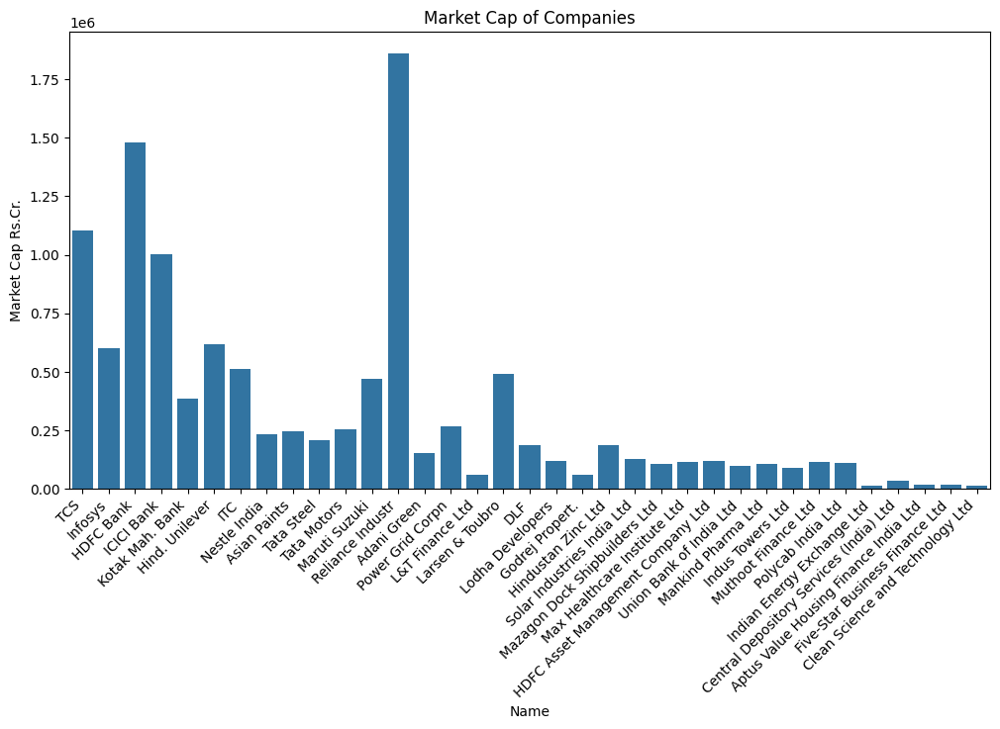

In [ ]:
plt.figure(figsize=(12,6))
sns.barplot(data=df, x="Name", y="Market Cap Rs.Cr.")
plt.xticks(rotation=45, ha='right')
plt.title("Market Cap of Companies")
plt.show()


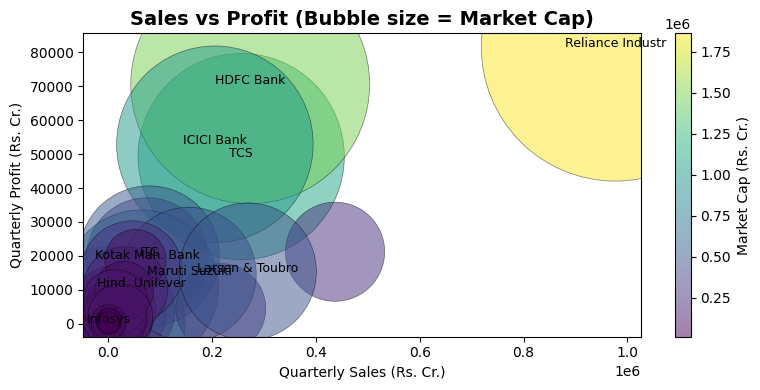

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
scatter = plt.scatter(
    df["Sales Qtr Rs.Cr."],
    df["NP Qtr Rs.Cr."],
    s=df["Market Cap Rs.Cr."]/50,   # adjust divisor for bubble scaling
    alpha=0.5,                      # transparency
    edgecolors="k",                 # black border for clarity
    linewidth=0.5,
    c=df["Market Cap Rs.Cr."],      # color by market cap
    cmap="viridis"                  # nice color map
)

# Only annotate top companies (e.g., top 10 by Market Cap)
top_companies = df.nlargest(10, "Market Cap Rs.Cr.")
for i, row in top_companies.iterrows():
    plt.annotate(
        row["Name"],
        (row["Sales Qtr Rs.Cr."], row["NP Qtr Rs.Cr."]),
        fontsize=9,
        ha="center"
    )

plt.xlabel("Quarterly Sales (Rs. Cr.)")
plt.ylabel("Quarterly Profit (Rs. Cr.)")
plt.title("Sales vs Profit (Bubble size = Market Cap)", fontsize=14, weight="bold")
plt.colorbar(scatter, label="Market Cap (Rs. Cr.)")  # color legend
plt.tight_layout()
plt.show()


## What is a correlation matrix?

A correlation matrix shows how strongly two variables move together.

Correlation values range between:

+1 → Perfect positive correlation (they move together).

-1 → Perfect negative correlation (they move in opposite directions).

0 → No linear relationship.

In this chart:

Redder areas (close to +1) → strong positive relationship.

Bluer areas (close to -1) → strong negative relationship.

Lighter areas (close to 0) → weak or no relationship.

🔹 Interpretation of Your Chart

Market Cap vs NP (Net Profit) Qtr (0.94)

Very high positive correlation.

Larger companies (higher market cap) tend to report higher quarterly profits.

Market Cap vs Sales Qtr (0.78)

Strong positive correlation.

Bigger firms generally have higher quarterly sales.

NP Qtr vs Sales Qtr (0.80)

Strong positive correlation.

Companies with higher sales also show higher net profits (makes sense operationally).

P/E vs Div Yld (-0.39)

Moderate negative correlation.

Higher P/E ratio companies (growth stocks) usually pay lower dividends, while lower P/E (value stocks) often pay higher dividends.

Market Cap vs P/E (-0.24)

Slight negative correlation.

Larger companies might not always have high growth expectations (hence lower P/E).

S.No. (serial number column)

Not meaningful — it’s just an index number from your dataset, so correlations with it don’t carry business meaning.

ESG Score

Appears blank (no data in your dataset), so it wasn’t included in correlation calculations.

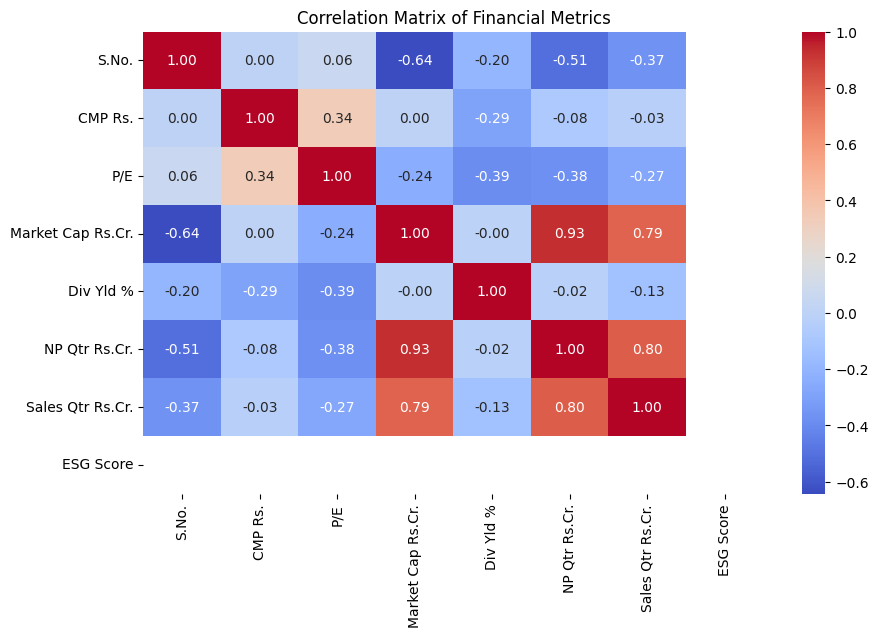

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Financial Metrics")
plt.show()


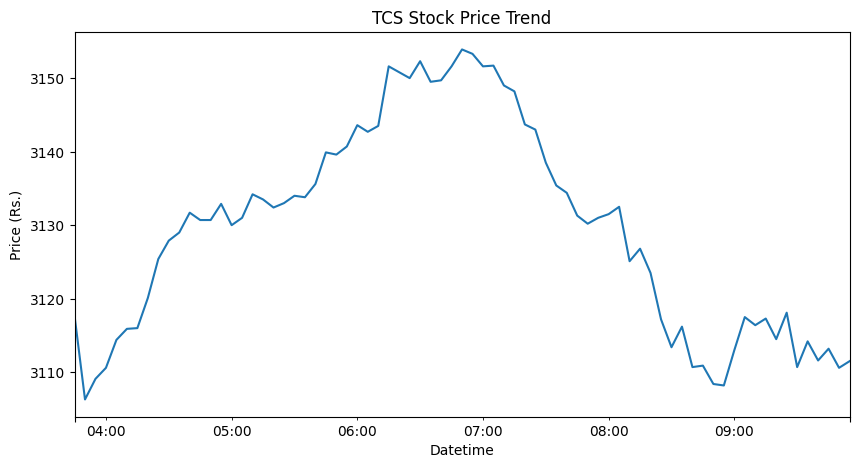

In [ ]:
price_data['TCS.NS']['Close'].plot(figsize=(10,5), title="TCS Stock Price Trend")
plt.ylabel("Price (Rs.)")
plt.show()


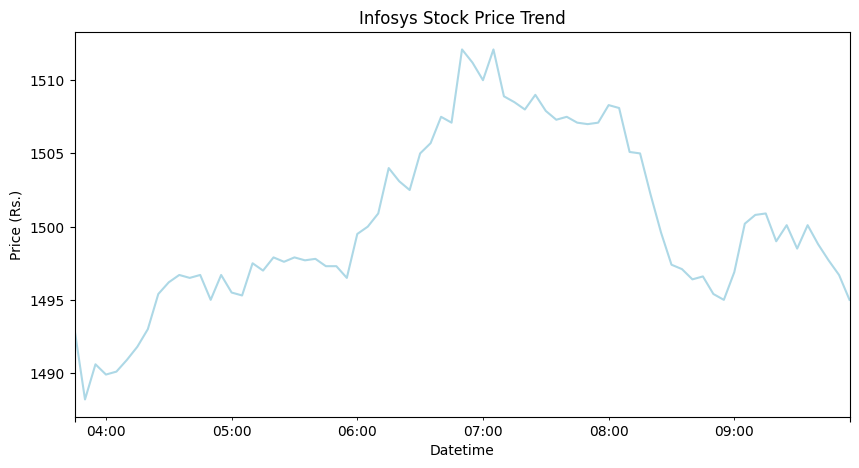

In [ ]:
import matplotlib.pyplot as plt

price_data['INFY.NS']['Close'].plot(
    figsize=(10, 5),
    title="Infosys Stock Price Trend",
    color='lightblue'   # try 'red', 'green', 'orange', etc.
)
plt.ylabel("Price (Rs.)")
plt.show()


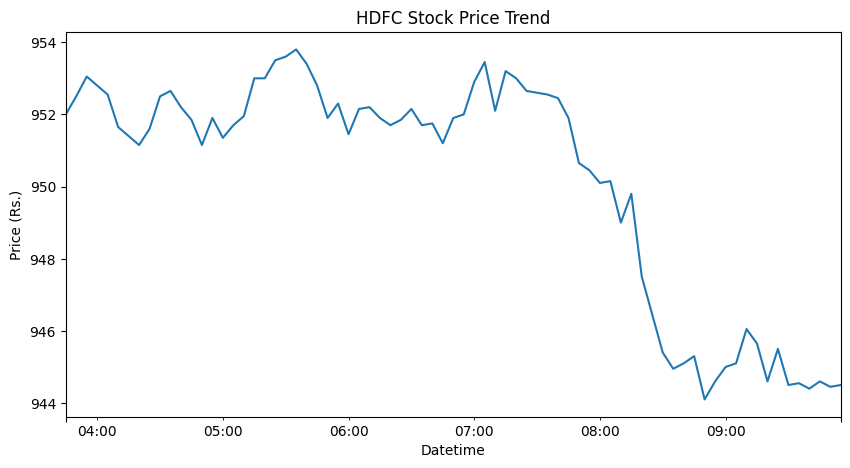

In [ ]:
price_data['HDFCBANK.NS']['Close'].plot(figsize=(10,5), title="HDFC Stock Price Trend")
plt.ylabel("Price (Rs.)")
plt.show()


/tmp/ipython-input-2283991530.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, y="Name", x="Div Yld %", palette="viridis")


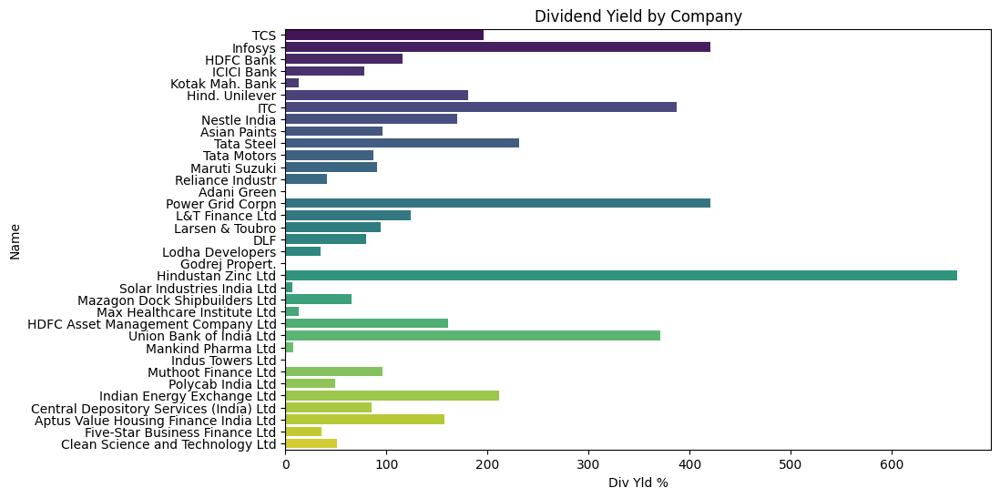

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(data=df, y="Name", x="Div Yld %", palette="viridis")
plt.title("Dividend Yield by Company")
plt.show()


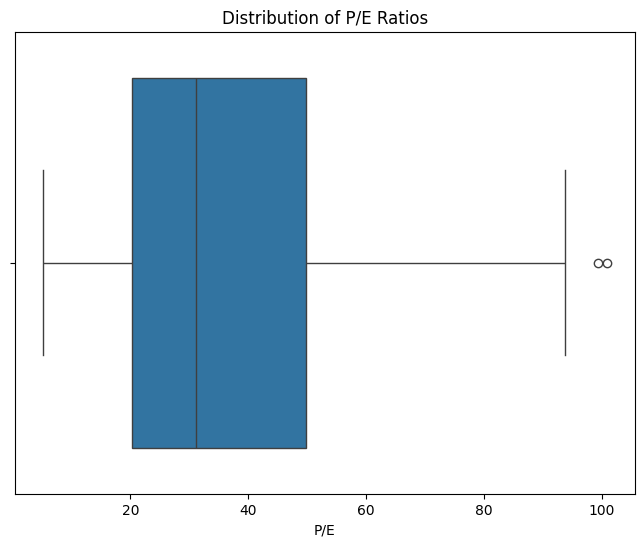

In [ ]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df, x="P/E")
plt.title("Distribution of P/E Ratios")
plt.show()


/tmp/ipython-input-3853029928.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="Name", y="Sales Qtr Rs.Cr.", palette="Set2")


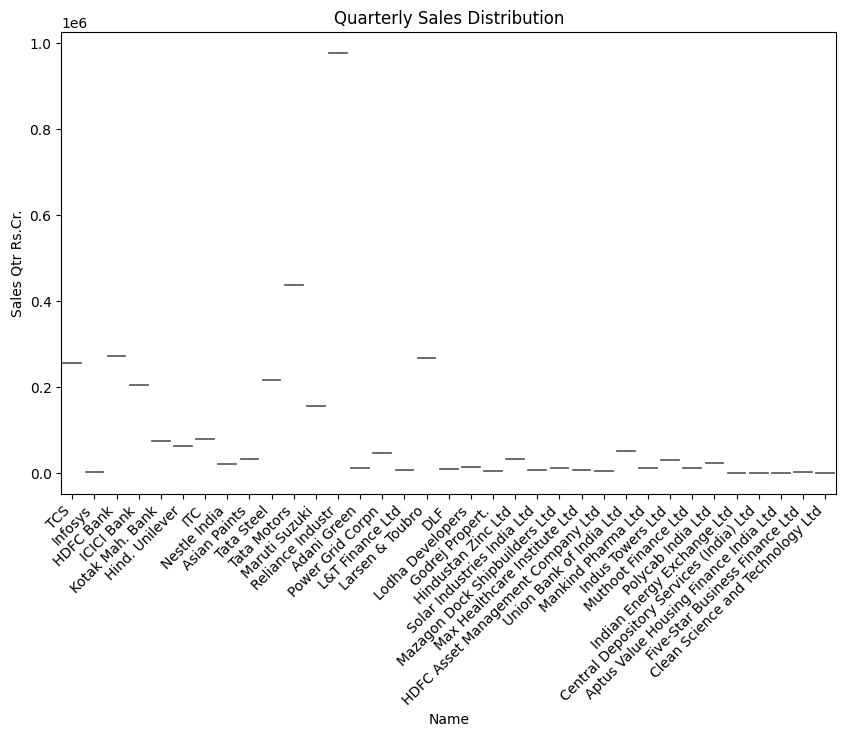

In [ ]:
plt.figure(figsize=(10,6))
sns.violinplot(data=df, x="Name", y="Sales Qtr Rs.Cr.", palette="Set2")
plt.xticks(rotation=45, ha="right")
plt.title("Quarterly Sales Distribution")
plt.show()


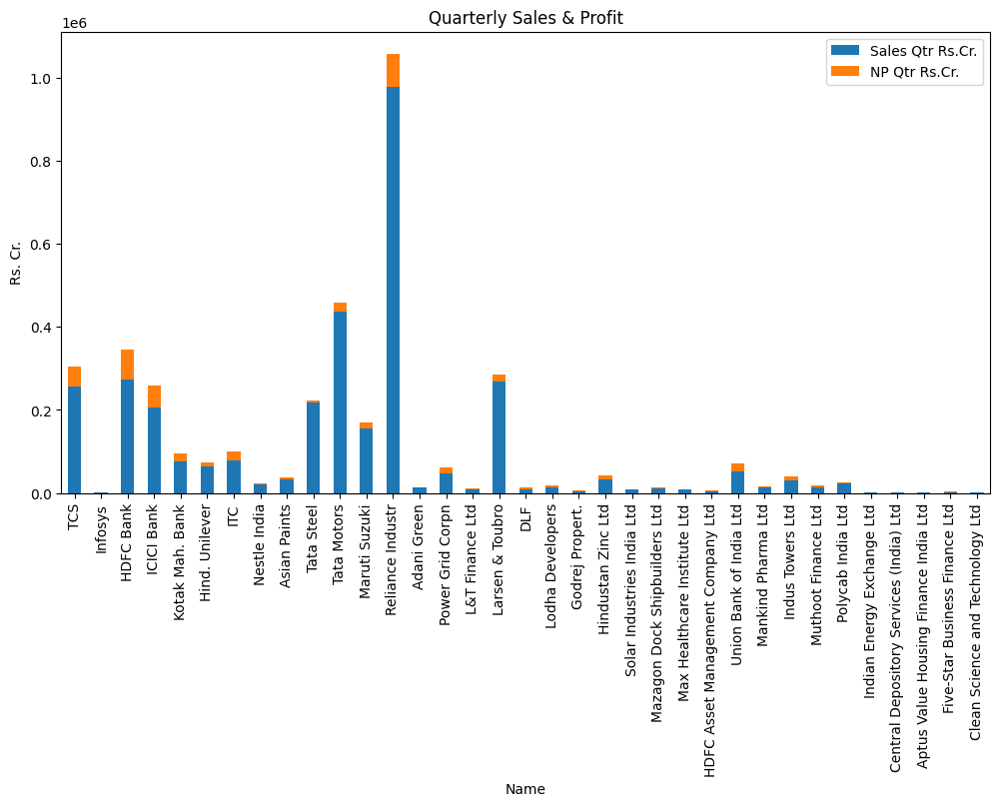

In [ ]:
df_plot = df[["Name", "Sales Qtr Rs.Cr.", "NP Qtr Rs.Cr."]].set_index("Name")
df_plot.plot(kind="bar", stacked=True, figsize=(12,6))
plt.title("Quarterly Sales & Profit")
plt.ylabel("Rs. Cr.")
plt.show()


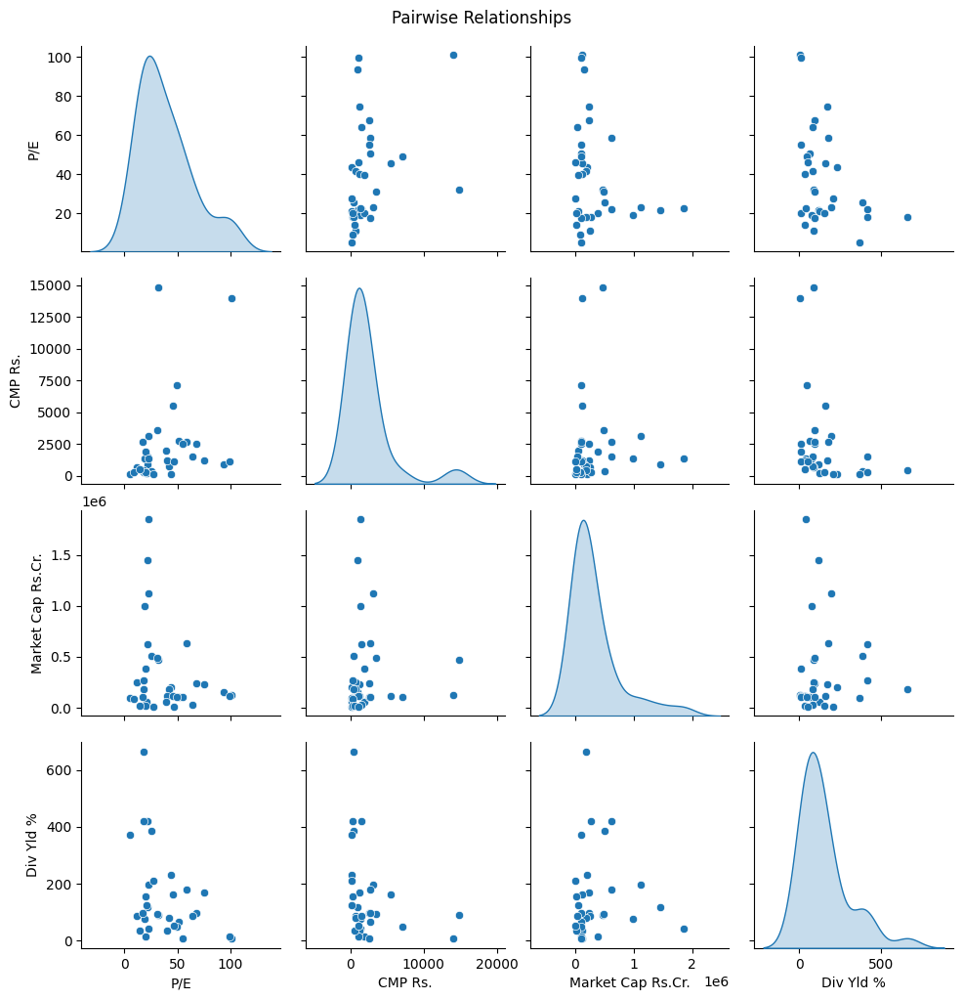

In [ ]:
sns.pairplot(df[["P/E", "CMP Rs.", "Market Cap Rs.Cr.", "Div Yld %"]], diag_kind="kde")
plt.suptitle("Pairwise Relationships", y=1.02)
plt.show()


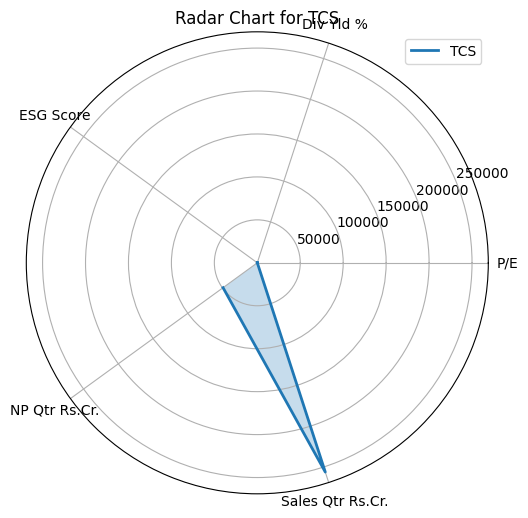

In [ ]:
from math import pi

categories = ["P/E", "Div Yld %", "ESG Score", "NP Qtr Rs.Cr.", "Sales Qtr Rs.Cr."]
N = len(categories)

values = df.iloc[0][categories].values.flatten().tolist()
values += values[:1]  # repeat first value

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(6,6))
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories)

ax.plot(angles, values, linewidth=2, linestyle="solid", label=df.iloc[0]["Name"])
ax.fill(angles, values, alpha=0.25)
plt.title(f"Radar Chart for {df.iloc[0]['Name']}")
plt.legend()
plt.show()


In [ ]:
%pip install squarify

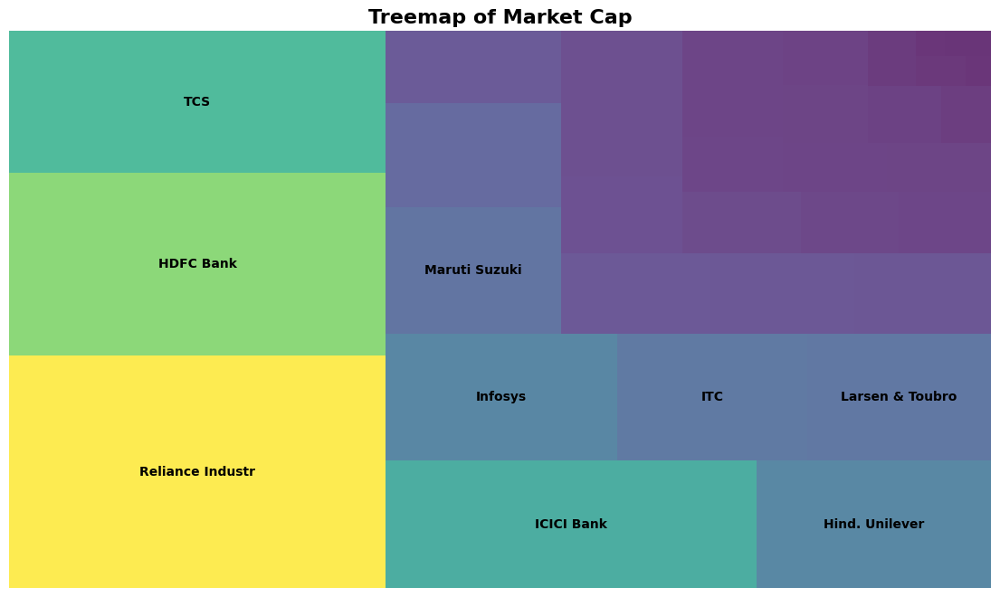

In [ ]:
import matplotlib.pyplot as plt
import squarify  # pip install squarify

# Sort companies by market cap (biggest first)
df_sorted = df.sort_values("Market Cap Rs.Cr.", ascending=False)

# Plot treemap
plt.figure(figsize=(14,8))
squarify.plot(
    sizes=df_sorted["Market Cap Rs.Cr."],
    label=[name if cap > df_sorted["Market Cap Rs.Cr."].quantile(0.75) else ""
           for name, cap in zip(df_sorted["Name"], df_sorted["Market Cap Rs.Cr."])],  # only top labels
    alpha=0.8,
    color=plt.cm.viridis(df_sorted["Market Cap Rs.Cr."] / df_sorted["Market Cap Rs.Cr."].max()),
    text_kwargs={'fontsize':10, 'weight':'bold'}
)

plt.title("Treemap of Market Cap", fontsize=16, weight="bold")
plt.axis("off")
plt.show()


In [ ]:

sectors = {}
for symbol in tickers.values():
    info = yf.Ticker(symbol).info
    sectors[symbol] = info.get("sector", "Unknown")


df["Sector"] = df["Symbol"].map(sectors)


In [ ]:
sectors

{'TCS.NS': 'Technology',
 'INFY.NS': 'Technology',
 'HDFCBANK.NS': 'Financial Services',
 'ICICIBANK.NS': 'Financial Services',
 'KOTAKBANK.NS': 'Financial Services',
 'HINDUNILVR.NS': 'Consumer Defensive',
 'ITC.NS': 'Consumer Defensive',
 'NESTLEIND.NS': 'Consumer Defensive',
 'ASIANPAINT.NS': 'Basic Materials',
 'TATASTEEL.NS': 'Basic Materials',
 'TATAMOTORS.NS': 'Consumer Cyclical',
 'MARUTI.NS': 'Consumer Cyclical',
 'RELIANCE.NS': 'Energy',
 'ADANIGREEN.NS': 'Utilities',
 'POWERGRID.NS': 'Utilities',
 'LTF.NS': 'Financial Services',
 'LT.NS': 'Industrials',
 'DLF.NS': 'Real Estate',
 'LODHA.NS': 'Real Estate',
 'GODREJPROP.NS': 'Real Estate',
 'HINDZINC.NS': 'Basic Materials',
 'SOLARINDS.NS': 'Basic Materials',
 'MAZDOCK.NS': 'Industrials',
 'MAXHEALTH.NS': 'Healthcare',
 'HDFCAMC.NS': 'Financial Services',
 'UNIONBANK.NS': 'Financial Services',
 'MANKIND.NS': 'Healthcare',
 'INDUSTOWER.NS': 'Communication Services',
 'MUTHOOTFIN.NS': 'Financial Services',
 'POLYCAB.NS': 'Indus

/tmp/ipython-input-507845837.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df, x="Sector", y="P/E", estimator="mean", ci=None, palette="Set2")
/tmp/ipython-input-507845837.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="Sector", y="P/E", estimator="mean", ci=None, palette="Set2")


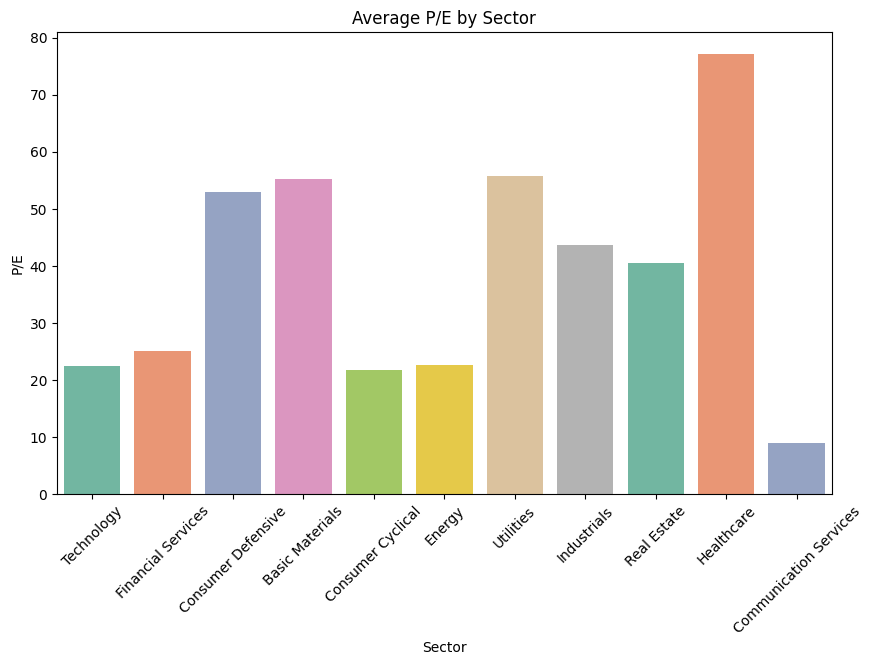

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(data=df, x="Sector", y="P/E", estimator="mean", ci=None, palette="Set2")
plt.title("Average P/E by Sector")
plt.xticks(rotation=45)
plt.show()


/tmp/ipython-input-1982873641.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sector_mc, x="Sector", y="Market Cap Rs.Cr.", palette="viridis")


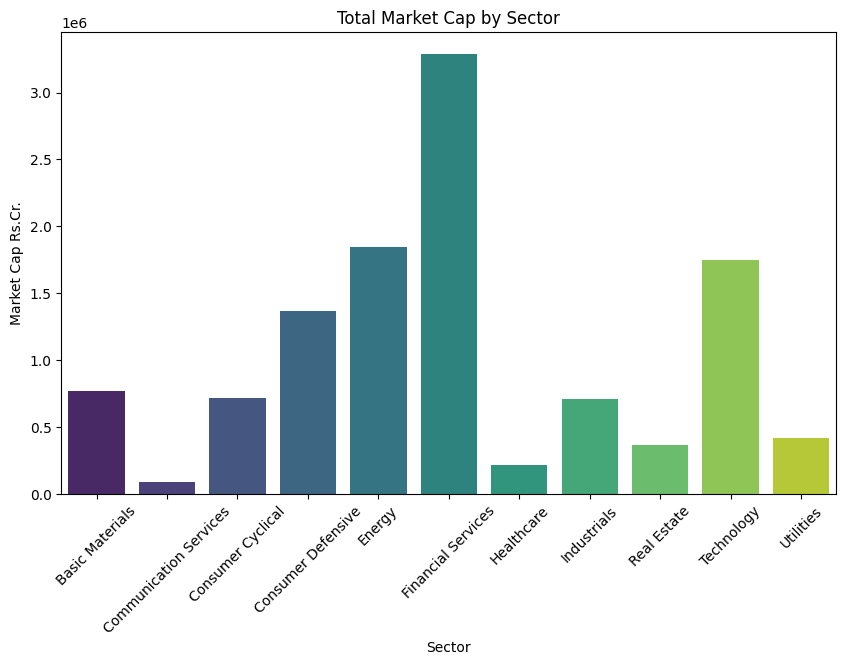

In [ ]:
sector_mc = df.groupby("Sector")["Market Cap Rs.Cr."].sum().reset_index()
plt.figure(figsize=(10,6))
sns.barplot(data=sector_mc, x="Sector", y="Market Cap Rs.Cr.", palette="viridis")
plt.title("Total Market Cap by Sector")
plt.xticks(rotation=45)
plt.show()


This is a **bar chart** depicting the **total market capitalization by sector** in crores of rupees (Rs. Cr.).

## Chart Overview
- The x-axis lists different **market sectors**: Basic Materials, Communication Services, Consumer Cyclical, Consumer Defensive, Energy, Financial Services, Healthcare, Industrials, Real Estate, Technology, and Utilities.
- The y-axis represents **market cap** in crores of rupees, with a scale up to about 3.3 million Rs. Cr.
- Each vertical bar's height indicates the total market cap of that sector.

## Key Insights
- **Financial Services** dominates with the highest total market cap, well above 3 million Rs. Cr., reflecting its massive scale in the Indian market.
- **Technology** and **Energy** sectors also have substantial market caps, each exceeding 1.5 million Rs. Cr.
- **Consumer Defensive** and **Industrials** are mid-range, while **Communication Services** has the lowest total market cap among the sectors displayed.
- **Healthcare** and **Real Estate** exhibit relatively modest market caps.

## Interpretation Tips
- This visualization highlights the **relative size and importance of sectors** within the stock market, underscoring the dominance of the financial and technology sectors in India.
- Sectors with larger bars attract more investor capital and can have greater influence on overall market performance.


/tmp/ipython-input-1984589956.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Sector", y="Div Yld %", palette="coolwarm")


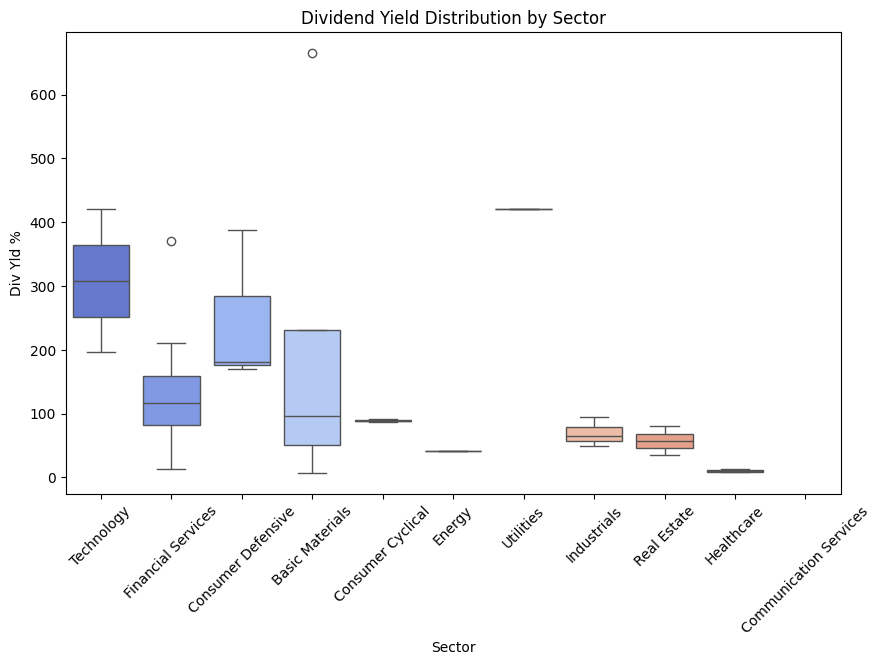

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x="Sector", y="Div Yld %", palette="coolwarm")
plt.title("Dividend Yield Distribution by Sector")
plt.xticks(rotation=45)
plt.show()


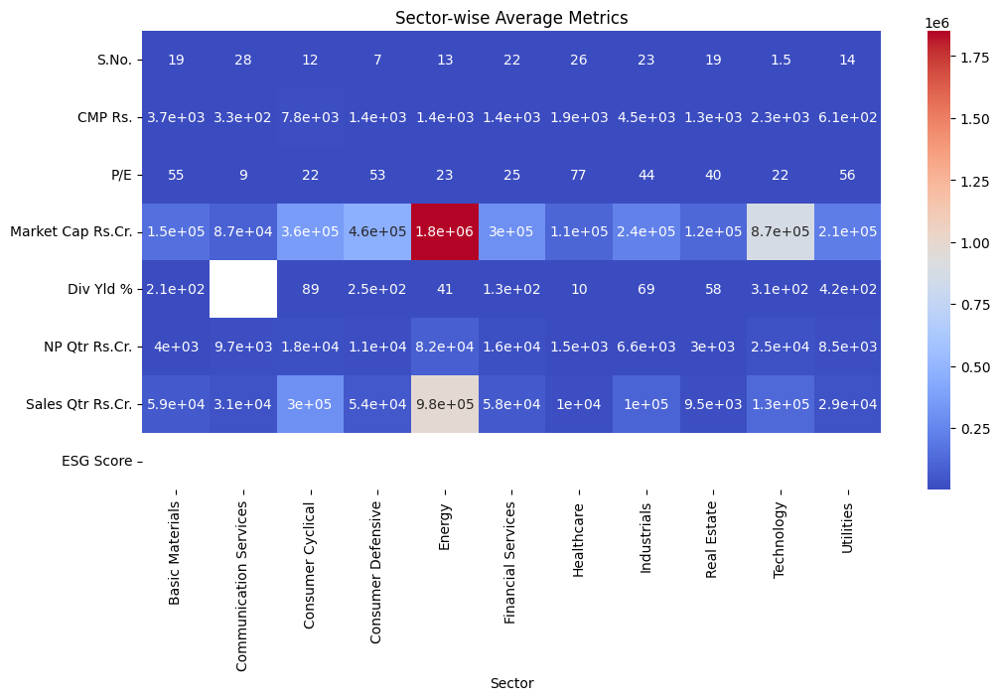

In [ ]:
plt.figure(figsize=(12,6))
sns.heatmap(df.groupby("Sector").mean(numeric_only=True).T, annot=True, cmap="coolwarm")
plt.title("Sector-wise Average Metrics")
plt.show()


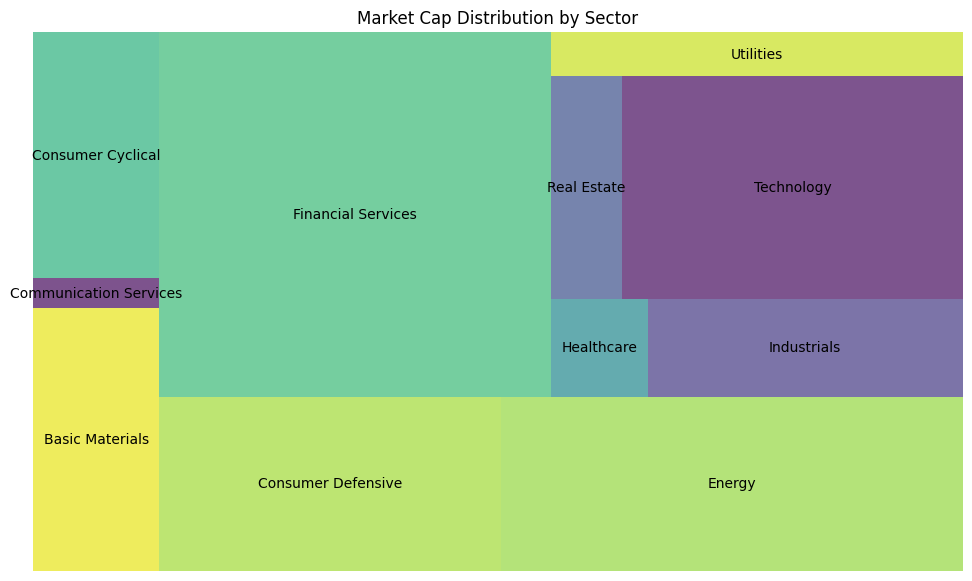

In [ ]:
import squarify
sector_mc = df.groupby("Sector")["Market Cap Rs.Cr."].sum()

plt.figure(figsize=(12,7))
squarify.plot(sizes=sector_mc.values, label=sector_mc.index, alpha=0.7)
plt.title("Market Cap Distribution by Sector")
plt.axis("off")
plt.show()


/tmp/ipython-input-819846784.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(data=df, x="Sector", y="P/E", size=8, palette="husl")


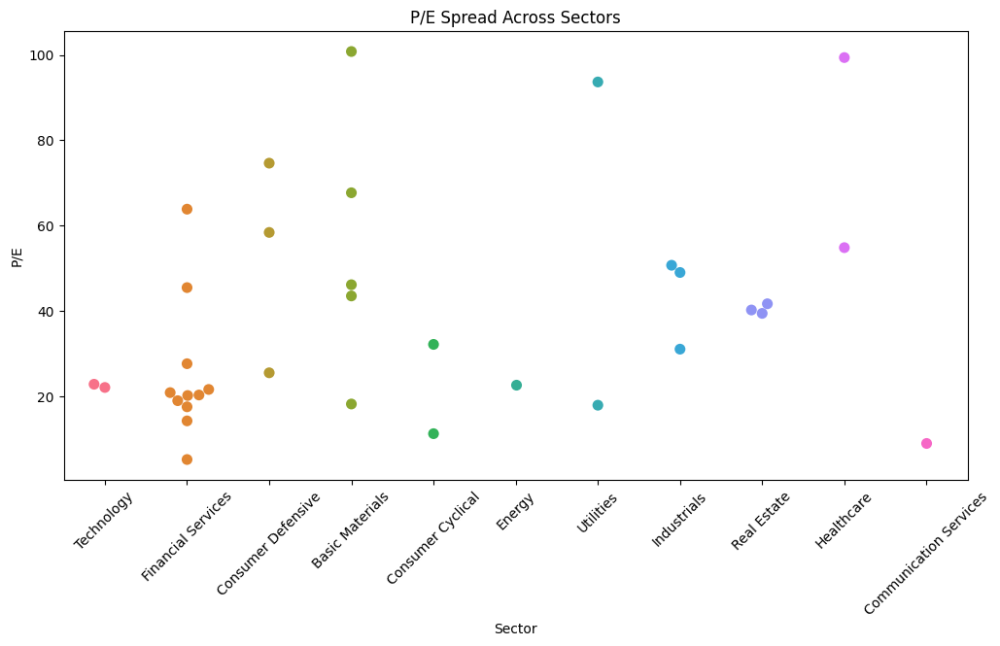

In [ ]:
plt.figure(figsize=(12,6))
sns.swarmplot(data=df, x="Sector", y="P/E", size=8, palette="husl")
plt.title("P/E Spread Across Sectors")
plt.xticks(rotation=45)
plt.show()


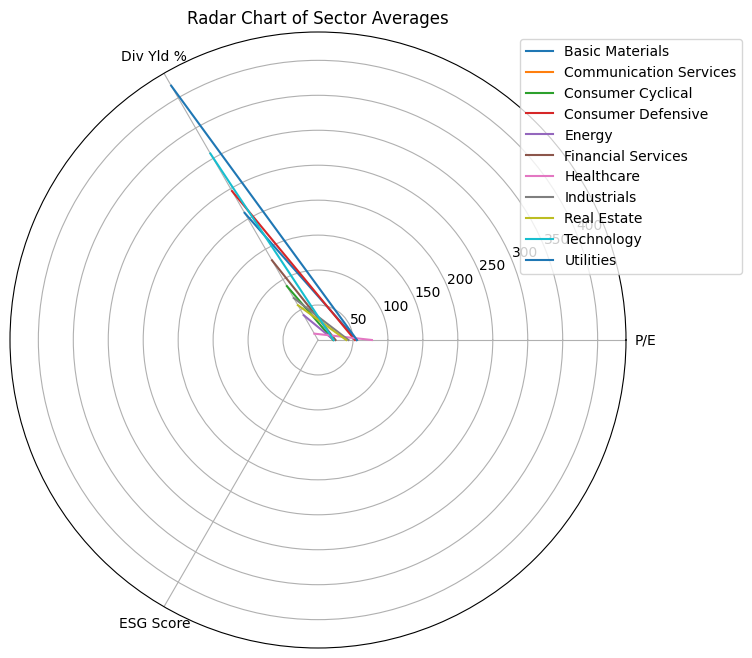

In [ ]:
from math import pi

metrics = ["P/E", "Div Yld %", "ESG Score"]
sector_avg = df.groupby("Sector")[metrics].mean()

N = len(metrics)
angles = [n / float(N) * 2 * pi for n in range(N)] + [0]

plt.figure(figsize=(8,8))
for sector in sector_avg.index:
    values = sector_avg.loc[sector].tolist()
    values += values[:1]
    plt.polar(angles, values, label=sector)
plt.xticks(angles[:-1], metrics)
plt.title("Radar Chart of Sector Averages")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.show()


/tmp/ipython-input-2548982652.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="Sector", y="NP Qtr Rs.Cr.", palette="muted")


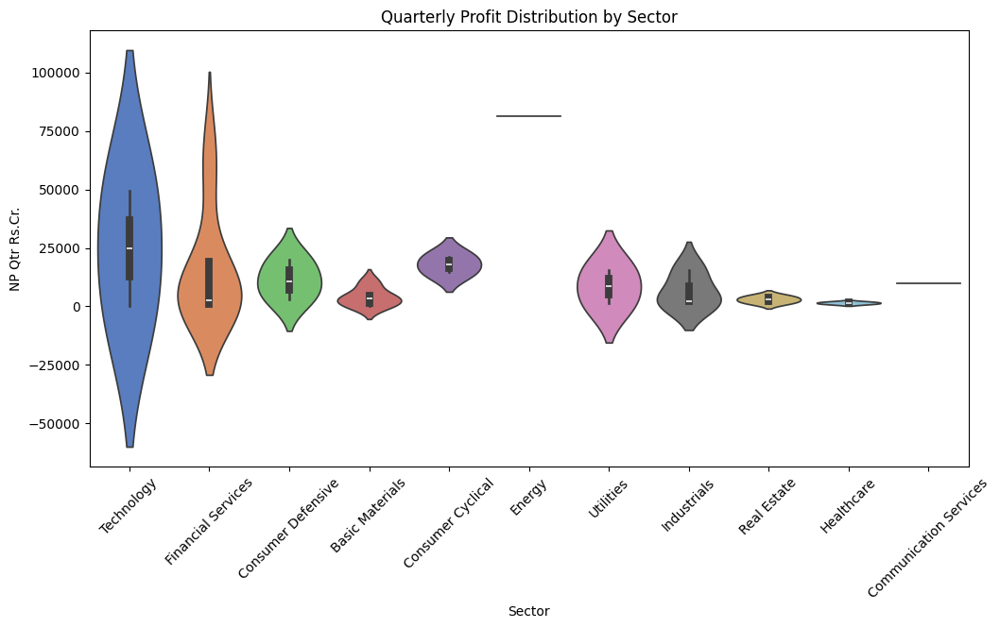

In [ ]:
plt.figure(figsize=(12,6))
sns.violinplot(data=df, x="Sector", y="NP Qtr Rs.Cr.", palette="muted")
plt.title("Quarterly Profit Distribution by Sector")
plt.xticks(rotation=45)
plt.show()


The code shown creates a **facet grid of scatter plots** using Seaborn, displaying the relationship between **quarterly sales** and **quarterly net profit** for each sector, with companies differentiated by color.[1]

## Code Functionality
- **FacetGrid**: Splits the data (`df`) into separate scatter plots ("facets") for each unique value in the `"Sector"` column, laying them out in a grid with 3 columns per row, each facet having a height of 4 inches.
- **Scatter Plot**: For each sector, a scatter plot is drawn with:
  - **x-axis**: `"Sales Qtr Rs.Cr."` (quarterly sales in crores)
  - **y-axis**: `"NP Qtr Rs.Cr."` (quarterly net profit in crores)
  - **hue**: `"Name"` assigns different colors to data points from different companies within the sector.
- **Legend**: `g.add_legend()` adds a legend showing which color represents which company.
- **plt.show()**: Displays the entire grid of plots.

## Expected Output
- The final visualization consists of multiple scatter plots, one for each sector, arranged in a grid.
- In each plot, every dot represents a company’s quarterly sales and profit, colored by company name. This allows segment-wise comparison of sales/profit dynamics and quickly reveals sectors or firms with outlier performance.

## Interpretation Tips
- Use these charts to analyze how **sales and profits relate within and across sectors**.
- Outliers or distinct trends within specific sectors will be easy to spot, and company-level performance variation is visually clear by the color coding.


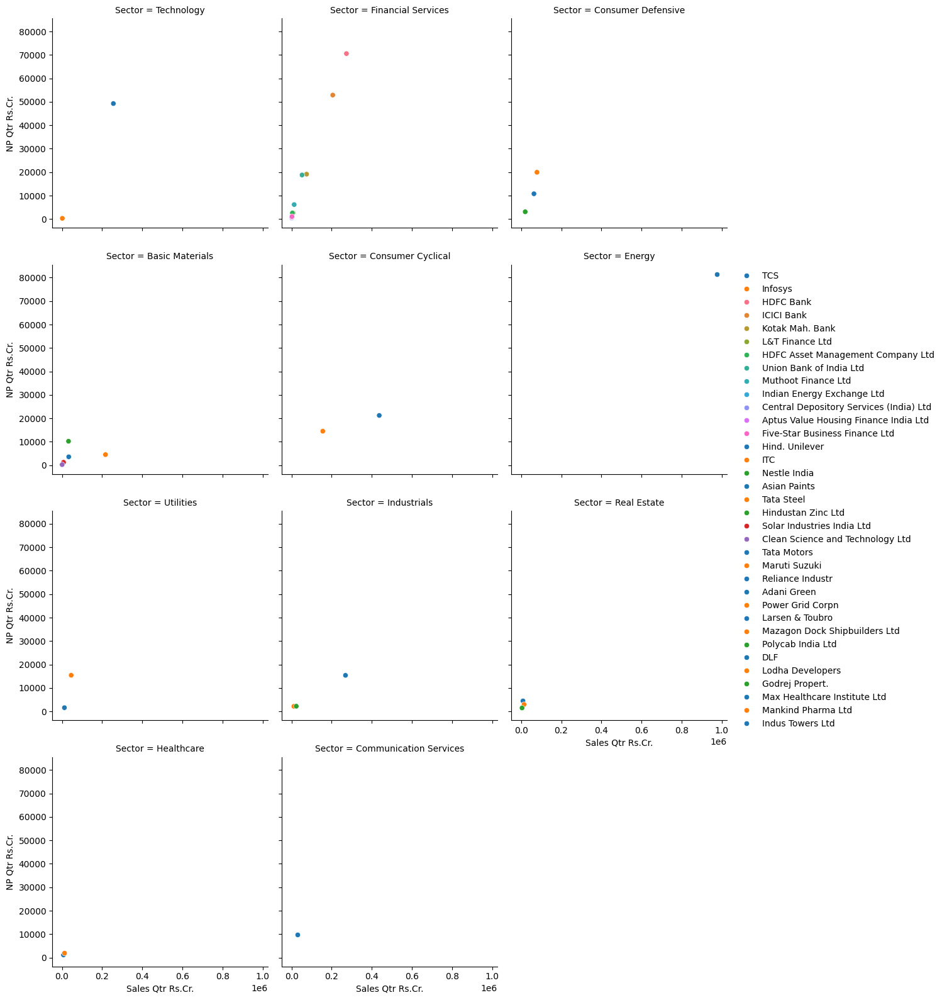

In [ ]:
g = sns.FacetGrid(df, col="Sector", col_wrap=3, height=4)
g.map_dataframe(sns.scatterplot, x="Sales Qtr Rs.Cr.", y="NP Qtr Rs.Cr.", hue="Name")
g.add_legend()
plt.show()


## **ESG score calculation**

In [ ]:
def compute_esg_score(row):
    try:

        e = 1 - (row.get("Debt/Equity", 0) / (row.get("Debt/Equity", 1) + 1))
        s = row.get("Promoter Holding %", 0) / 100
        g = row.get("ROE", 0) / 100
        return round((e + s + g) / 3, 3)
    except:
        return None

data = []
for name, ticker in tickers.items():
    stock = yf.Ticker(ticker)

    try:
        info = stock.info

        market_cap = info.get("marketCap", None)
        roe = info.get("returnOnEquity", 0) * 100 if info.get("returnOnEquity") else 0
        de_ratio = info.get("debtToEquity", 0)
        promoter_holding = info.get("heldPercentInsiders", 0) * 100
        data.append({
            "Stock": name,
            "Market Cap": market_cap,
            "Debt/Equity": de_ratio,
            "Promoter Holding %": promoter_holding,
            "ROE": roe
        })
    except Exception as e:
        print(f"Error fetching {name}: {e}")

df = pd.DataFrame(data)
df["ESG Score"] = df.apply(compute_esg_score, axis=1)
df["Weight"] = df["Market Cap"] / df["Market Cap"].sum()

print(df)


                                      Stock      Market Cap  Debt/Equity  \
0                                       TCS  11257687048192        9.714   
1                                   Infosys   6212545937408        8.894   
2                                 HDFC Bank  14501853265920        0.000   
3                                ICICI Bank   9955870507008        0.000   
4                           Kotak Mah. Bank   3862311469056        0.000   
5                            Hind. Unilever   6289852727296        3.322   
6                                       ITC   5095235256320        0.405   
7                              Nestle India   2315707482112       29.106   
8                              Asian Paints   2435603496960       11.418   
9                                Tata Steel   1975408394240      103.775   
10                              Tata Motors   2519974543360       61.549   
11                            Maruti Suzuki   4666369245184        0.090   
12          

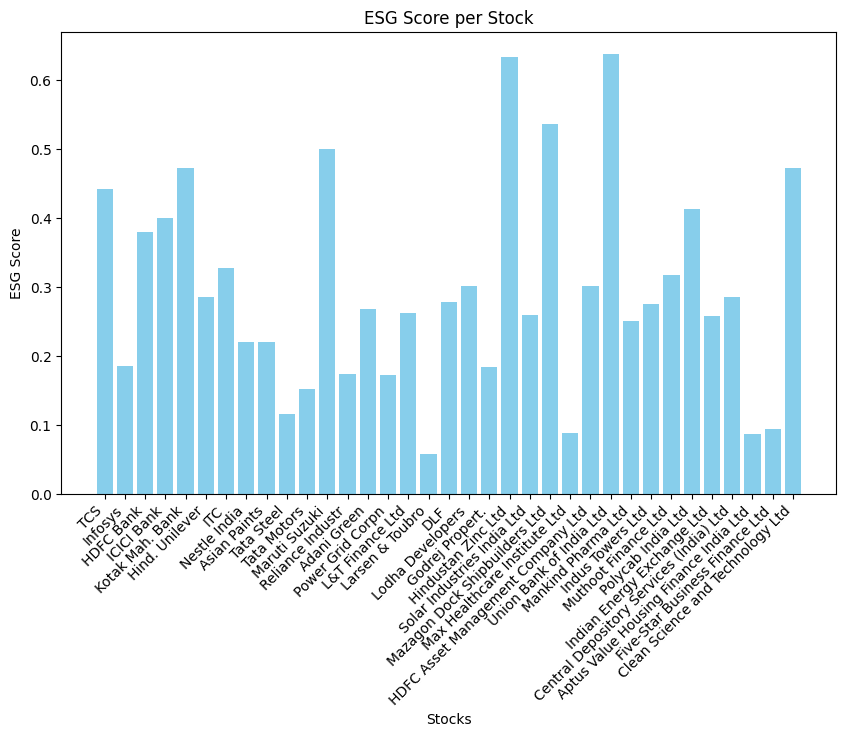

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.bar(df["Stock"], df["ESG Score"], color="skyblue")
plt.xticks(rotation=45, ha="right")
plt.title("ESG Score per Stock")
plt.xlabel("Stocks")
plt.ylabel("ESG Score")
plt.show()


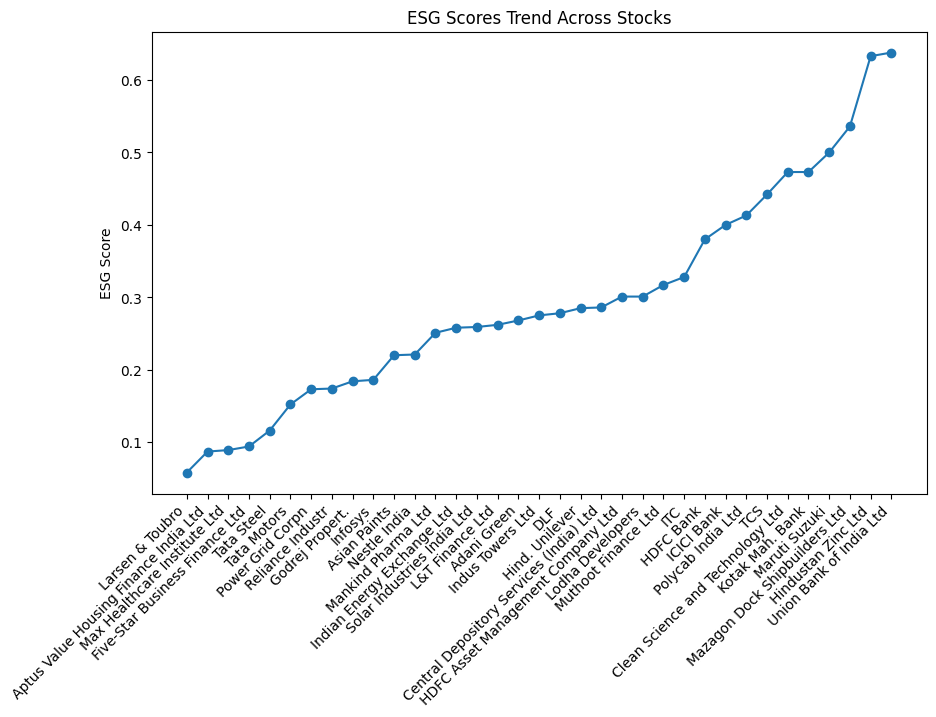

In [ ]:
sorted_df = df.sort_values("ESG Score")

plt.figure(figsize=(10,6))
plt.plot(sorted_df["Stock"], sorted_df["ESG Score"], marker="o", linestyle="-")
plt.xticks(rotation=45, ha="right")
plt.title("ESG Scores Trend Across Stocks")
plt.ylabel("ESG Score")
plt.show()


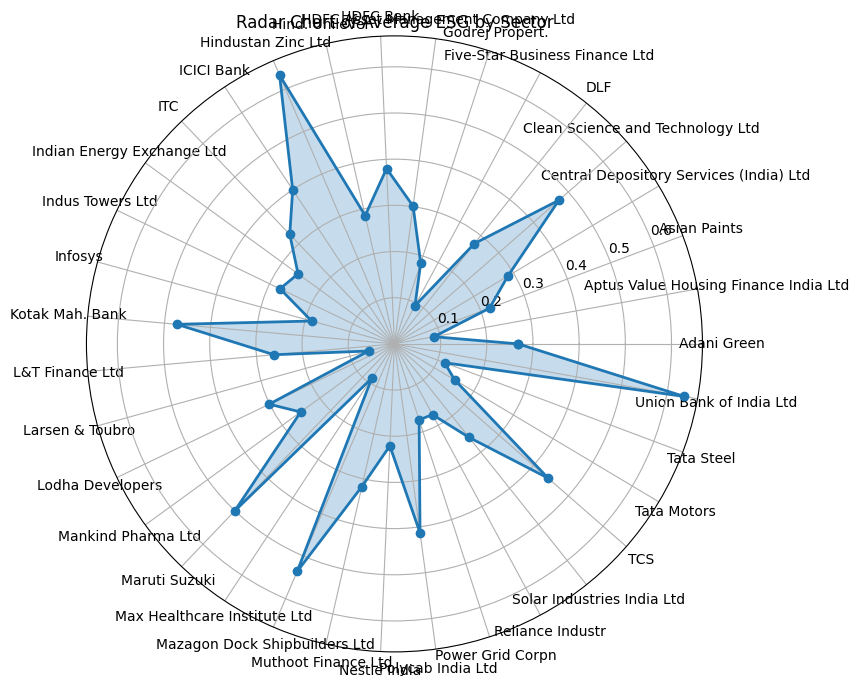

In [ ]:
import numpy as np

sector_scores = df.groupby("Stock")["ESG Score"].mean()
categories = list(sector_scores.index)
values = list(sector_scores.values)

N = len(categories)
angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
values += values[:1]
angles += angles[:1]

plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)
ax.plot(angles, values, "o-", linewidth=2)
ax.fill(angles, values, alpha=0.25)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title("Radar Chart of Average ESG by Sector")
plt.show()


In [ ]:
import numpy as np
import pandas as pd

CFG = {
    "columns": {
        "name": "Name",
        "symbol": "Symbol",
        "sector": "Sector",
        "esg": "ESG Score",
        "pe": "P/E",
        "roce": "ROCE %",
        "de": "Debt/Equity",
        "divy": "Div Yld %",
        "mc": "Market Cap Rs.Cr.",
        "prom": "Promoter Holding %",
        "qtr_profit_var": "Qtr Profit Var %"
    },
    "filters": {
        "max_de": 1.5,
        "min_roce": 12.0,
        "min_prom": 40.0,
        "pe_min": 5.0,
        "pe_max": 80.0
    },
    "weights": {
        "esg_pctile": 0.60,
        "quality": 0.40
    },
    "rules": {
        "buy_esg_pctile": 0.70,
        "buy_composite": 0.65,
        "watch_esg_pctile": 0.45,
        "watch_composite": 0.50
    },
    "topn": 15
}

def _col(df, key):
    return CFG["columns"][key]

def prepare(df):
    needed = [_col(df, k) for k in ["name","symbol","sector","esg","pe","roce","de","divy","mc"]]
    optional = []
    for k in ["prom","qtr_profit_var"]:
        if CFG["columns"][k] in df.columns:
            optional.append(CFG["columns"][k])
    use_cols = [c for c in needed + optional if c in df.columns]
    out = df[use_cols].copy()
    num_cols = [c for c in use_cols if c not in [_col(df,"name"), _col(df,"symbol"), _col(df,"sector")]]
    for c in num_cols:
        out[c] = pd.to_numeric(out[c], errors="coerce")
    out = out.dropna(subset=[_col(df,"esg")]).reset_index(drop=True)
    return out

def add_sector_esg_percentile(d):
    esg_col = _col(d,"esg")
    sector_col = _col(d,"sector")
    d["ESG_pctile_sector"] = d.groupby(sector_col)[esg_col].rank(pct=True)
    return d

def minmax_ser(s):
    s = s.astype(float)
    if s.max() == s.min():
        return pd.Series(0.5, index=s.index)
    return (s - s.min()) / (s.max() - s.min())

def add_quality_pillar(d):
    roce = minmax_ser(d[_col(d,"roce")].fillna(d[_col(d,"roce")].median()))
    de = d[_col(d,"de")].replace([np.inf, -np.inf], np.nan)
    de = minmax_ser(1 / (1 + de.fillna(de.median())))
    parts = [roce, de]
    if _col(d,"qtr_profit_var") in d.columns:
        growth = minmax_ser(d[_col(d,"qtr_profit_var")].fillna(d[_col(d,"qtr_profit_var")].median()))
        parts.append(growth)
    d["Quality_pillar"] = pd.concat(parts, axis=1).mean(axis=1)
    return d

def add_filters(d):
    f = CFG["filters"]
    d["PASS_DE"]   = d[_col(d,"de")]   <= f["max_de"]
    d["PASS_ROCE"] = d[_col(d,"roce")] >= f["min_roce"]
    d["PASS_PE"]   = (d[_col(d,"pe")] >= f["pe_min"]) & (d[_col(d,"pe")] <= f["pe_max"])
    if _col(d,"prom") in d.columns:
        d["PASS_PROM"] = d[_col(d,"prom")] >= f["min_prom"]
    else:
        d["PASS_PROM"] = True
    d["PASS_ALL"] = d[["PASS_DE","PASS_ROCE","PASS_PE","PASS_PROM"]].all(axis=1)
    return d

def add_composite_and_decision(d):
    w = CFG["weights"]
    r = CFG["rules"]
    d["Composite"] = (w["esg_pctile"] * d["ESG_pctile_sector"] +
                      w["quality"]    * d["Quality_pillar"])
    conditions = [
        (d["PASS_ALL"] & (d["ESG_pctile_sector"] >= r["buy_esg_pctile"]) & (d["Composite"] >= r["buy_composite"])),
        (d["PASS_ALL"] & (d["ESG_pctile_sector"] >= r["watch_esg_pctile"]) & (d["Composite"] >= r["watch_composite"]))
    ]
    choices = ["BUY", "WATCH"]
    d["Decision"] = np.select(conditions, choices, default="AVOID")
    return d

def add_reasons(d):
    def fmt(x, nd=2):
        try:
            return f"{float(x):,.{nd}f}"
        except:
            return "-"
    cols = CFG["columns"]
    rows = []
    for _, row in d.iterrows():
        reason = []
        reason.append(f"ESG_pctile(sector)={fmt(row['ESG_pctile_sector'],2)}")
        reason.append(f"Composite={fmt(row['Composite'],2)}")
        reason.append(f"ROCE%={fmt(row[cols['roce']],1)}")
        reason.append(f"D/E={fmt(row[cols['de']],2)}")
        reason.append(f"P/E={fmt(row[cols['pe']],1)}")
        if cols["prom"] in d.columns:
            reason.append(f"Prom%={fmt(row[cols['prom']],1)}")
        if cols["qtr_profit_var"] in d.columns:
            reason.append(f"QtrProfitVar%={fmt(row[cols['qtr_profit_var']],1)}")
        rows.append(" | ".join(reason))
    d["Reasons"] = rows
    return d

def make_esg_recommendations(df_live):
    d = prepare(df_live)
    d = add_sector_esg_percentile(d)
    d = add_quality_pillar(d)
    d = add_filters(d)
    d = add_composite_and_decision(d)
    d = add_reasons(d)
    dec_rank = {"BUY": 0, "WATCH": 1, "AVOID": 2}
    d["__rank__"] = d["Decision"].map(dec_rank)
    d_sorted = d.sort_values(["__rank__", "Composite"], ascending=[True, False]).drop(columns="__rank__")
    view_cols = [
        _col(d,"name"), _col(d,"symbol"), _col(d,"sector"),
        _col(d,"esg"), "ESG_pctile_sector", "Quality_pillar", "Composite", "Decision",
        _col(d,"roce"), _col(d,"de"), _col(d,"pe"), _col(d,"divy"), _col(d,"mc")
    ]
    view_cols = [c for c in view_cols if c in d_sorted.columns]
    topn = CFG["topn"]
    return d_sorted, d_sorted[view_cols].head(topn)


In [ ]:
import pandas as pd
top5_esg = df.sort_values(by="ESG Score", ascending=False).head(5)

print("Top 5 Stocks Based on ESG Score:")
print(top5_esg[["Stock", "ESG Score"]])


Top 5 Stocks Based on ESG Score:
                               Stock  ESG Score
25           Union Bank of India Ltd      0.638
20                Hindustan Zinc Ltd      0.633
22     Mazagon Dock Shipbuilders Ltd      0.536
11                     Maruti Suzuki      0.500
34  Clean Science and Technology Ltd      0.473


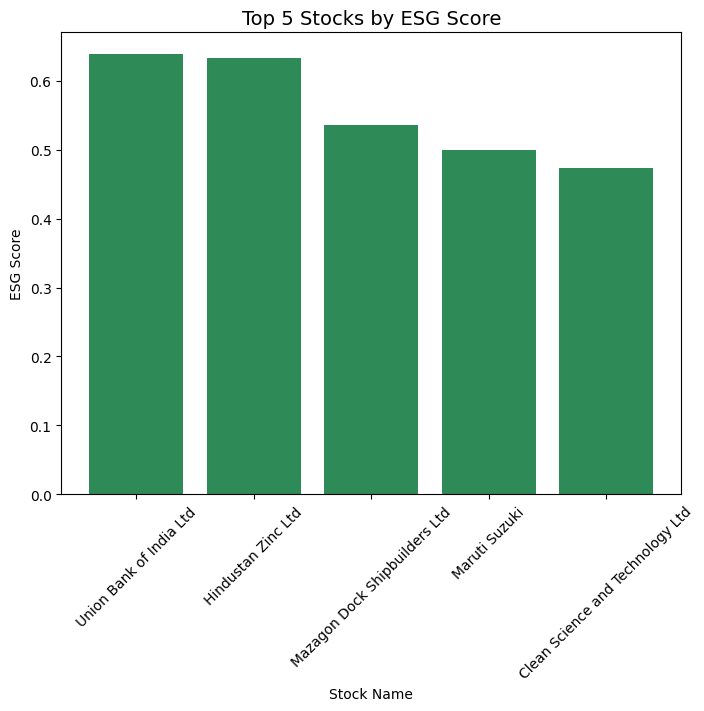

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.bar(top5_esg["Stock"], top5_esg["ESG Score"], color="seagreen")
plt.title("Top 5 Stocks by ESG Score", fontsize=14)
plt.xlabel("Stock Name")
plt.ylabel("ESG Score")
plt.xticks(rotation=45)
plt.show()


In [ ]:
import pandas as pd

def decision_model(score):
    """
    Simple ESG-based decision rule:
    - BUY  if ESG Score >= 0.70
    - HOLD if 0.50 <= ESG Score < 0.70
    - SELL if ESG Score < 0.50
    """
    if score >= 0.70:
        return "BUY"
    elif score >= 0.50:
        return "HOLD"
    else:
        return "SELL"

# Apply decision model to df
df["Decision"] = df["ESG Score"].apply(decision_model)

# Show results sorted by ESG Score
result = df.sort_values(by="ESG Score", ascending=False)[["Stock", "ESG Score", "Decision"]]
print(result.head(15))


In [ ]:
sg_decision(score):
    if score >= 0.7:
        return "BUY"
    elif score >= 0.4:
        return "HOLD"
    else:
        return "SELL"


while True:
    results = []

    for stock_name, symbol in tickers.items():
        try:
            data = yf.Ticker(symbol)
            hist = data.history(period="1d")

            if hist.empty:
                continue

            price = hist["Close"].iloc[-1]


            import random
            esg_score = round(random.uniform(0, 1), 2)

            decision = esg_decision(esg_score)

            results.append({
                "Stock": stock_name,
                "Symbol": symbol,
                "Price": price,
                "ESG Score": esg_score,
                "Decision": decision
            })

        except Exception as e:
            print(f"Error fetching {stock_name}: {e}")


    df = pd.DataFrame(results)
    print("\n=== Live ESG Analysis ===")
    print(df.sort_values(by="ESG Score", ascending=False).head(35))


    time.sleep(60)



=== Live ESG Analysis ===
               Stock         Symbol         Price  ESG Score Decision
9         Tata Steel   TATASTEEL.NS    158.389999       0.92      BUY
18  Lodha Developers       LODHA.NS   1194.599976       0.88      BUY
4    Kotak Mah. Bank   KOTAKBANK.NS   1942.500000       0.86      BUY
15   L&T Finance Ltd         LTF.NS    221.929993       0.76      BUY
1            Infosys        INFY.NS   1498.699951       0.73      BUY
16   Larsen & Toubro          LT.NS   3574.899902       0.71      BUY
19   Godrej Propert.  GODREJPROP.NS   1978.199951       0.46     HOLD
10       Tata Motors  TATAMOTORS.NS    684.400024       0.37     SELL
8       Asian Paints  ASIANPAINT.NS   2540.000000       0.36     SELL
5     Hind. Unilever  HINDUNILVR.NS   2677.000000       0.34     SELL
17               DLF         DLF.NS    754.799988       0.29     SELL
3         ICICI Bank   ICICIBANK.NS   1394.199951       0.23     SELL
6                ITC         ITC.NS    406.750000       0.23   

KeyboardInterrupt: 

In [ ]:
# ESG Decision Model thresholds
def decision_model(esg_score):
    if esg_score >= 0.7:
        return "BUY"
    elif 0.4 <= esg_score < 0.7:
        return "HOLD"
    else:
        return "SELL"

# Run infinite loop for live updates
while True:
    stock_data = []

    for stock, ticker in tickers.items():
        try:
            data = yf.Ticker(ticker)
            live_price = data.history(period="1d")["Close"].iloc[-1]

            # For demo, simulate ESG Score randomly (replace with actual ESG data source)
            import random
            esg_score = round(random.uniform(0.2, 0.9), 2)

            stock_data.append({
                "Stock": stock,
                "Ticker": ticker,
                "Live Price": round(live_price, 2),
                "ESG Score": esg_score,
                "Decision": decision_model(esg_score)
            })
        except Exception as e:
            print(f"Error fetching {stock}: {e}")

    # Convert to DataFrame
    df = pd.DataFrame(stock_data)

    # Sort by ESG Score
    df_sorted = df.sort_values(by="ESG Score", ascending=False)

    # Print live analysis
    print("\n=== Live ESG-Based Stock Decisions ===")
    print(df_sorted.to_string(index=False))

    # Wait for 1 minute before next fetch
    time.sleep(60)



=== Live ESG-Based Stock Decisions ===
                                  Stock        Ticker  Live Price  ESG Score Decision
                                    ITC        ITC.NS      406.75       0.85      BUY
                       Power Grid Corpn  POWERGRID.NS      286.70       0.85      BUY
                    Muthoot Finance Ltd MUTHOOTFIN.NS     2698.70       0.81      BUY
Central Depository Services (India) Ltd       CDSL.NS     1508.90       0.81      BUY
                            Tata Motors TATAMOTORS.NS      684.40       0.80      BUY
                              HDFC Bank   HDFCBANK.NS      944.50       0.78      BUY
                        Godrej Propert. GODREJPROP.NS     1978.20       0.74      BUY
                       Reliance Industr   RELIANCE.NS     1366.50       0.74      BUY
                        L&T Finance Ltd        LTF.NS      221.93       0.72      BUY
                       Indus Towers Ltd INDUSTOWER.NS      329.45       0.71      BUY
              

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

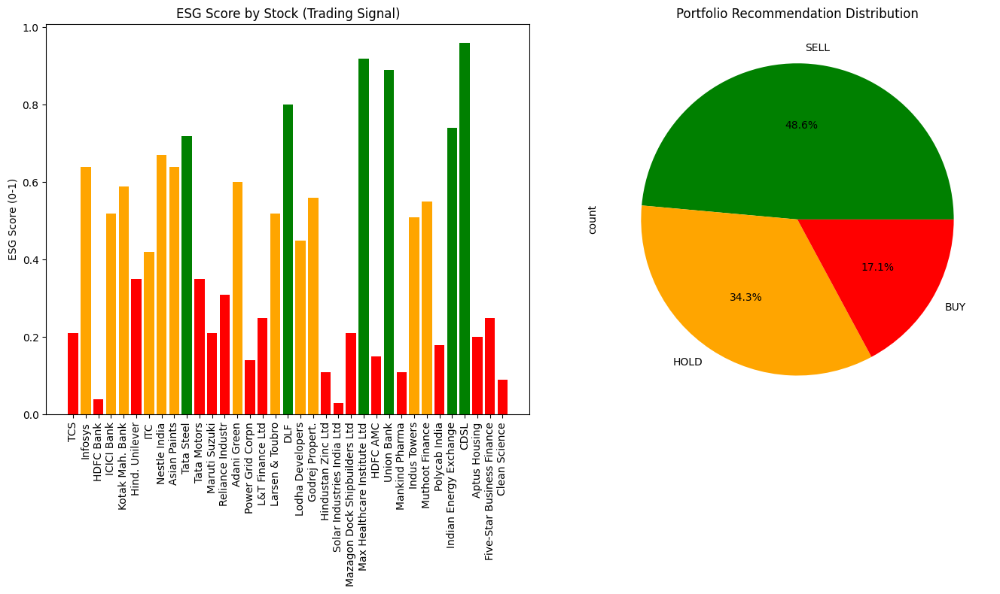

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

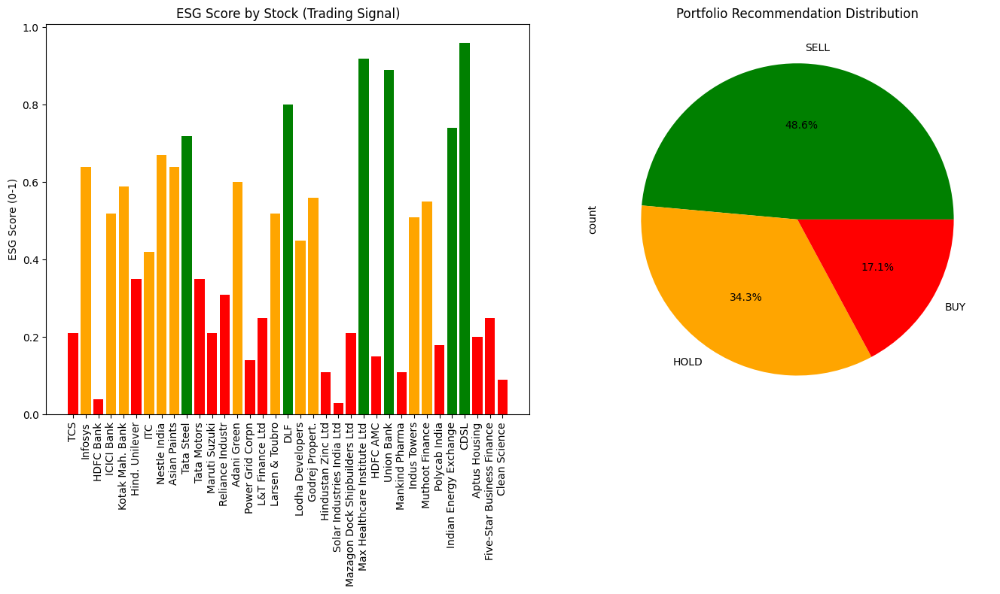

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

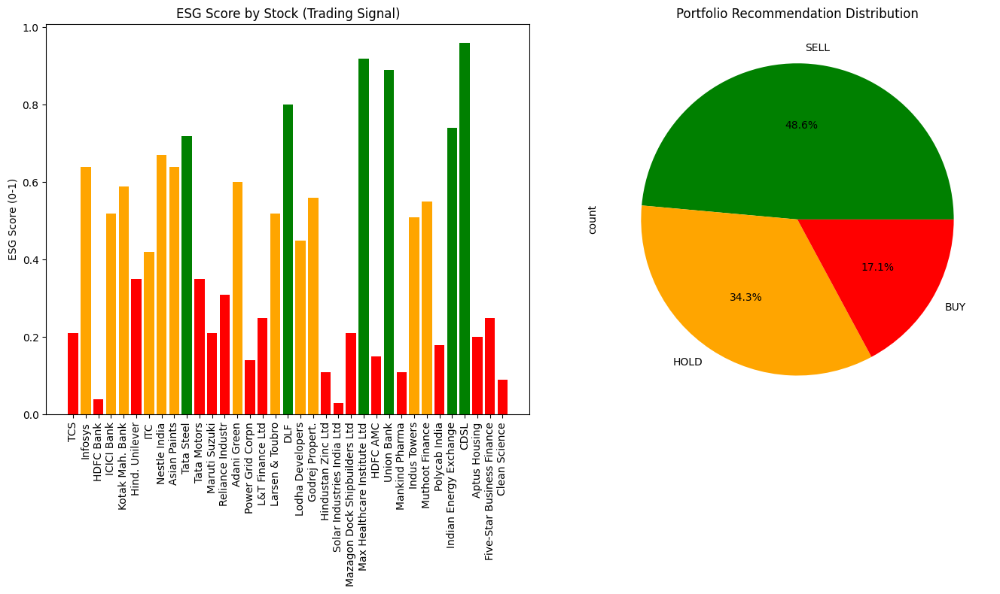

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

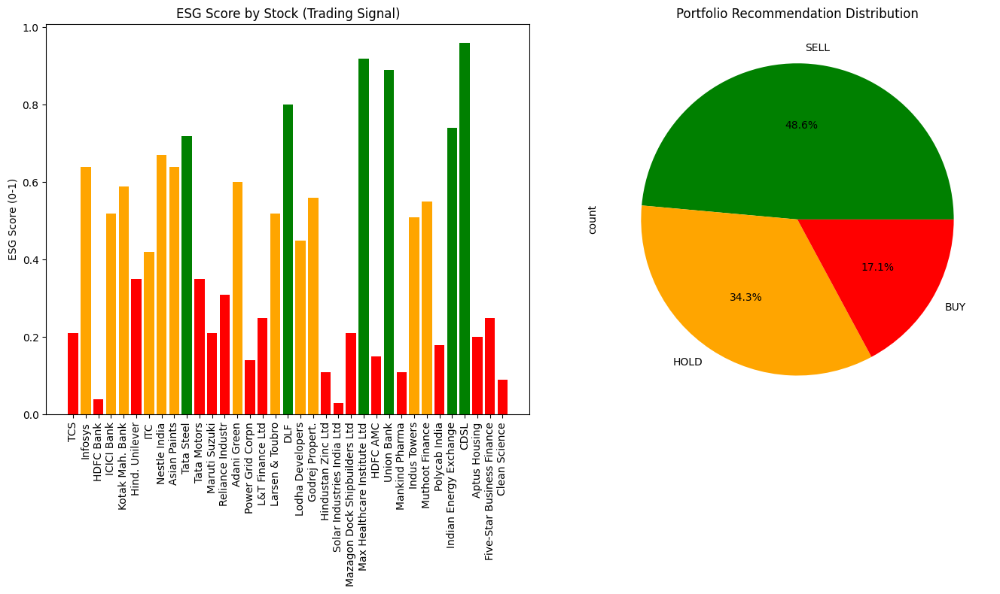

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

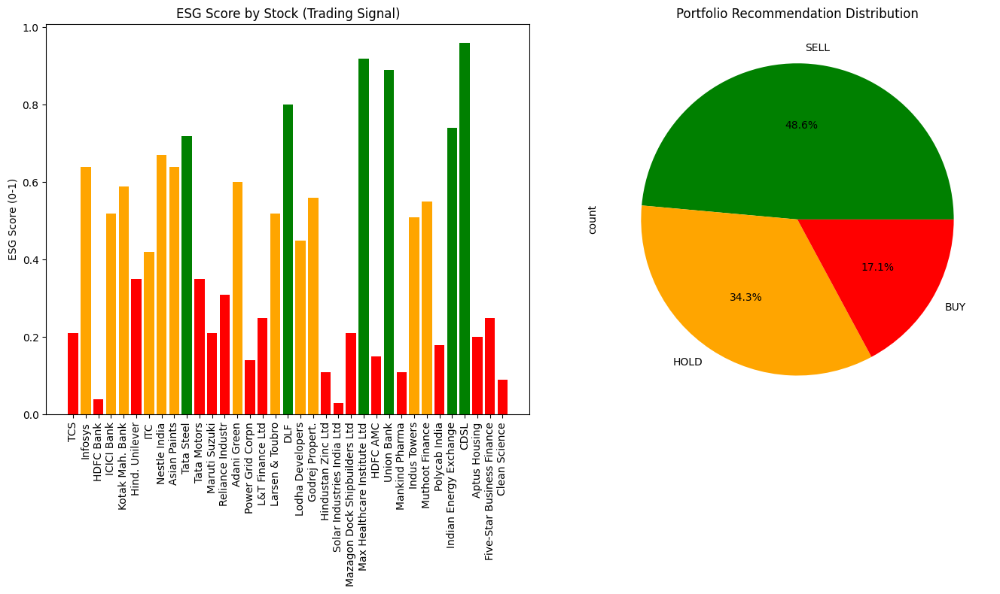

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

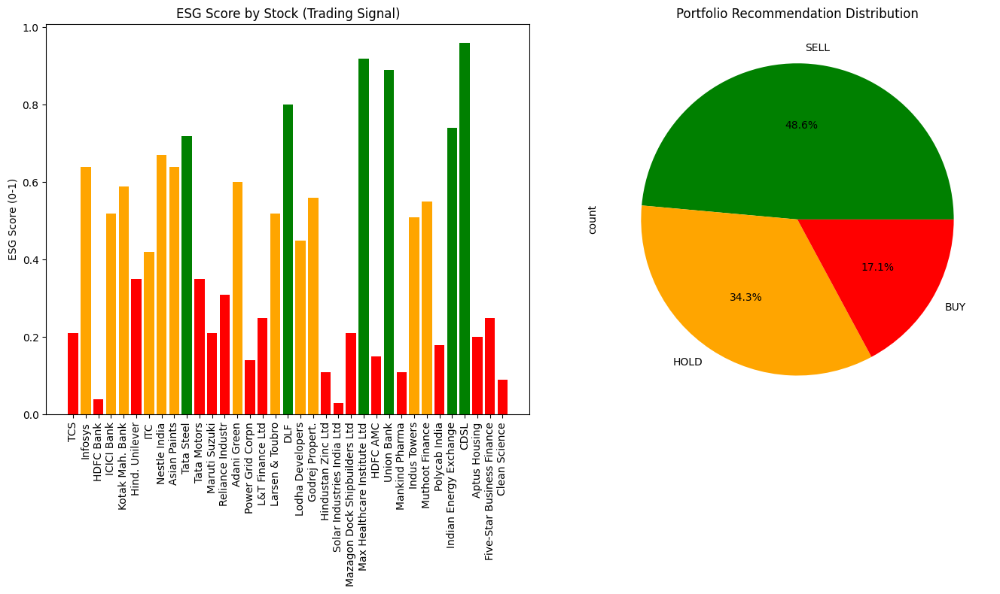

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

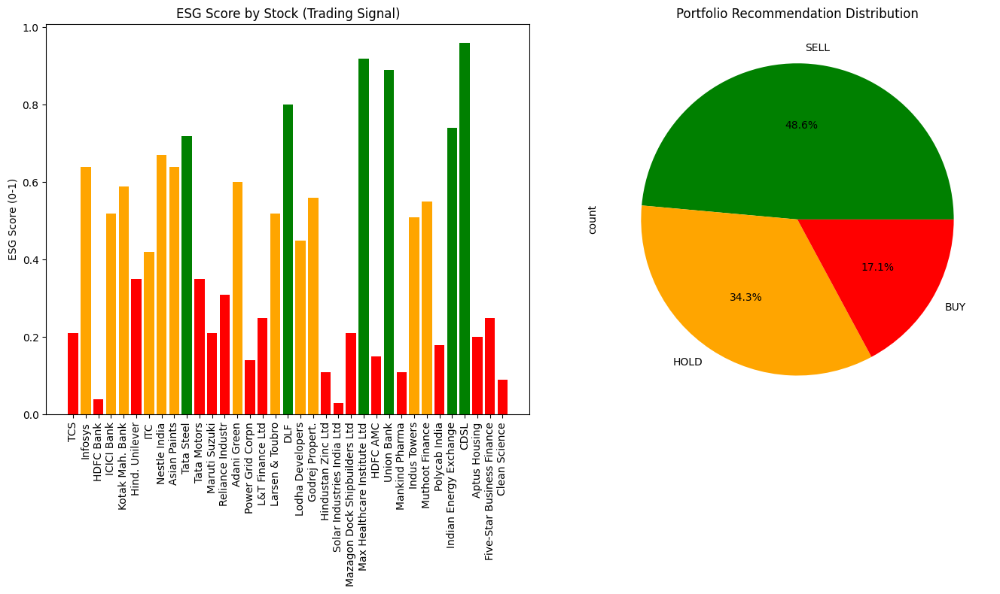

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

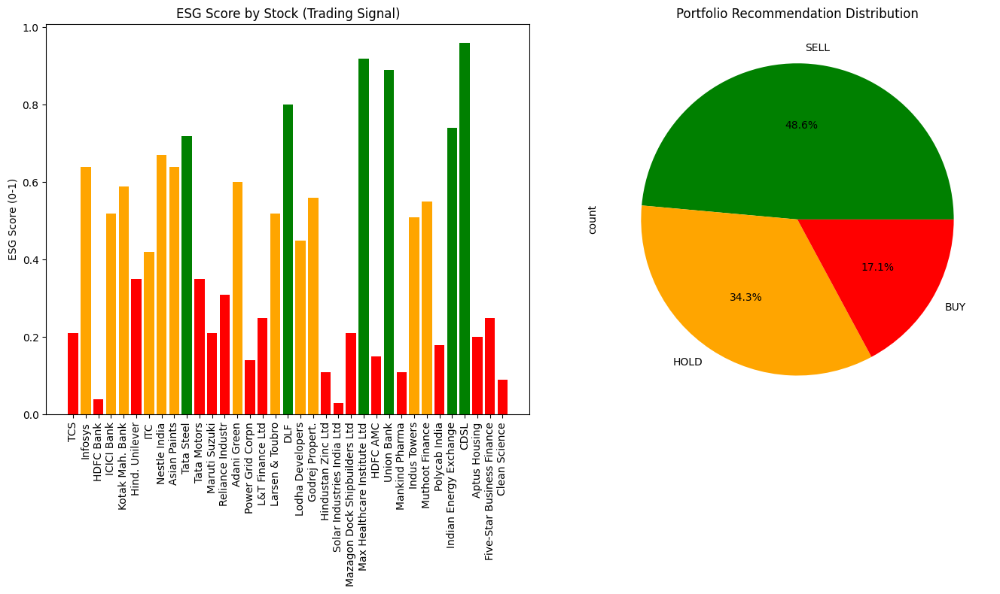

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

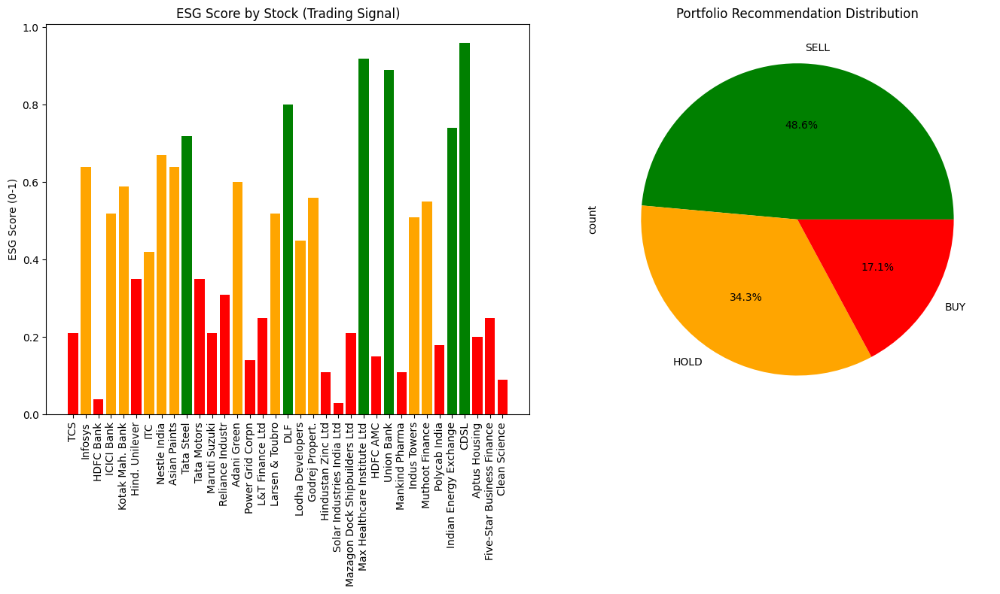

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

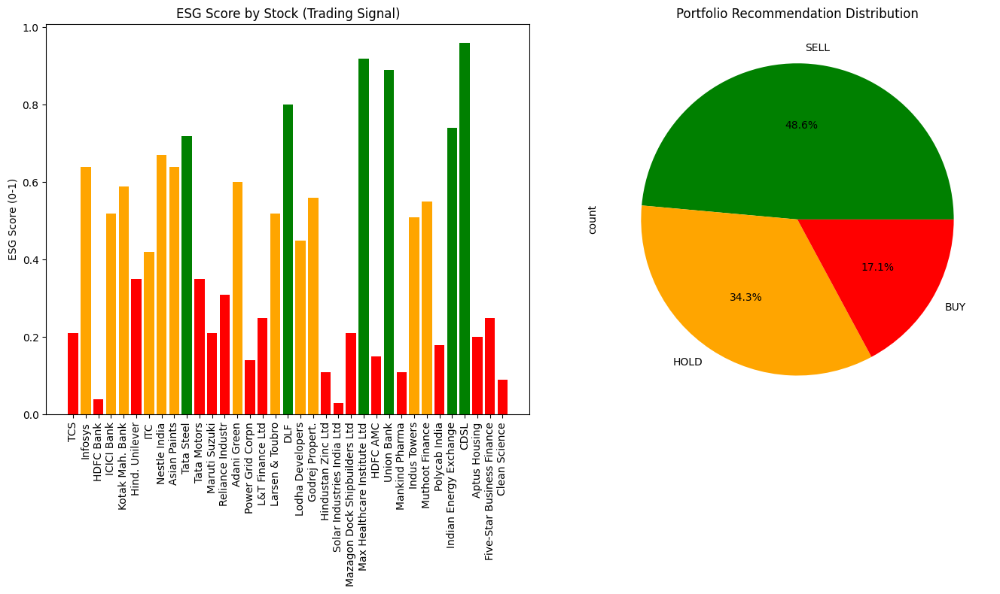

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

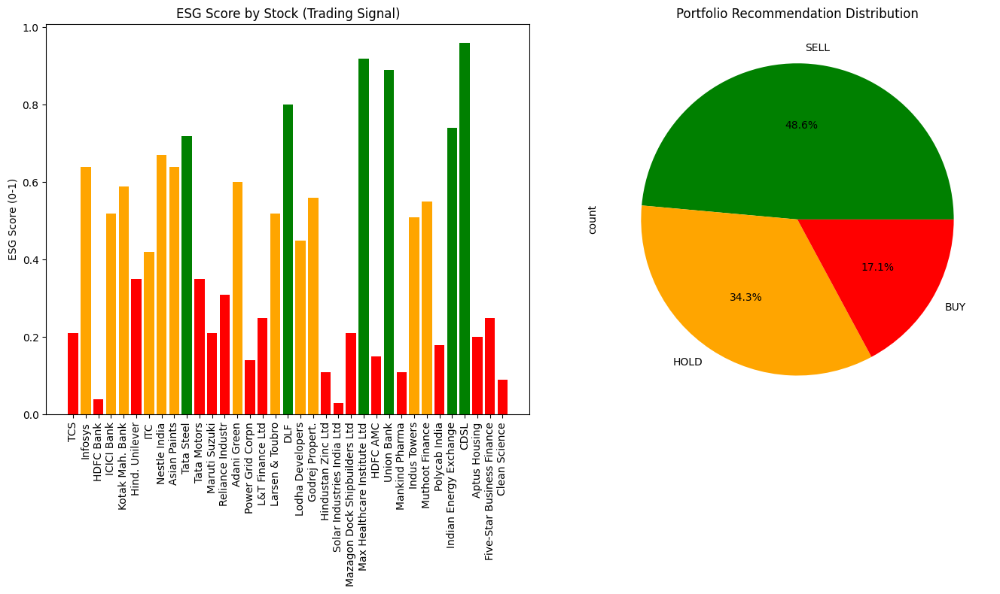

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

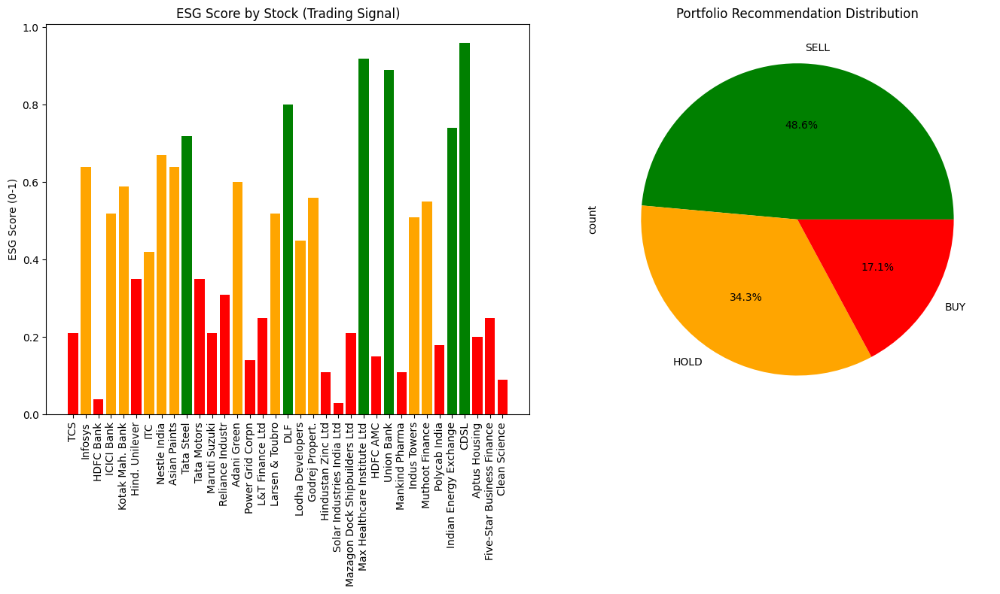

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

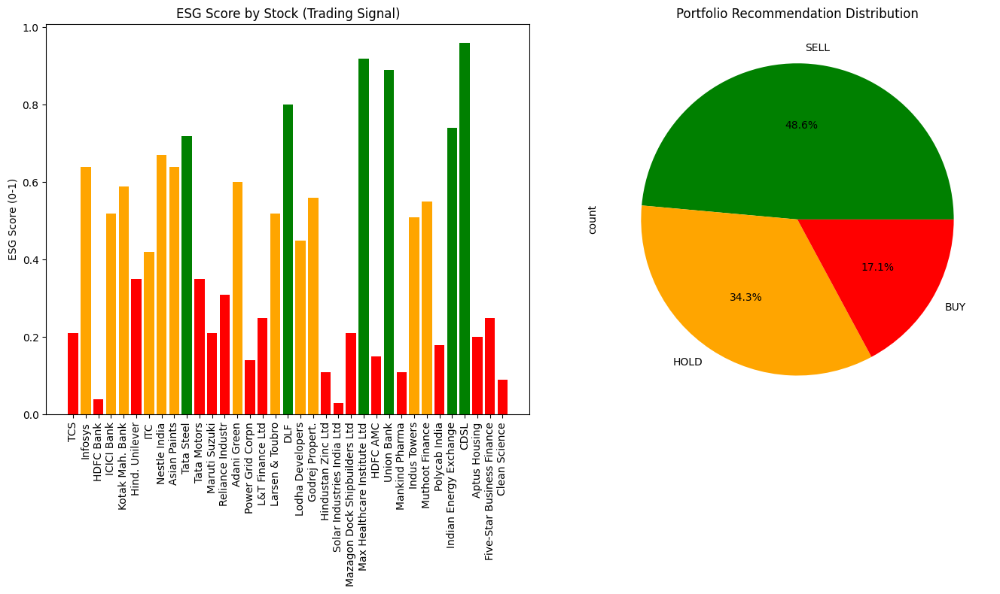

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

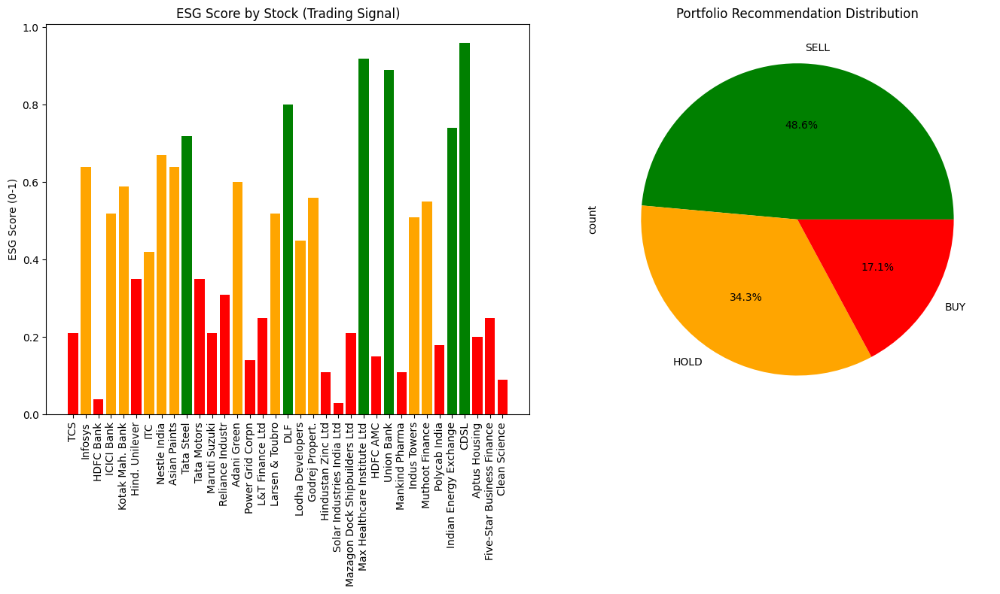

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

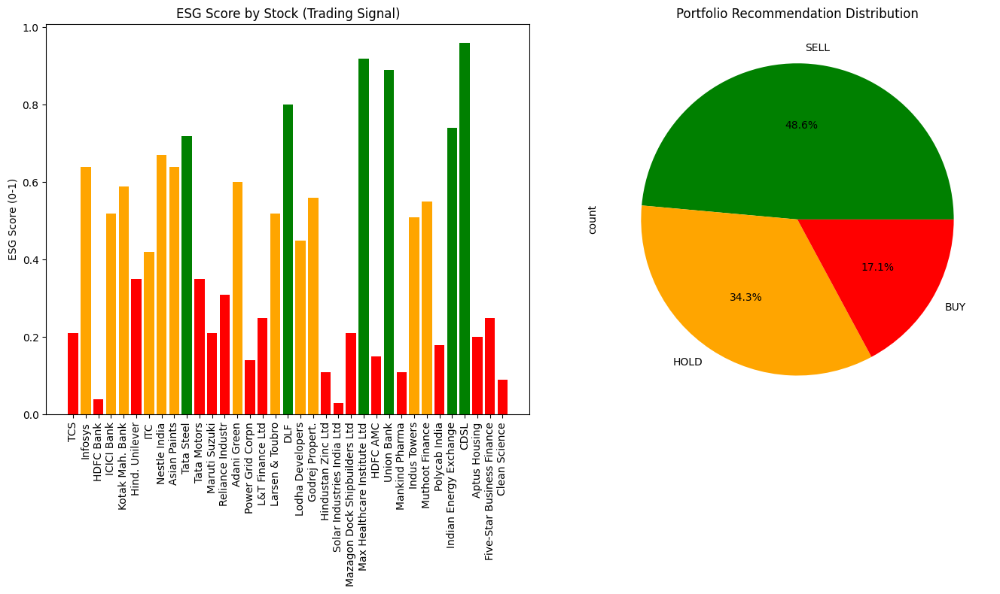

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

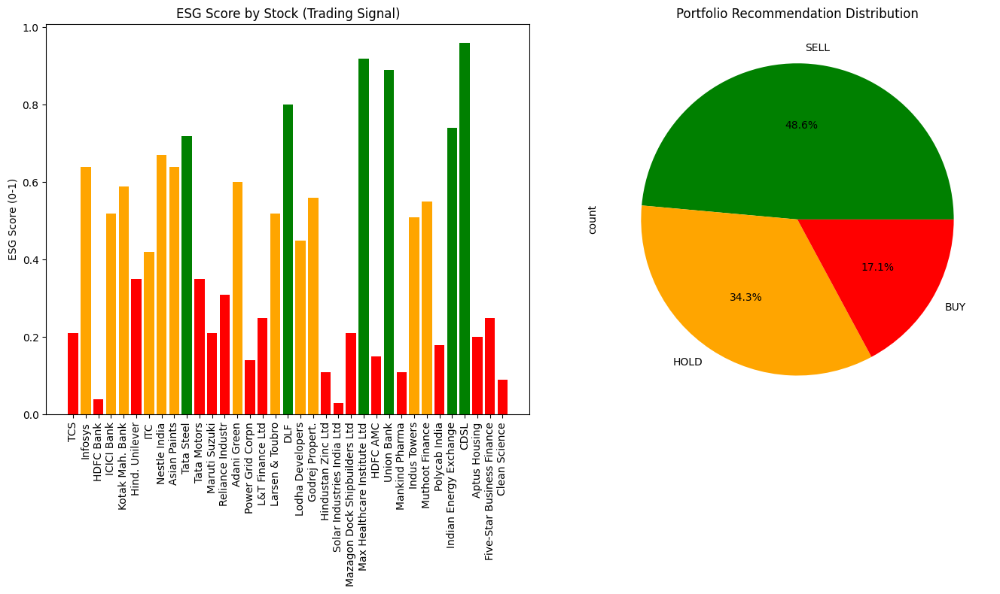

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

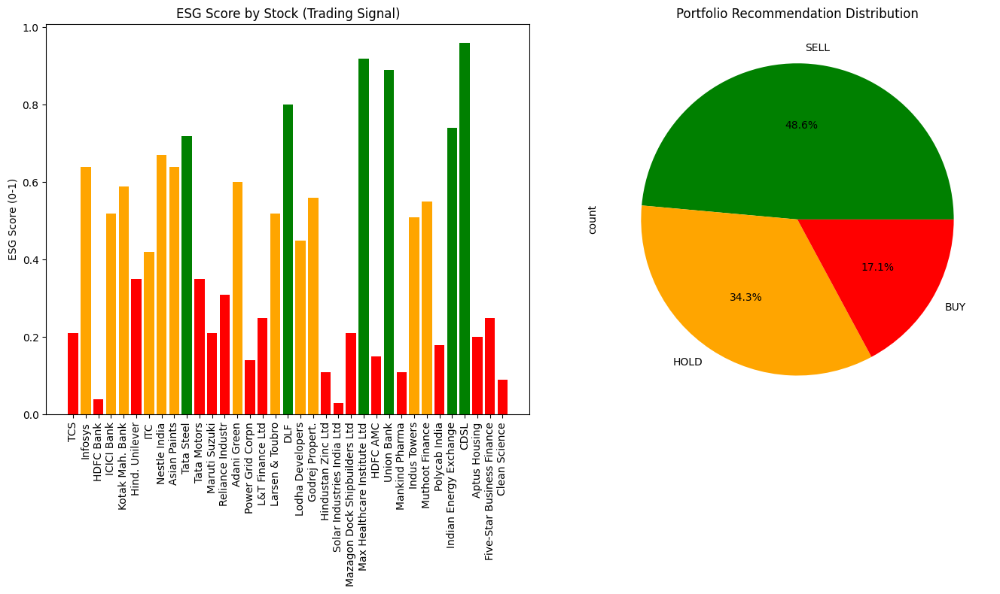

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

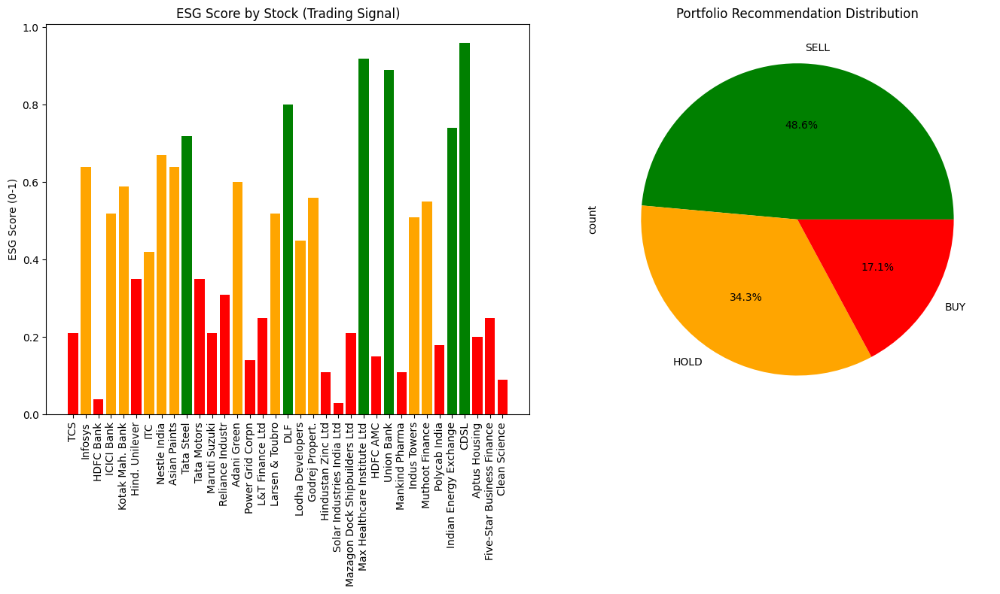

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

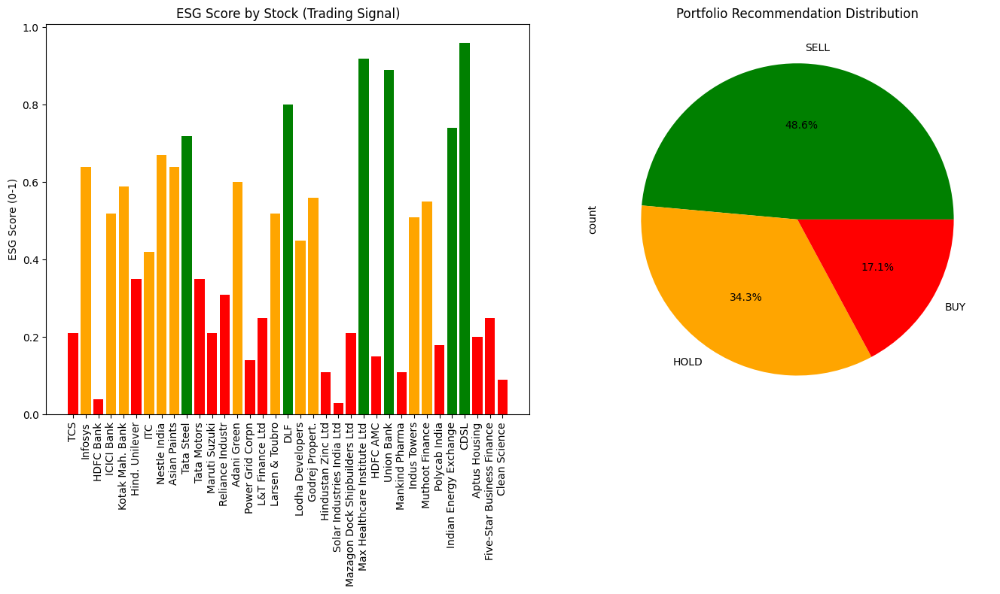

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

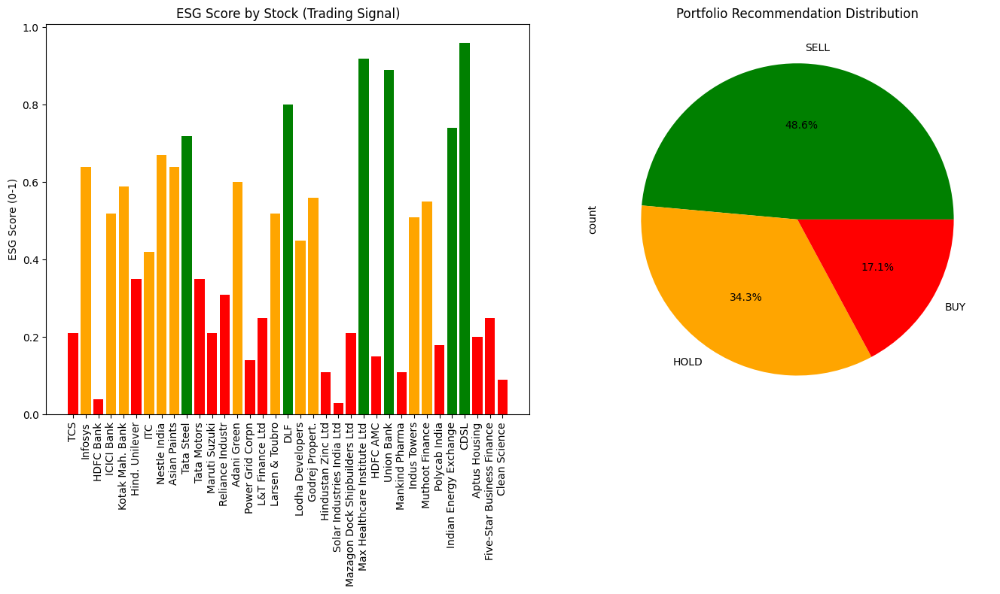

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

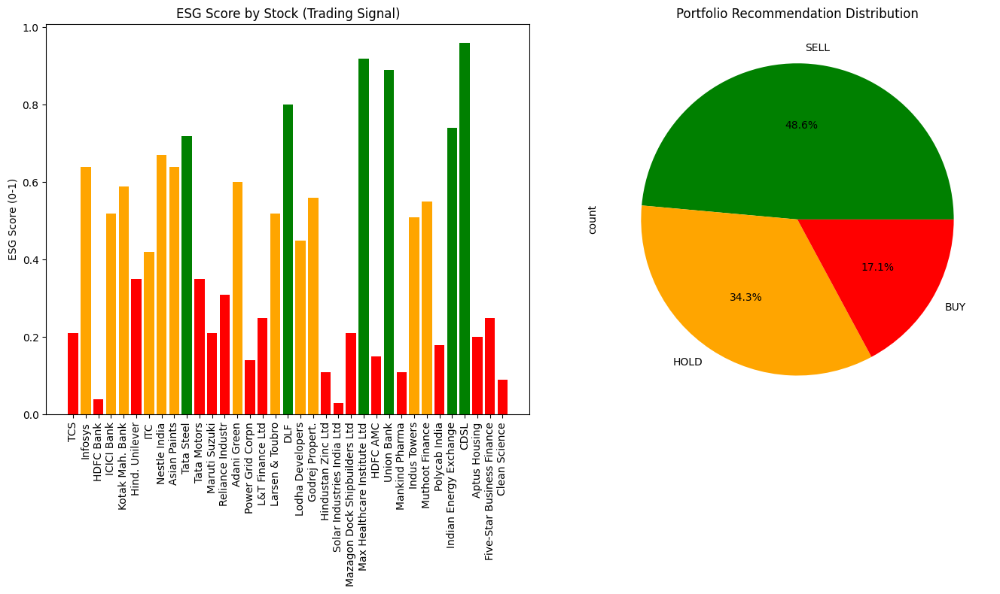

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

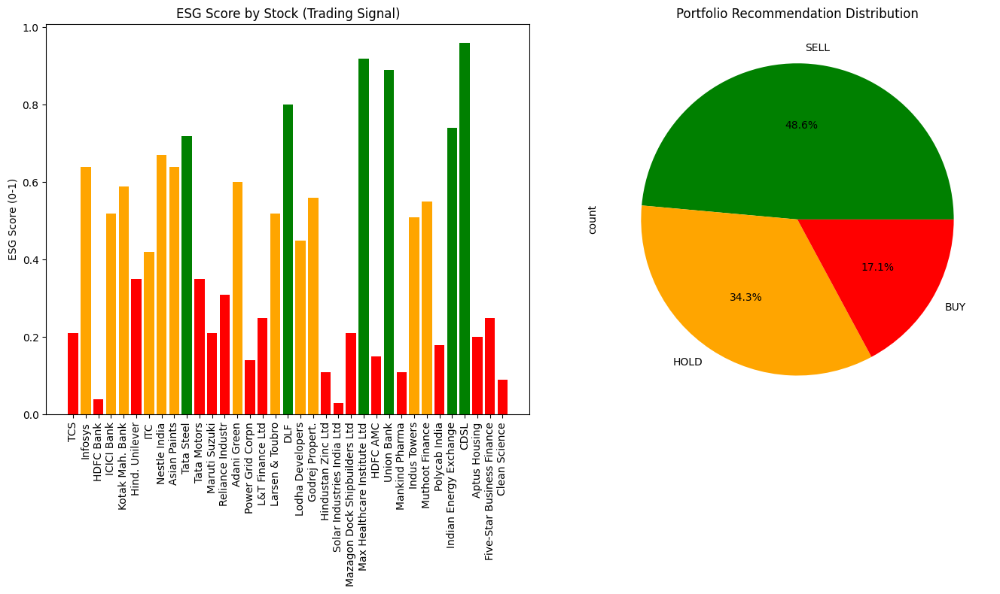

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

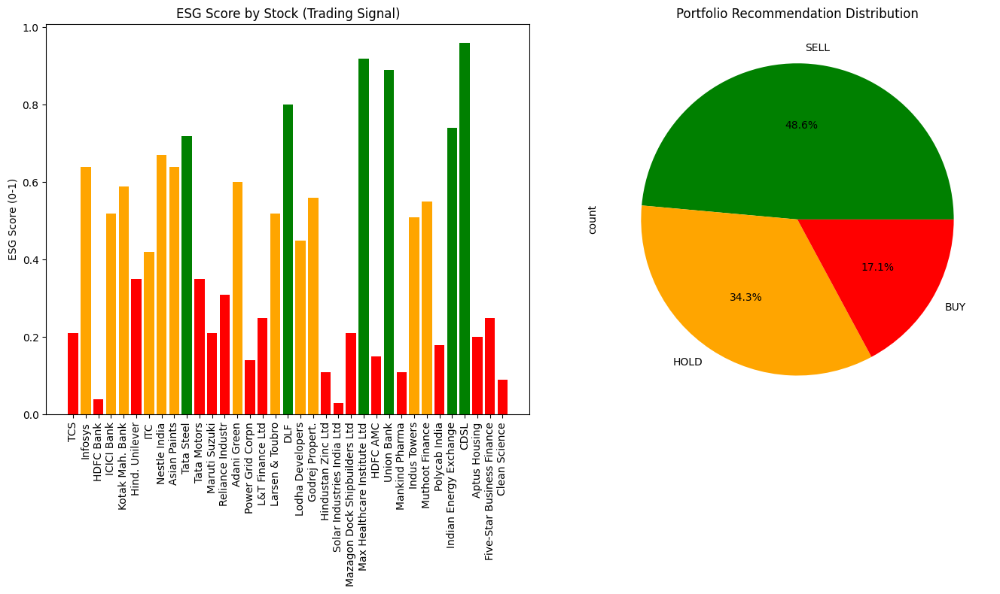

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

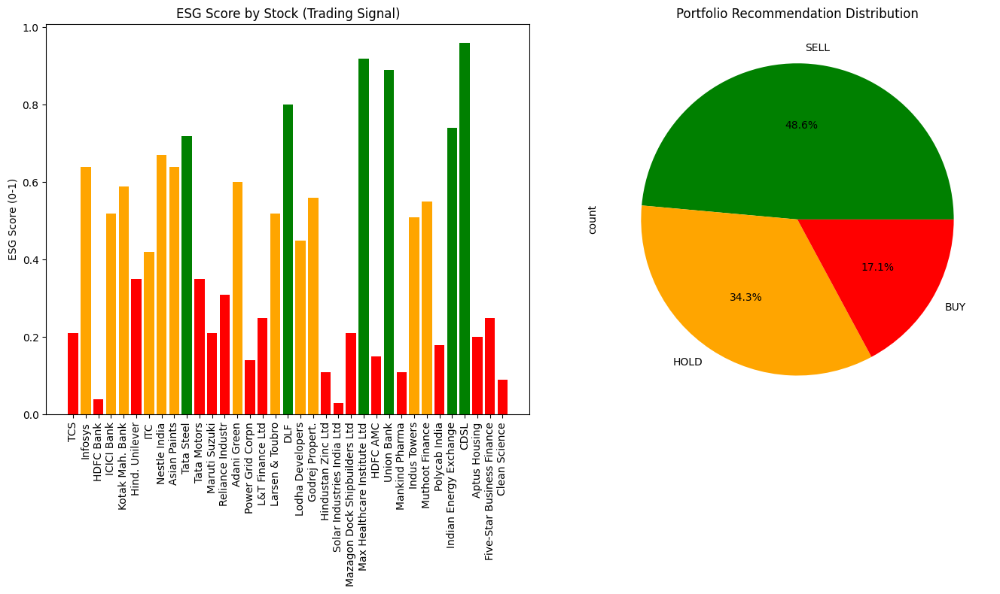

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

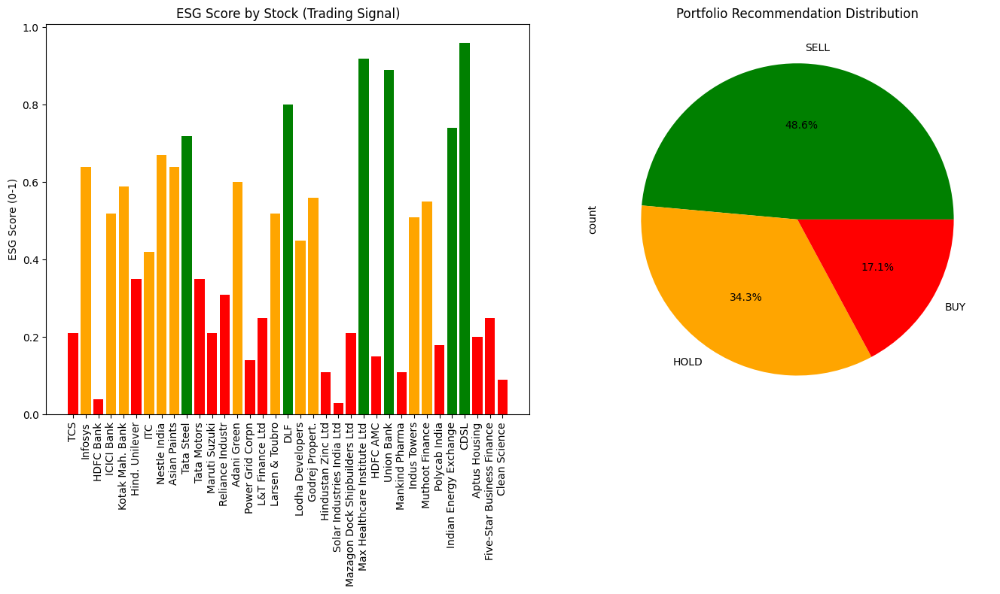

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

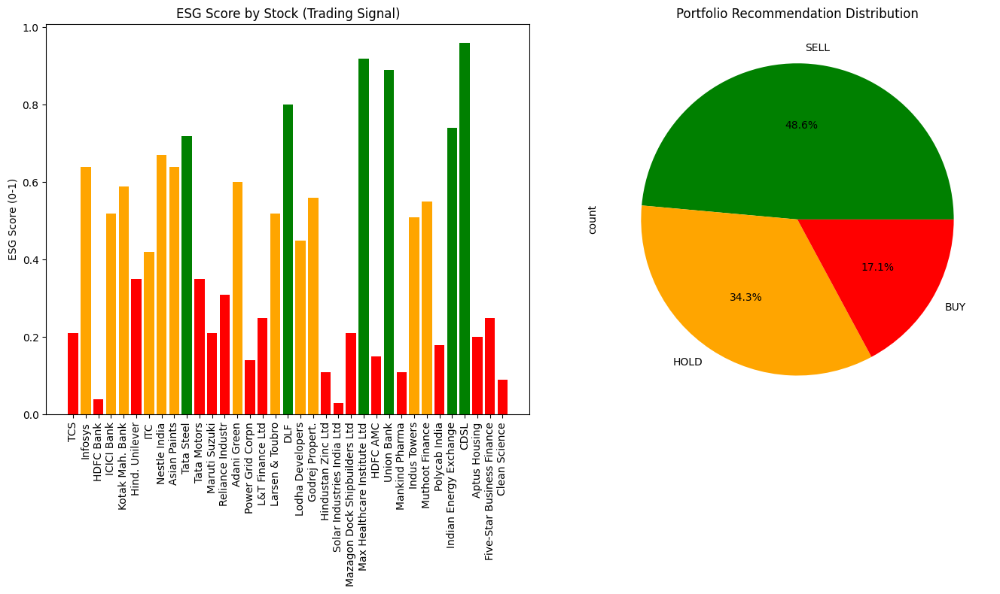

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

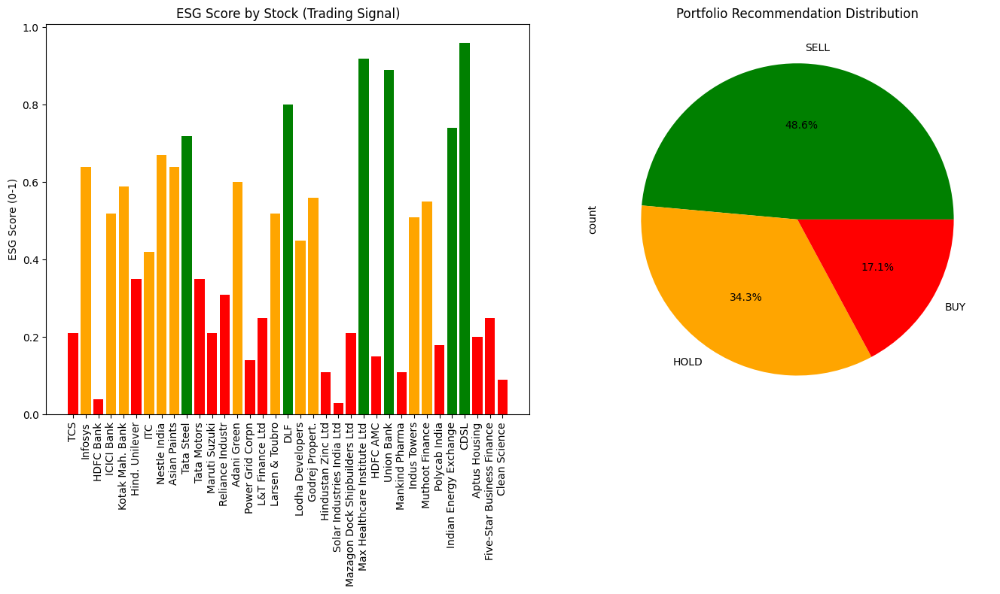

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

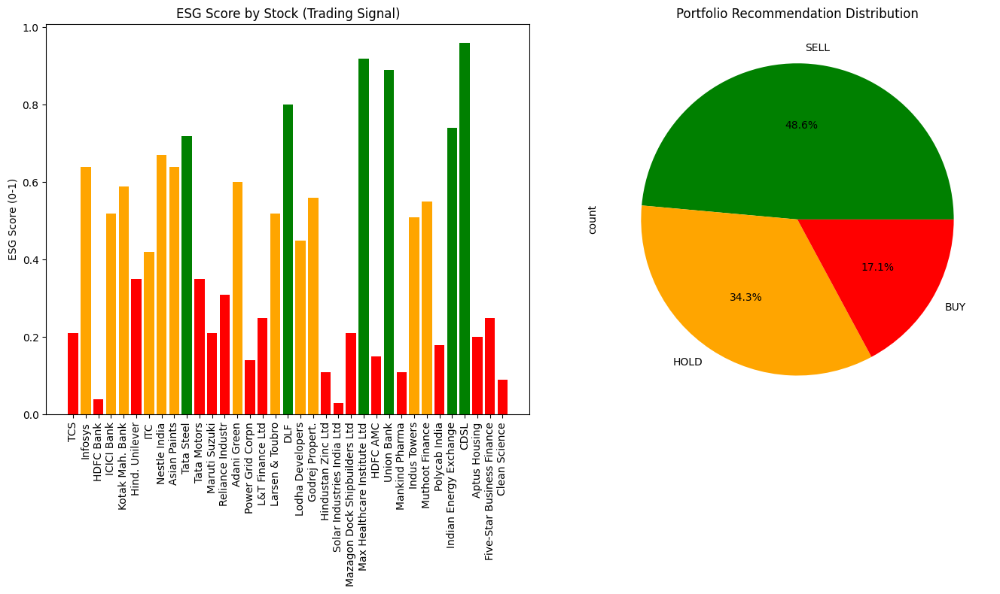

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

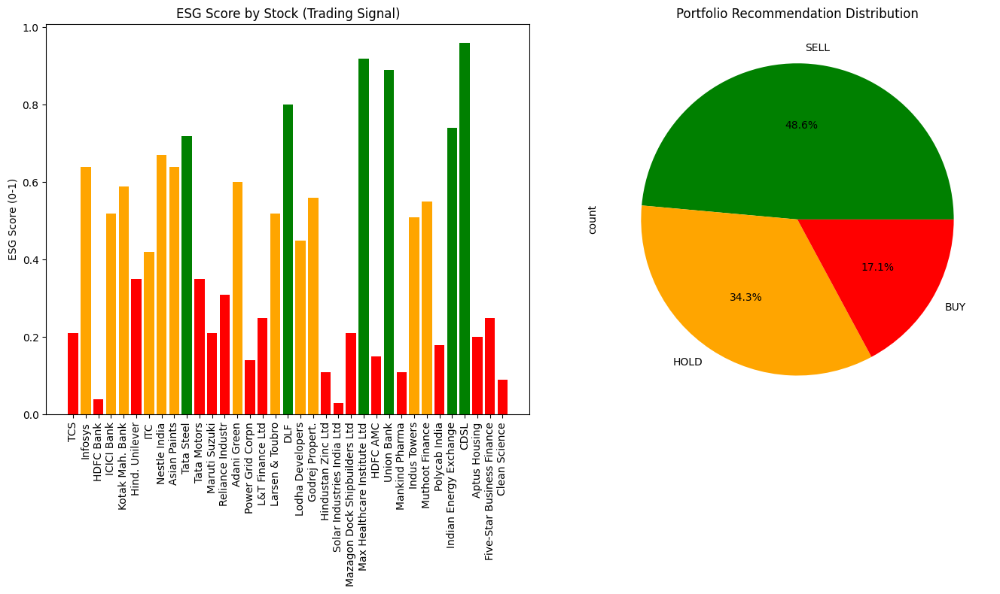

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

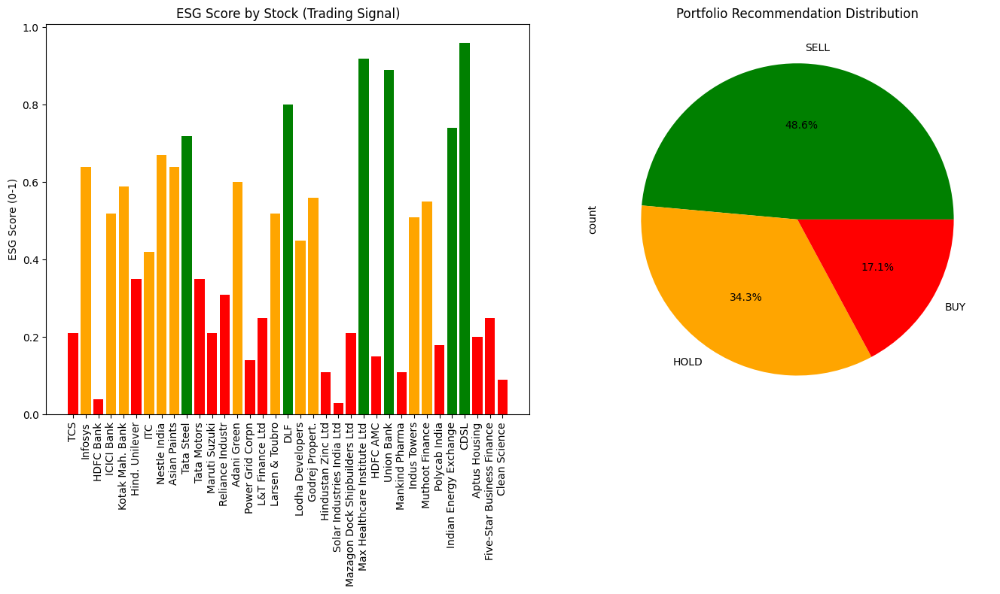

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

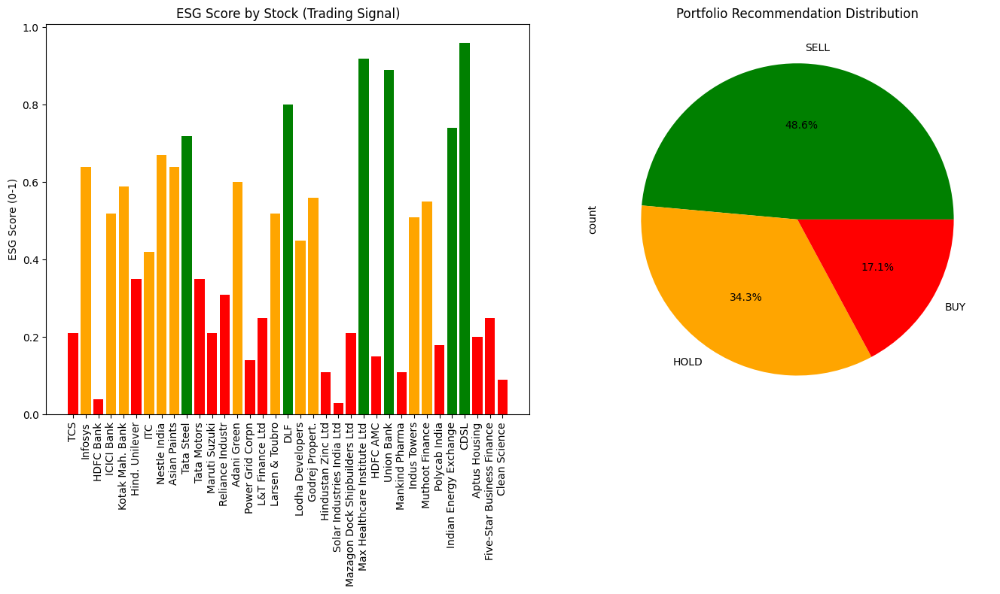

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

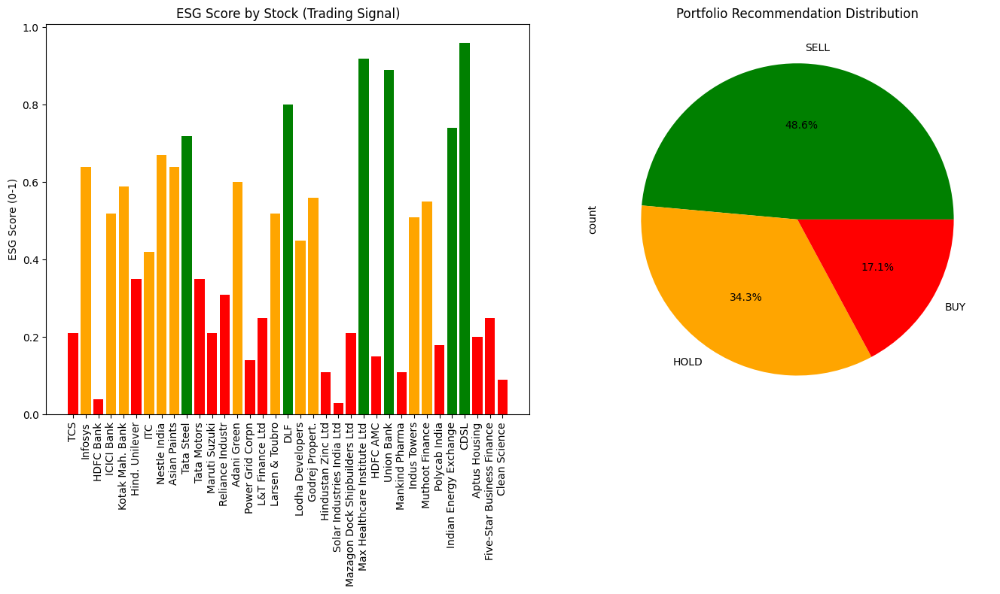

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

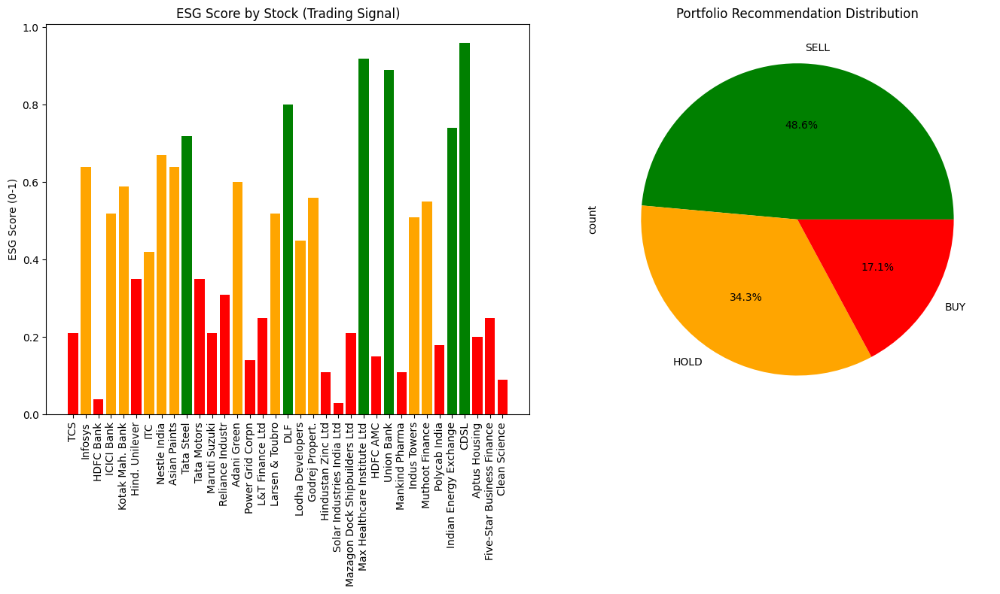

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

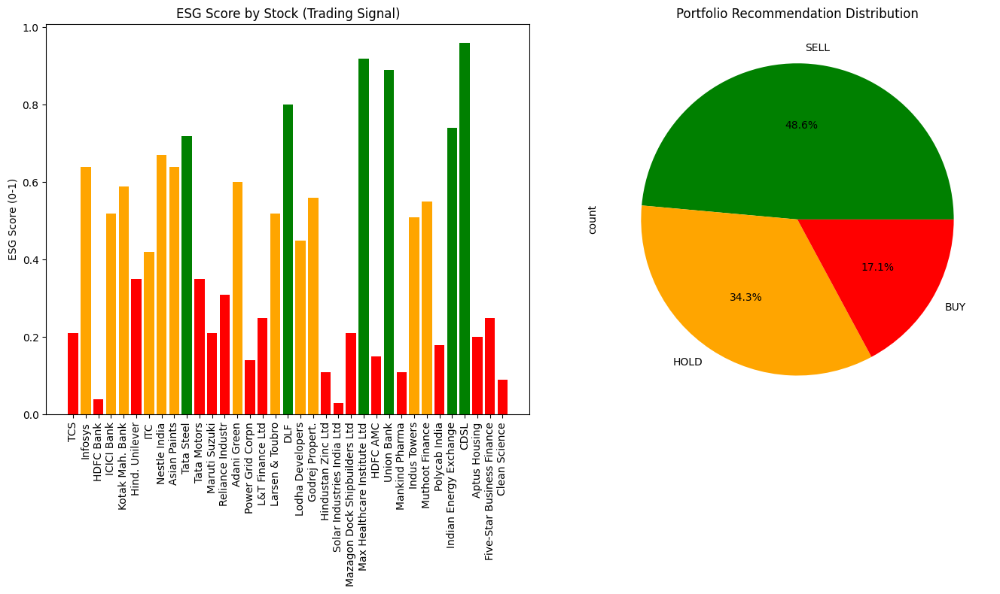

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

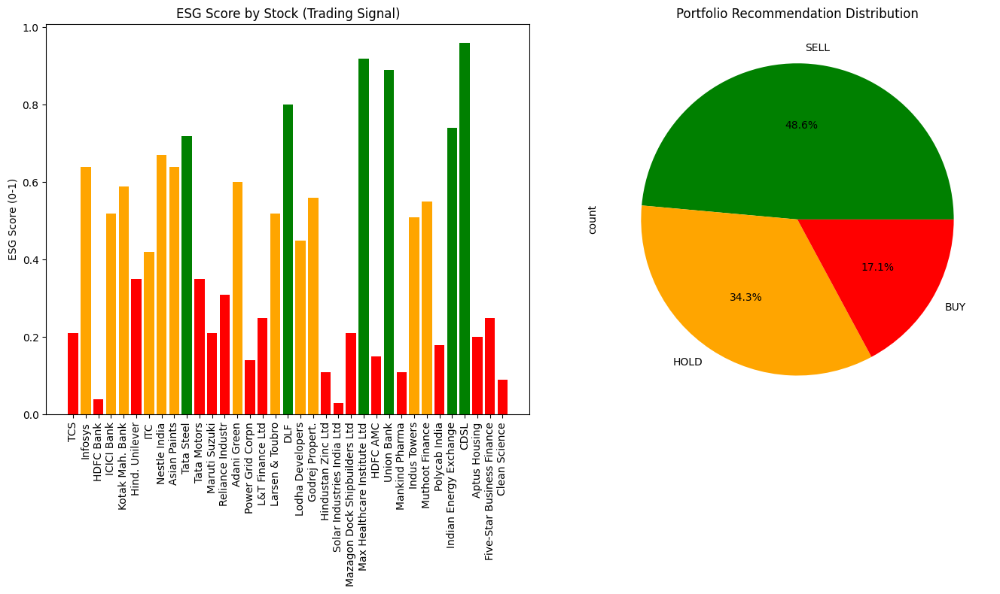

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

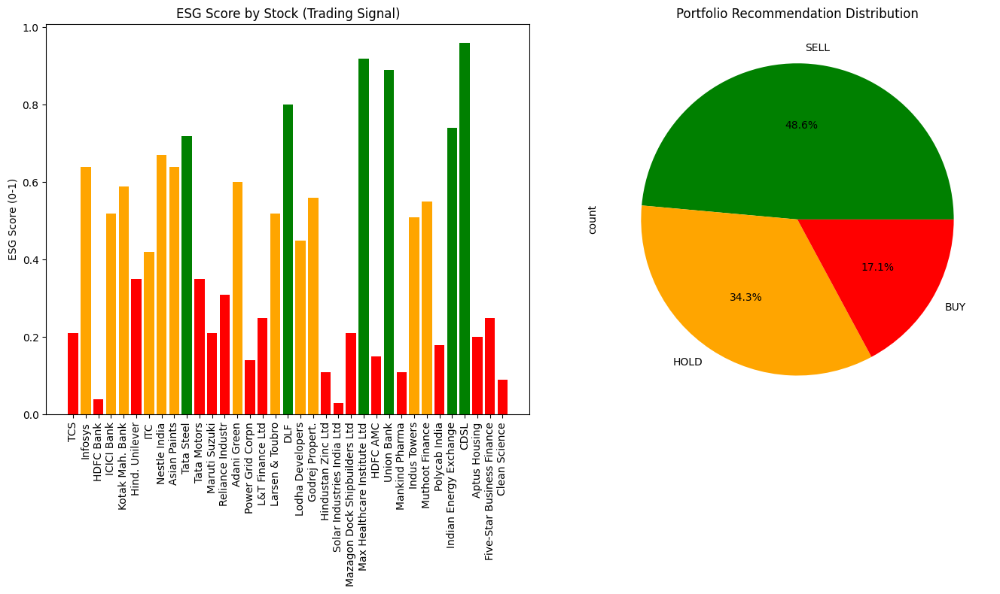

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

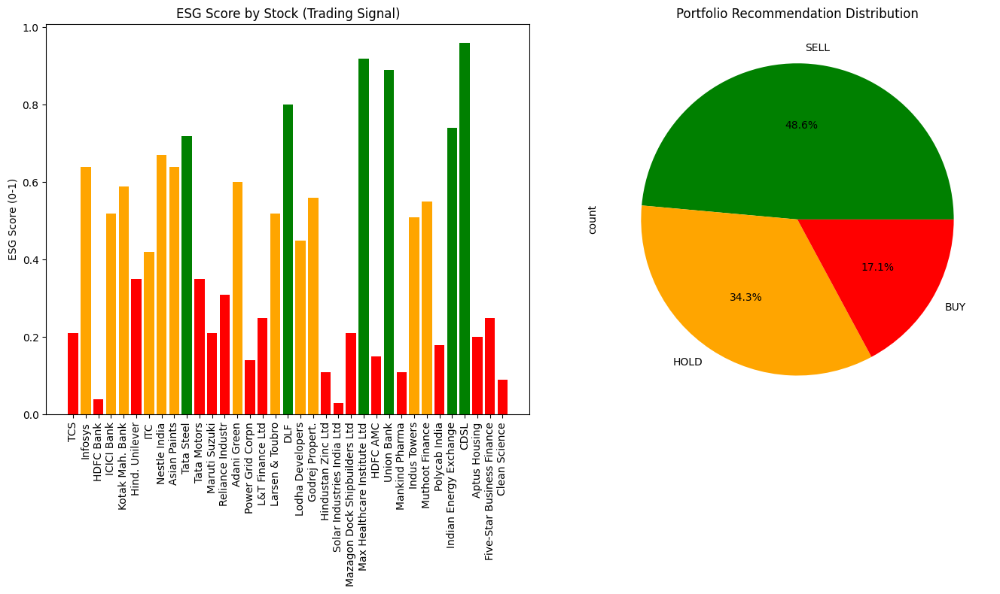

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

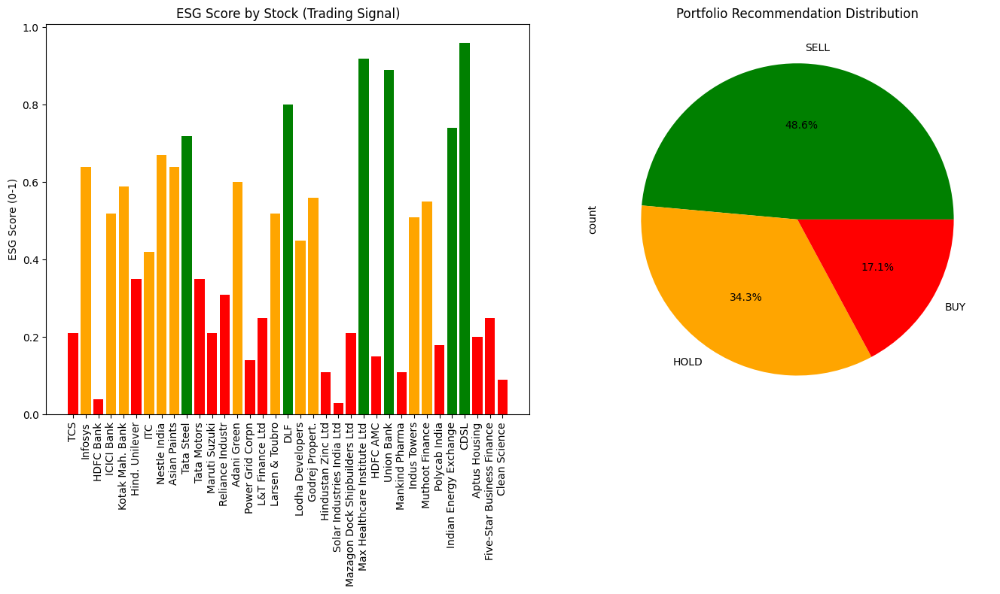

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

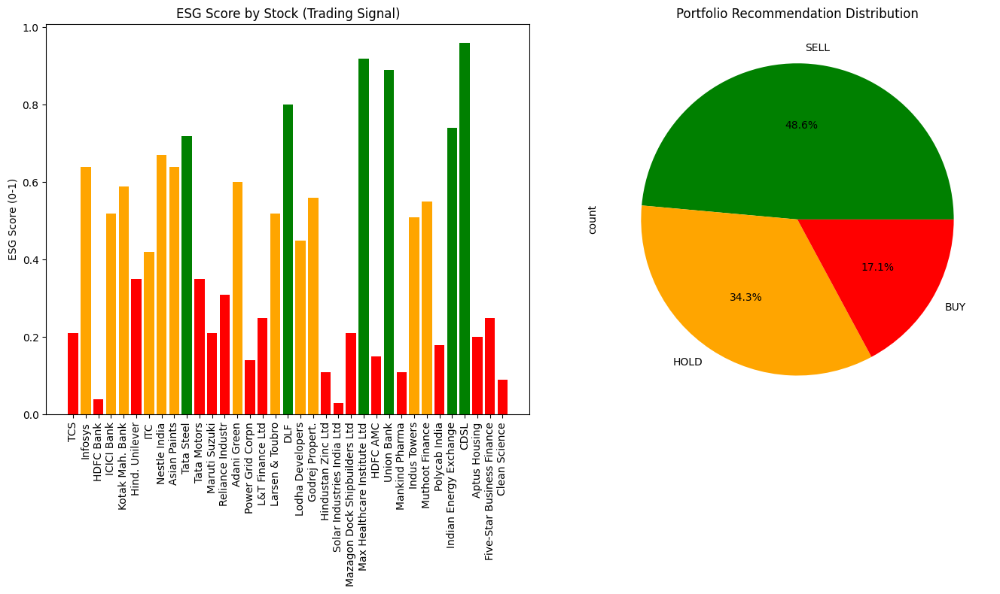

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

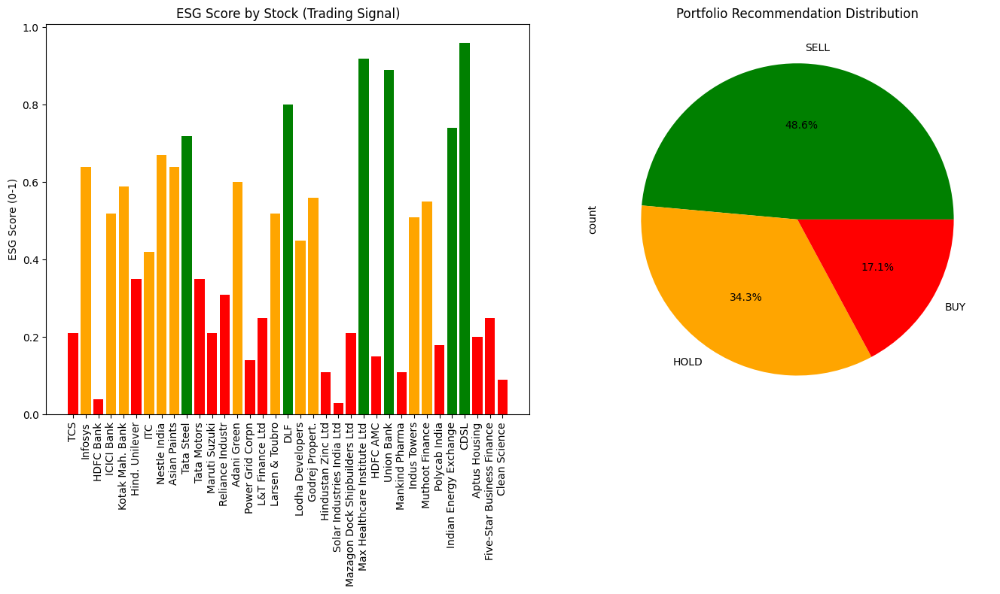

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

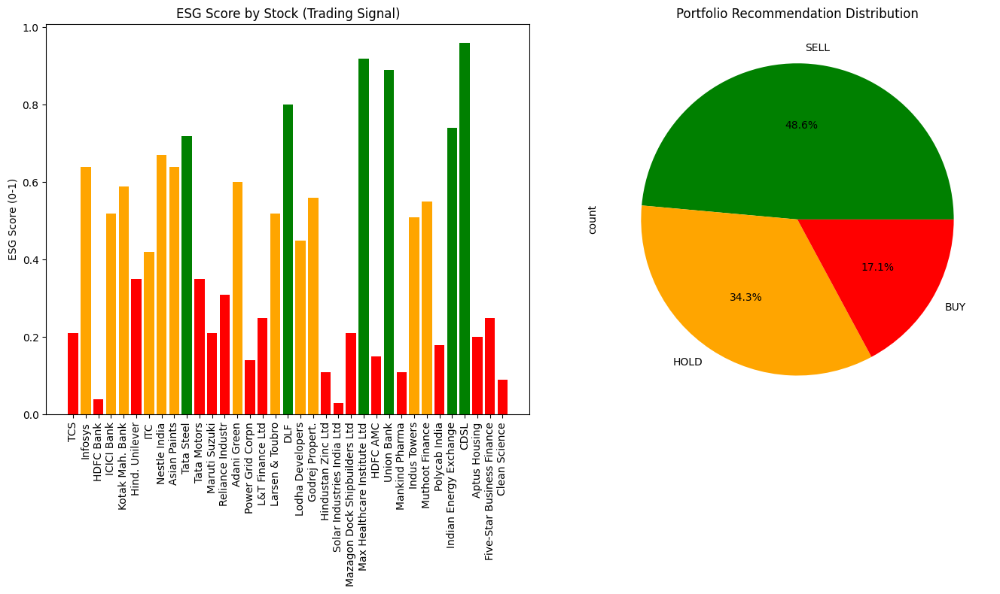

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

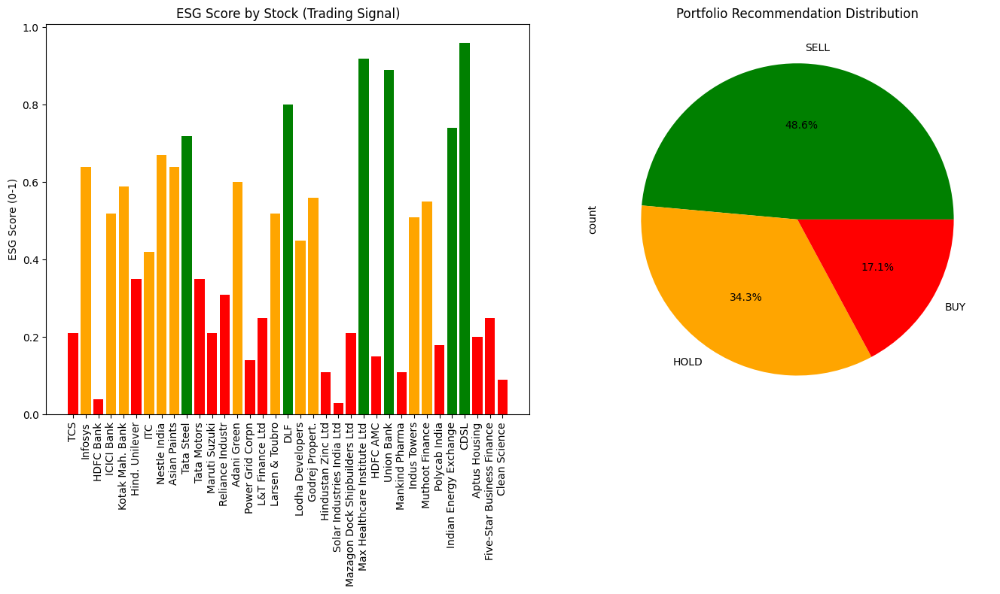

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

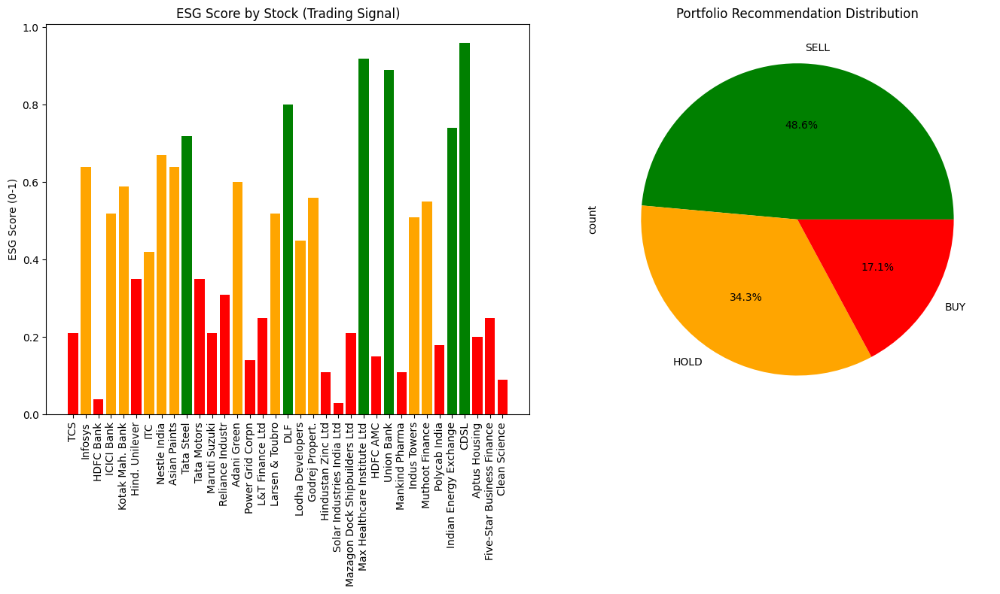

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

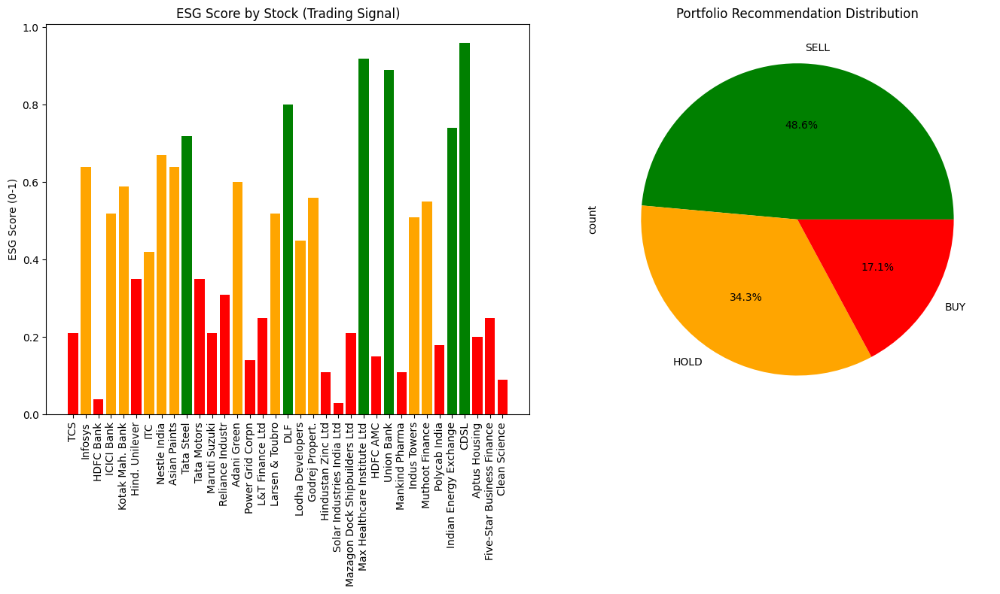

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

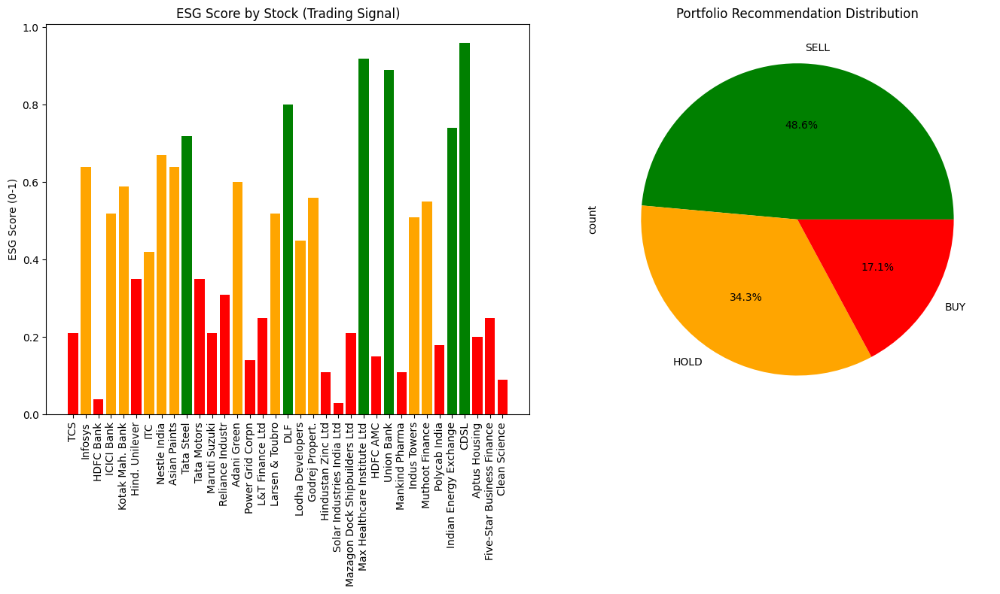

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

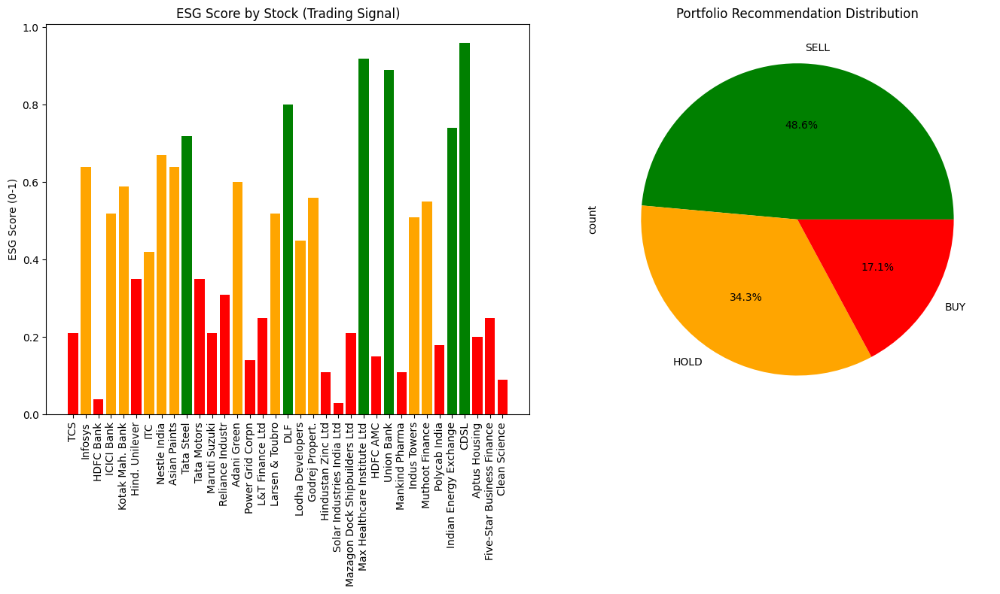

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

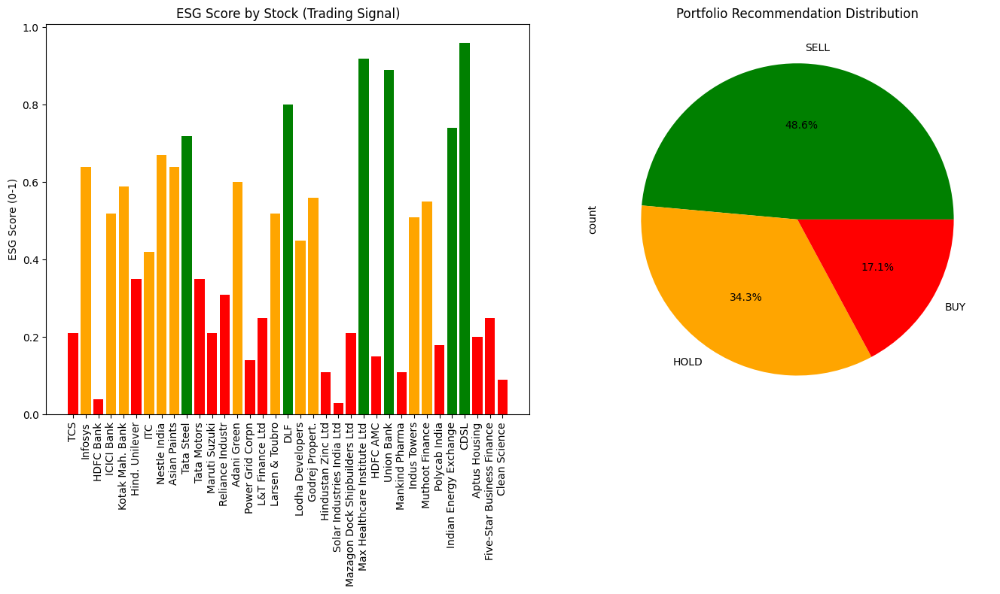

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

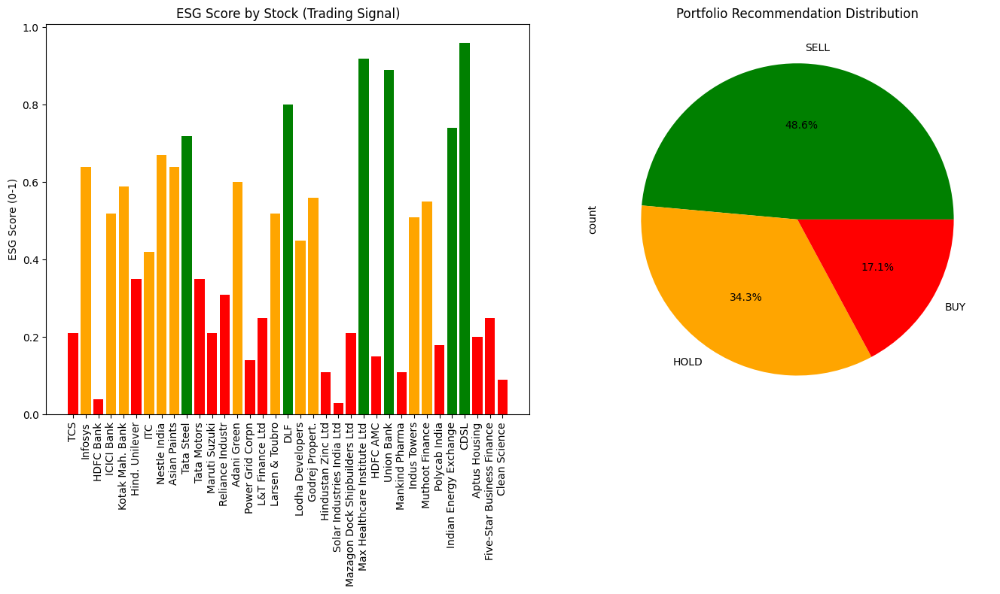

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

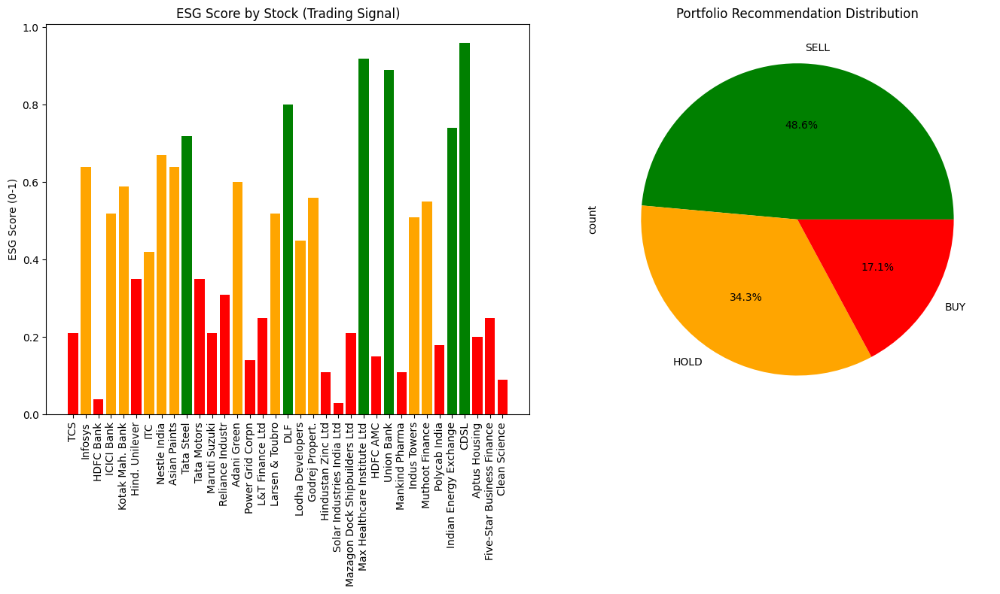

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

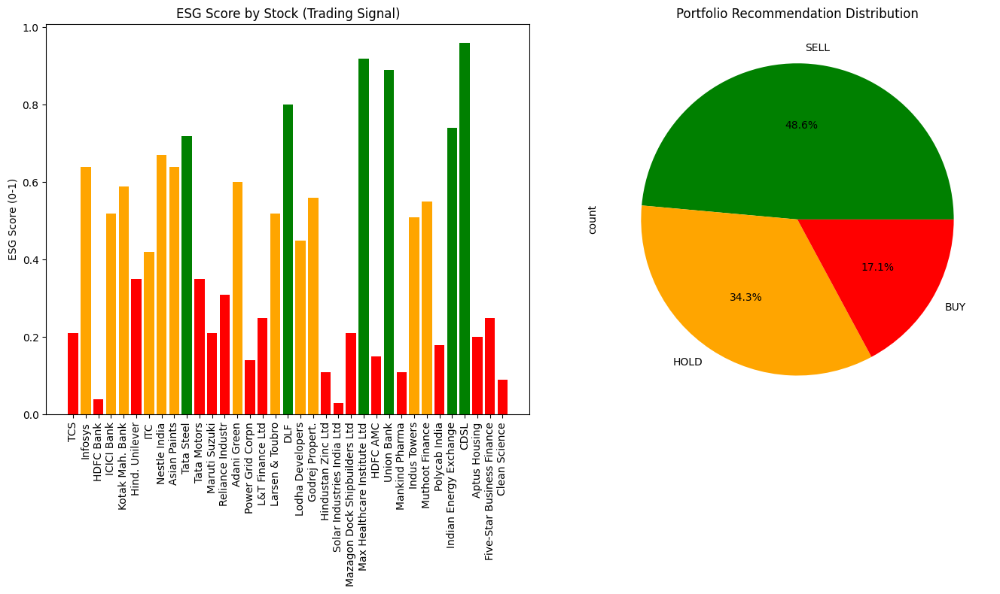

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

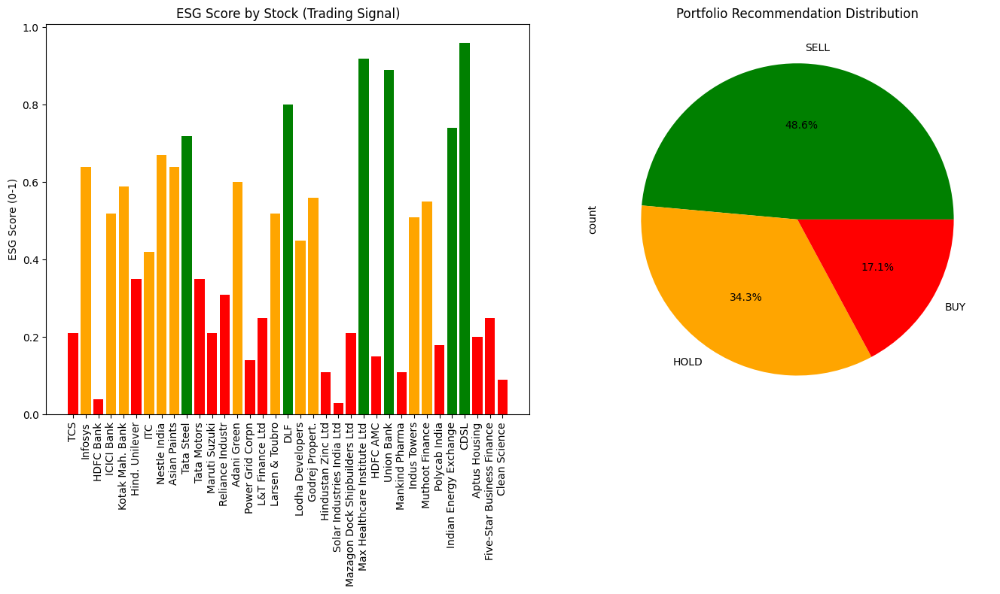

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

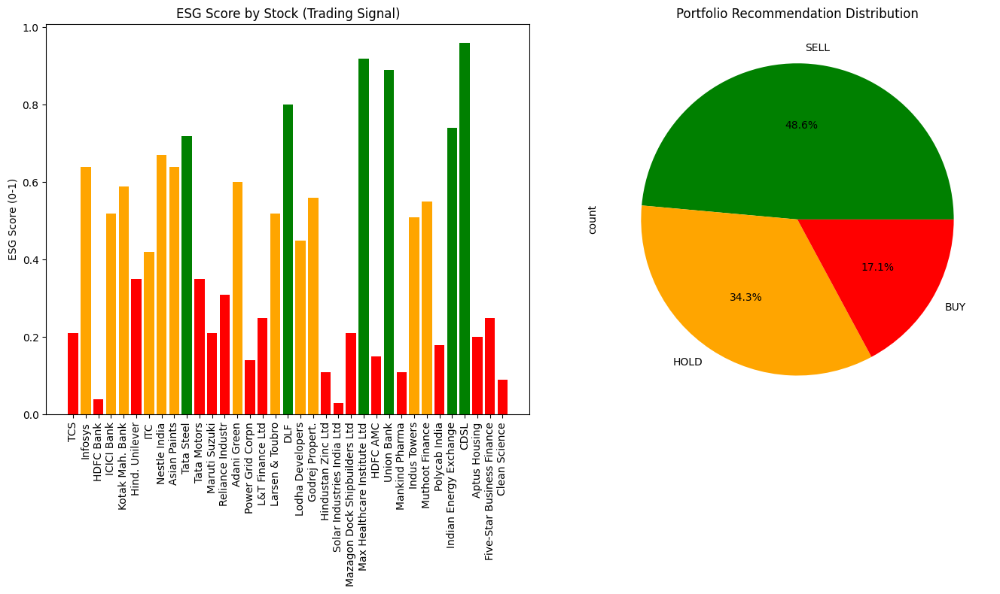

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

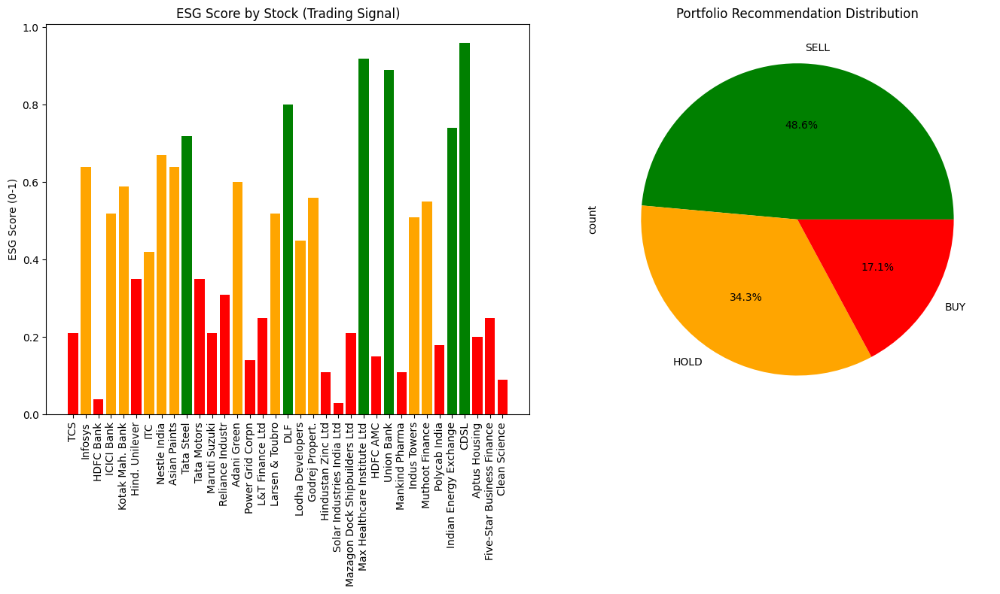

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

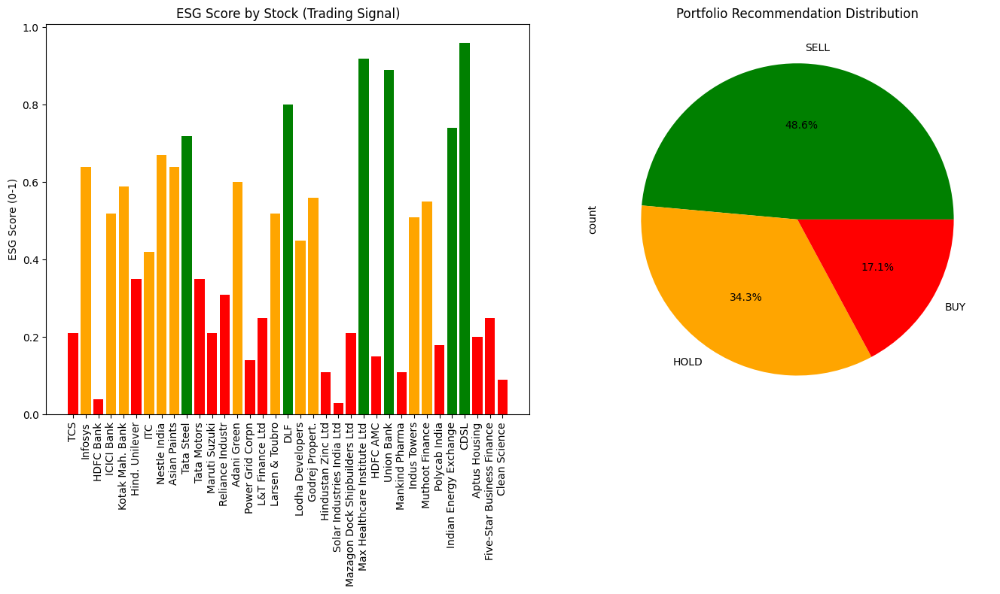

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

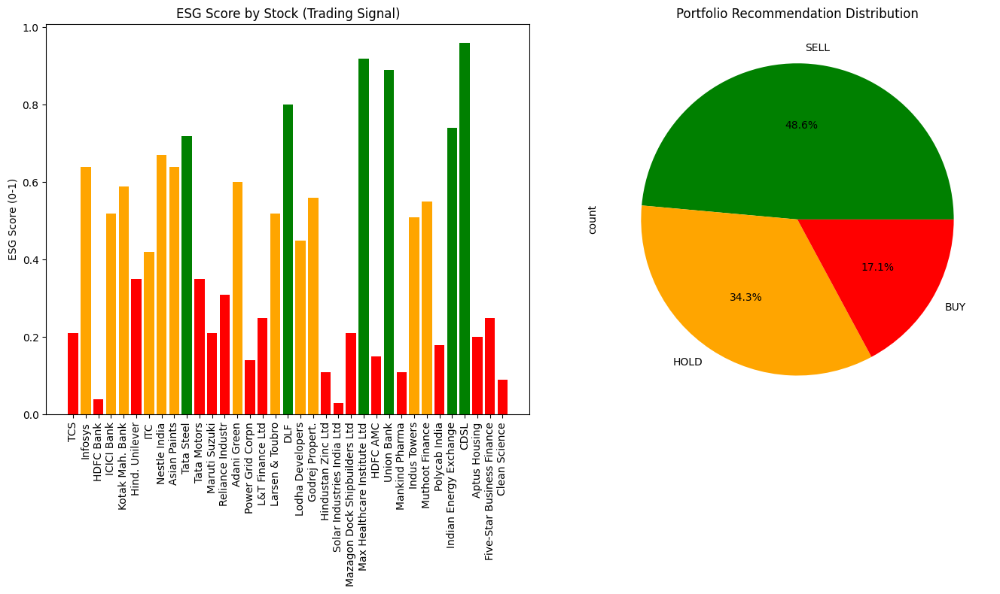

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

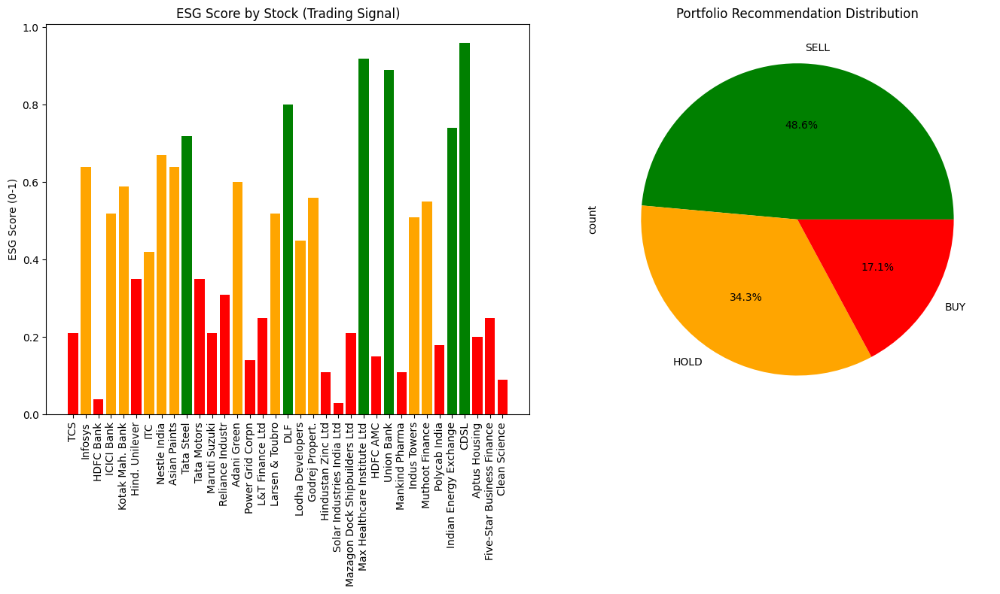

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

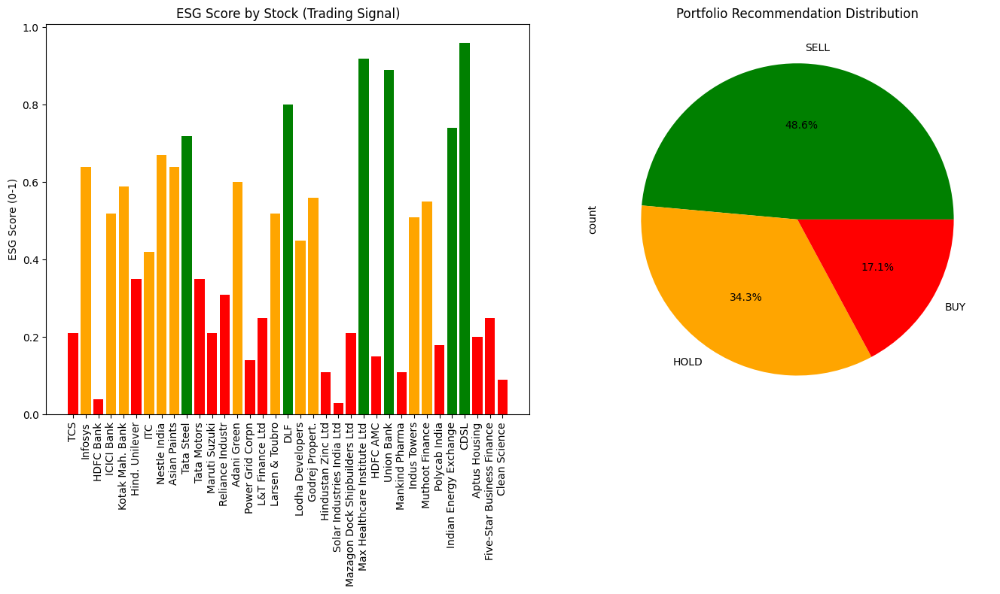

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

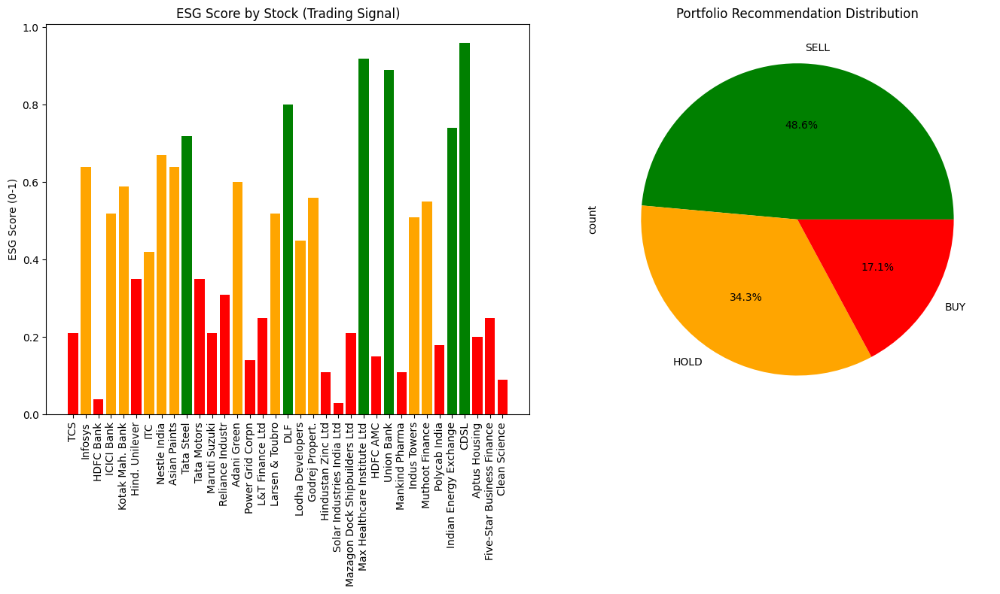

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

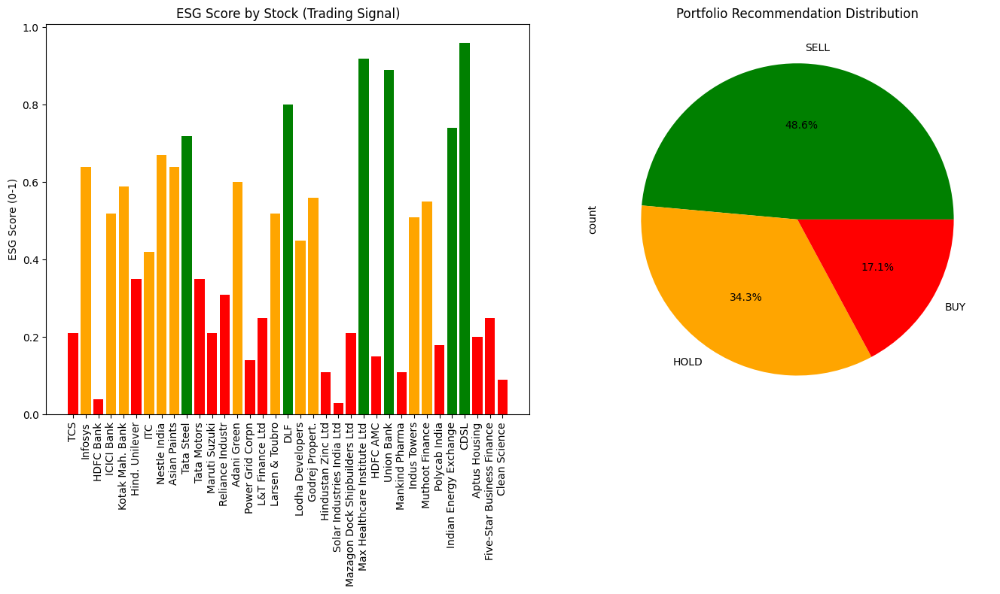

                            Stock  Price (INR)  ESG Score Recommendation
0                             TCS      3049.10       0.21           SELL
1                         Infosys      1444.50       0.64           HOLD
2                       HDFC Bank       963.40       0.04           SELL
3                      ICICI Bank      1402.80       0.52           HOLD
4                 Kotak Mah. Bank      1945.50       0.59           HOLD
5                  Hind. Unilever      2628.00       0.35           SELL
6                             ITC       407.80       0.42           HOLD
7                    Nestle India      1206.20       0.67           HOLD
8                    Asian Paints      2580.00       0.64           HOLD
9                      Tata Steel       167.70       0.72            BUY
10                    Tata Motors       693.50       0.35           SELL
11                  Maruti Suzuki     14895.00       0.21           SELL
12               Reliance Industr      1376.00     

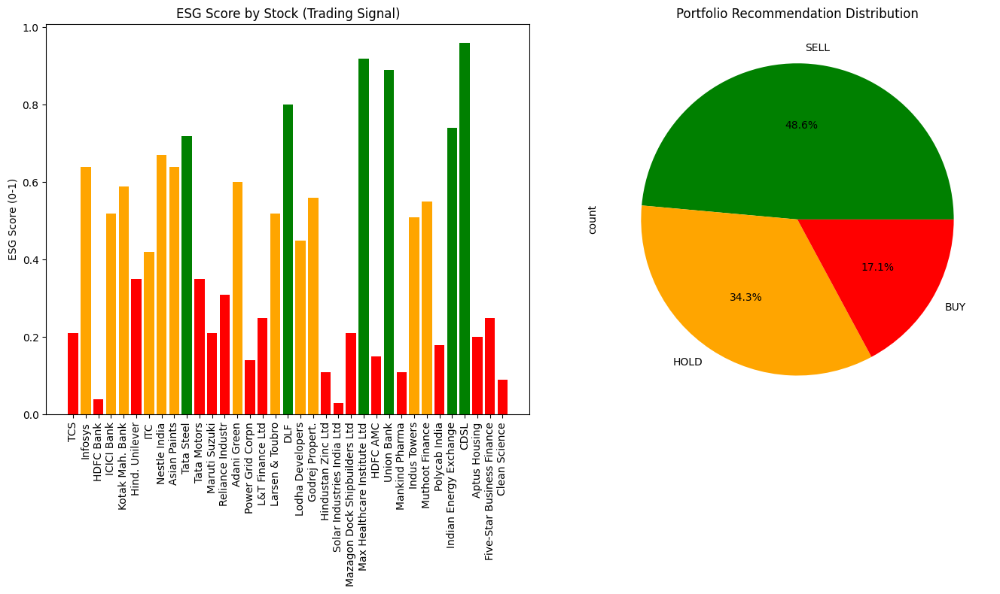

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import time

# List of stock symbols
tickers = {
    "TCS": "TCS.NS",
    "Infosys": "INFY.NS",
    "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS",
    "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS",
    "ITC": "ITC.NS",
    "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS",
    "Tata Steel": "TATASTEEL.NS",
    "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS",
    "Reliance Industr": "RELIANCE.NS",
    "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS",
    "L&T Finance Ltd": "LTF.NS",
    "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS",
    "Lodha Developers": "LODHA.NS",
    "Godrej Propert.": "GODREJPROP.NS",
    "Hindustan Zinc Ltd": "HINDZINC.NS",
    "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock Shipbuilders Ltd": "MAZDOCK.NS",
    "Max Healthcare Institute Ltd": "MAXHEALTH.NS",
    "HDFC AMC": "HDFCAMC.NS",
    "Union Bank": "UNIONBANK.NS",
    "Mankind Pharma": "MANKIND.NS",
    "Indus Towers": "INDUSTOWER.NS",
    "Muthoot Finance": "MUTHOOTFIN.NS",
    "Polycab India": "POLYCAB.NS",
    "Indian Energy Exchange": "IEX.NS",
    "CDSL": "CDSL.NS",
    "Aptus Housing": "APTUS.NS",
    "Five-Star Business Finance": "FIVESTAR.NS",
    "Clean Science": "CLEAN.NS"
}

# Dummy ESG scores (replace with your live ESG data if available)
import random
esg_scores = {stock: round(random.uniform(0, 1), 2) for stock in tickers.keys()}

def get_recommendation(score):
    if score >= 0.7:
        return "BUY"
    elif score >= 0.4:
        return "HOLD"
    else:
        return "SELL"

# Run live every 1 min
while True:
    data = []

    for stock, symbol in tickers.items():
        try:
            live_price = yf.Ticker(symbol).history(period="1d", interval="1m")["Close"].iloc[-1]
            score = esg_scores.get(stock, 0.5)
            decision = get_recommendation(score)
            data.append([stock, round(live_price, 2), score, decision])
        except:
            data.append([stock, None, None, "No Data"])

    df = pd.DataFrame(data, columns=["Stock", "Price (INR)", "ESG Score", "Recommendation"])
    print(df)

    # Visualization
    plt.figure(figsize=(14, 8))

    # Subplot 1: ESG Score Bar Chart
    plt.subplot(1, 2, 1)
    colors = df["Recommendation"].map({"BUY": "green", "HOLD": "orange", "SELL": "red"})
    plt.bar(df["Stock"], df["ESG Score"], color=colors)
    plt.xticks(rotation=90)
    plt.title("ESG Score by Stock (Trading Signal)")
    plt.ylabel("ESG Score (0-1)")

    # Subplot 2: Pie Chart of Recommendations
    plt.subplot(1, 2, 2)
    df["Recommendation"].value_counts().plot.pie(autopct="%1.1f%%", colors=["green", "orange", "red"])
    plt.title("Portfolio Recommendation Distribution")

    plt.tight_layout()
    plt.show()

    # Sleep for 1 min before refreshing
    time.sleep(60)


 ## ENTROPY


In [ ]:
import numpy as np

def portfolio_entropy(weights):
    """
    Calculate Shannon entropy of portfolio weights.
    Entropy = - Σ (w_i * log(w_i))

    Args:
        weights (array-like): Portfolio weights (must sum to 1)

    Returns:
        float: Entropy value
    """
    weights = np.array(weights)
    weights = weights[weights > 0]  # ignore zeros to avoid log(0)
    return -np.sum(weights * np.log(weights))

# Example: portfolio with 4 assets
weights = [0.4, 0.3, 0.2, 0.1]  # 40%, 30%, 20%, 10%
entropy_value = portfolio_entropy(weights)

print("Portfolio Weights:", weights)
print("Entropy (diversification measure):", entropy_value)


Portfolio Weights: [0.4, 0.3, 0.2, 0.1]
Entropy (diversification measure): 1.2798542258336674


/tmp/ipython-input-2365381023.py:53: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(list(tickers.values()), period="6mo")["Close"]
[*********************100%***********************]  35 of 35 completed



📊 Portfolio Entropy: 3.5085567466153402 

                                      Stock    Weight Signal
0                                       TCS  0.021549  BUY ✅
1                                   Infosys  0.025774  BUY ✅
2                                 HDFC Bank  0.041395  BUY ✅
3                                ICICI Bank  0.018908  BUY ✅
4                           Kotak Mah. Bank  0.022574  BUY ✅
5                            Hind. Unilever  0.023236  BUY ✅
6                                       ITC  0.020395  BUY ✅
7                              Nestle India  0.021060  BUY ✅
8                              Asian Paints  0.025640  BUY ✅
9                                Tata Steel  0.044834  BUY ✅
10                              Tata Motors  0.040031  BUY ✅
11                            Maruti Suzuki  0.022902  BUY ✅
12                         Reliance Industr  0.043503  BUY ✅
13                              Adani Green  0.014460  BUY ✅
14                         Power Grid Corp

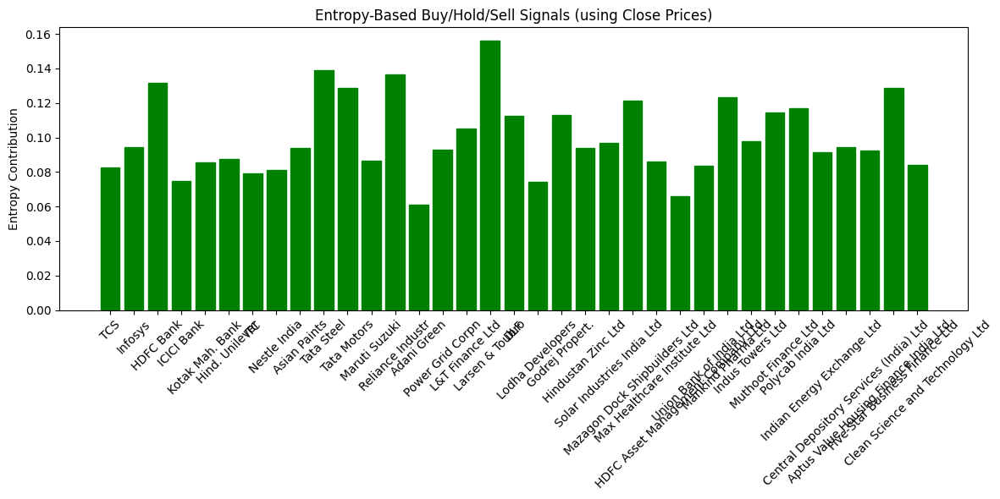

In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Stock List (demo subset, extendable) ---

# List of stock symbols
tickers = {
    ## large cap stocks
    "TCS": "TCS.NS",
    "Infosys": "INFY.NS",
    "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS",
    "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS",
    "ITC": "ITC.NS",
    "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS",
    "Tata Steel": "TATASTEEL.NS",
    "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS",
    "Reliance Industr": "RELIANCE.NS",
    "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS",
    "L&T Finance Ltd": "LTF.NS",
    "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS",
    "Lodha Developers": "LODHA.NS",
    "Godrej Propert.": "GODREJPROP.NS",

    # mid cap stocks
    "Hindustan Zinc Ltd": "HINDZINC.NS",
    "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock Shipbuilders Ltd": "MAZDOCK.NS",
    "Max Healthcare Institute Ltd": "MAXHEALTH.NS",
    "HDFC Asset Management Company Ltd": "HDFCAMC.NS",
    "Union Bank of India Ltd": "UNIONBANK.NS",
    "Mankind Pharma Ltd": "MANKIND.NS",
    "Indus Towers Ltd": "INDUSTOWER.NS",
    "Muthoot Finance Ltd": "MUTHOOTFIN.NS",
    "Polycab India Ltd": "POLYCAB.NS",

    # Small-cap stocks
    "Indian Energy Exchange Ltd": "IEX.NS",
    "Central Depository Services (India) Ltd": "CDSL.NS",
    "Aptus Value Housing Finance India Ltd": "APTUS.NS",
    "Five-Star Business Finance Ltd": "FIVESTAR.NS",
    "Clean Science and Technology Ltd": "CLEAN.NS"
}

# --- Download Live Data (using Close instead of Adj Close) ---
data = yf.download(list(tickers.values()), period="6mo")["Close"]

# --- Calculate Daily Returns ---
returns = data.pct_change().dropna()

# --- Compute Weights (Inverse Volatility method) ---
volatility = returns.std()
inv_vol = 1 / volatility
weights = inv_vol / inv_vol.sum()

# --- Entropy Functions ---
def portfolio_entropy(weights):
    """Shannon entropy of portfolio weights."""
    weights = np.array(weights)
    weights = weights[weights > 0]
    return -np.sum(weights * np.log(weights))

def stock_entropy_contribution(weights, tickers):
    """Contribution of each stock to entropy."""
    contributions = {}
    for t, w in zip(tickers.keys(), weights):
        contributions[t] = -w * np.log(w) if w > 0 else 0
    return contributions

def buy_sell_signal(weights, tickers, threshold=0.05):
    """Buy/Hold/Sell based on entropy contribution."""
    contrib = stock_entropy_contribution(weights, tickers)
    signals = {}
    for stock, value in contrib.items():
        if value > threshold:
            signals[stock] = "BUY ✅"
        elif value < threshold / 2:
            signals[stock] = "SELL ❌"
        else:
            signals[stock] = "HOLD ⚖️"
    return signals

# --- Calculate Entropy & Signals ---
entropy_value = portfolio_entropy(weights)
signals = buy_sell_signal(weights, tickers)

# --- Display Results ---
print("\n📊 Portfolio Entropy:", entropy_value, "\n")
df_signals = pd.DataFrame({
    "Stock": list(signals.keys()),
    "Weight": weights.values,
    "Signal": list(signals.values())
})
print(df_signals)

# --- Visualization ---
contrib = stock_entropy_contribution(weights, tickers)
plt.figure(figsize=(12,6))
bars = plt.bar(contrib.keys(), contrib.values(), edgecolor="black")
plt.xticks(rotation=45)
plt.ylabel("Entropy Contribution")
plt.title("Entropy-Based Buy/Hold/Sell Signals (using Close Prices)")

# Color bars by signals
for bar, stock in zip(bars, contrib.keys()):
    if signals[stock].startswith("BUY"):
        bar.set_color("green")
    elif signals[stock].startswith("SELL"):
        bar.set_color("red")
    else:
        bar.set_color("orange")

plt.tight_layout()
plt.show()


## Black Litter-man

## Black-Litterman Portfolio Model

The Black-Litterman portfolio model is a sophisticated asset allocation model developed by Fischer Black and Robert Litterman at Goldman Sachs. It blends investor views with market equilibrium (the CAPM-implied returns), addressing some limitations of traditional mean-variance optimization.

Objective

To create a more stable and realistic portfolio than traditional methods like Markowitz mean-variance, by combining market information with your own expectations (views).

Market-implied returns
These are the returns the market expects for each asset. We calculate them using a model like CAPM, which assumes investors are rational and markets are in balance.

Investor views
These are your own beliefs or forecasts. Example: “I think mid-cap stocks will do better than large-caps by 2%.” These views can be based on research, experience, or news.

Confidence in views
How sure you are about your opinions. High confidence means your view influences the portfolio more. Low confidence means the portfolio leans more on market data.

Why use the Black-Litterman model?

Because it gives you a balanced approach:

It respects market data (to avoid overreacting).

It lets you add your own views without making the portfolio unstable.

It prevents extreme or unrealistic asset weights often seen in traditional optimization.

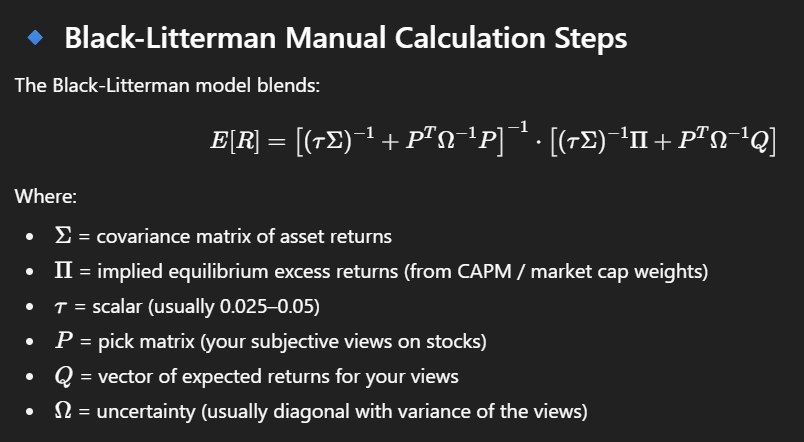

In [ ]:
import yfinance as yf
import pandas as pd
from datetime import datetime, timedelta

# Define time range (last 1 year)
end_date = datetime.today()
start_date = end_date - timedelta(days=365)

# Create empty DataFrame to store results
growth_df = pd.DataFrame(columns=["Company", "Start Price", "End Price", "Growth %"])

# Loop through each ticker
for company, ticker in tickers.items():
    try:
        data = yf.download(ticker, start=start_date, end=end_date)
        if not data.empty:
            start_price = data["Close"].iloc[0]
            end_price = data["Close"].iloc[-1]
            growth = ((end_price - start_price) / start_price) * 100
            growth_df = pd.concat([growth_df, pd.DataFrame({
                "Company": [company],
                "Start Price": [round(start_price, 2)],
                "End Price": [round(end_price, 2)],
                "Growth %": [round(growth, 2)]
            })])
    except Exception as e:
        print(f"Error fetching {company}: {e}")

# Reset index
growth_df.reset_index(drop=True, inplace=True)

# Show results
print(growth_df)


/tmp/ipython-input-4055630446.py:15: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start=start_date, end=end_date)
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-4055630446.py:15: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start=start_date, end=end_date)
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-4055630446.py:15: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start=start_date, end=end_date)
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-4055630446.py:15: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start=start_date, end=end_date)
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-4

                                    Company  \
0                                       TCS   
1                                   Infosys   
2                                 HDFC Bank   
3                                ICICI Bank   
4                           Kotak Mah. Bank   
5                            Hind. Unilever   
6                                       ITC   
7                              Nestle India   
8                              Asian Paints   
9                                Tata Steel   
10                              Tata Motors   
11                            Maruti Suzuki   
12                         Reliance Industr   
13                              Adani Green   
14                         Power Grid Corpn   
15                          L&T Finance Ltd   
16                          Larsen & Toubro   
17                                      DLF   
18                         Lodha Developers   
19                          Godrej Propert.   
20           

In [ ]:
index_symbol = "^NSEI"
lookback_days = 365 * 2
rf = 0.06
tau = 0.025
views = [
    {"assets": {"TCS": 1, "Infosys": -1}, "view": 0.02, "conf": 0.7},
    {"assets": {"HDFC Bank": 1}, "view": 0.03, "conf": 0.5},
]

def fetch_prices(symbols, start):
    data = yf.download(list(symbols), start=start, progress=False, threads=True)
    if ("Adj Close" in data.columns) or ("Adj Close" == data.columns.name):
        px = data["Adj Close"].copy() if "Adj Close" in data.columns else data.xs("Adj Close", axis=1, level=0)
    else:
        px = data["Close"].copy() if "Close" in data.columns else data.xs("Close", axis=1, level=0)
    if isinstance(px, pd.Series):
        px = px.to_frame()
    return px.dropna(how="all").ffill().dropna()

def last_valid_price(symbol):
    px = yf.download(symbol, period="5d", interval="1d", progress=False)
    col = "Adj Close" if "Adj Close" in px.columns else "Close"
    return float(px[col].iloc[-1])

def market_caps(symbol_map):
    caps = {}
    for name, sym in symbol_map.items():
        info = yf.Ticker(sym).fast_info
        price = info.get("last_price", None)
        if price is None or np.isnan(price):
            price = last_valid_price(sym)
        shares = info.get("shares", None)
        if (shares is None) or (shares == 0) or (shares != shares):
            alt = yf.Ticker(sym).get_info().get("marketCap", None)
            if alt is not None:
                caps[name] = float(alt)
                continue
            caps[name] = np.nan
        else:
            caps[name] = float(shares) * float(price)
    s = pd.Series(caps, dtype="float64")
    if s.isna().any():
        if s.notna().any():
            s = s.fillna(s.median())
        else:
            s = pd.Series({k: 1.0 for k in symbol_map.keys()}, dtype="float64")
    return s

def annualize_stats(rets, periods_per_year=252):
    mu = rets.mean() * periods_per_year
    cov = rets.cov() * periods_per_year
    return mu, cov

def risk_aversion_from_index(index_symbol, rf, start):
    px = fetch_prices([index_symbol], start=start)
    rets = np.log(px / px.shift(1)).dropna()
    mu_ann, cov_ann = annualize_stats(rets)
    var_ann = float(cov_ann.values.squeeze())
    mkt_mu = float(mu_ann.values.squeeze())
    delta = max(1e-6, (mkt_mu - rf) / max(1e-8, var_ann))
    return delta

def build_P_Q_Omega(views, assets, tau, Sigma):
    n = len(assets)
    k = len(views)
    P = np.zeros((k, n))
    Q = np.zeros(k)
    Omega = np.zeros((k, k))
    asset_index = {a: i for i, a in enumerate(assets)}
    for i, v in enumerate(views):
        for a, w in v["assets"].items():
            P[i, asset_index[a]] = float(w)
        Q[i] = float(v["view"])
        conf = max(1e-6, min(0.9999, float(v.get("conf", 0.5))))
        base_var = P[i, :].reshape(1, -1) @ Sigma @ P[i, :].reshape(-1, 1)
        base_var = float(base_var.squeeze())
        Omega[i, i] = ((1 - conf) / conf) * max(1e-10, base_var) * tau
    return P, Q, Omega

def black_litterman(Sigma, w_mkt, delta, tau, P, Q, Omega):
    Pi = delta * Sigma @ w_mkt
    A = np.linalg.inv(tau * Sigma)
    middle = P.T @ np.linalg.inv(Omega) @ P
    rhs = A @ Pi + P.T @ np.linalg.inv(Omega) @ Q
    post_prec = A + middle
    mu_bl = np.linalg.solve(post_prec, rhs)
    Sigma_bl = Sigma + np.linalg.inv(post_prec)
    return mu_bl, Sigma_bl, Pi

def weights_from_meanvar(mu, Sigma, delta):
    w = np.linalg.solve(Sigma + 1e-10*np.eye(Sigma.shape[0]), mu) / max(1e-8, delta)
    w = w / w.sum()
    return w

start_date = (datetime.today() - timedelta(days=lookback_days)).date()
px = fetch_prices(list(tickers.values()), start=start_date)
px.columns = list(tickers.keys())
rets = np.log(px / px.shift(1)).dropna()
mu_ann, Sigma_ann = annualize_stats(rets)
assets = list(mu_ann.index)
caps = market_caps({k: tickers[k] for k in assets})
w_mkt = (caps / caps.sum()).reindex(assets).fillna(1/len(assets)).values
w_mkt = w_mkt / w_mkt.sum()
w_mkt = w_mkt.reshape(-1, 1)
delta = risk_aversion_from_index(index_symbol, rf, start=start_date)
P, Q, Omega = build_P_Q_Omega(views, assets, tau, Sigma_ann.values)
mu_bl, Sigma_bl, Pi = black_litterman(Sigma_ann.values, w_mkt, delta, tau, P, Q, Omega)
w_bl = weights_from_meanvar(mu_bl, Sigma_bl, delta)

out = pd.DataFrame({
    "MktCapWeight": w_mkt.flatten()[:len(assets)],
    "EquilibriumMu(%)": Pi.flatten()[:len(assets)] * 100,
    "PosteriorMu(%)": mu_bl.flatten()[:len(assets)] * 100,
    "BL_Weights": w_bl.flatten()[:len(assets)]
}, index=assets)

print(out)


/tmp/ipython-input-4129843919.py:11: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(list(symbols), start=start, progress=False, threads=True)
/tmp/ipython-input-4129843919.py:21: FutureWarning: YF.download() has changed argument auto_adjust default to True
  px = yf.download(symbol, period="5d", interval="1d", progress=False)
/tmp/ipython-input-4129843919.py:23: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return float(px[col].iloc[-1])
/tmp/ipython-input-4129843919.py:21: FutureWarning: YF.download() has changed argument auto_adjust default to True
  px = yf.download(symbol, period="5d", interval="1d", progress=False)
/tmp/ipython-input-4129843919.py:23: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return float(px[col].iloc[-1])
/tmp/ipy

                                         MktCapWeight  EquilibriumMu(%)  \
TCS                                          0.095005         18.303047   
Infosys                                      0.052152          7.726217   
HDFC Bank                                    0.127421          4.987341   
ICICI Bank                                   0.086296         14.341557   
Kotak Mah. Bank                              0.033322          6.346109   
Hind. Unilever                               0.053984         13.045161   
ITC                                          0.044878          7.787362   
Nestle India                                 0.020074         13.379044   
Asian Paints                                 0.021303         10.563482   
Tata Steel                                   0.018127          5.344969   
Tata Motors                                  0.021939          1.606542   
Maruti Suzuki                                0.040340         10.370856   
Reliance Industr         

## **GAME THEORY**

##**🎯 Game Theory in Portfolio Optimization**

**Players**: Investors (risk-averse vs. risk-seeking) or asset classes (large-cap vs. mid-cap vs. small-cap).

**Strategies**: Portfolio allocation choices (weights assigned to stocks).

**Payoffs**: Expected returns adjusted for risk (Sharpe ratio, utility, etc.).

We can model this as a non-cooperative game where each “player” (stock group or investor type) chooses allocations to maximize their utility.
The solution will be the Nash Equilibrium of allocations.

📊 Interpretation

**Payoff Matrix** → Shows Sharpe ratios for both players under different strategy mixes.

**Nash Equilibria** → Stable allocation strategies where no player benefits by deviating.

You can extend this to:

3+ players (Large, Mid, Small caps).

Mixed strategies (probabilistic allocation).

Incorporate ESG scores / entropy as penalties in payoff.

In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
import nashpy as nash
import itertools

# ---- Stock Universe ----
tickers = {
    "TCS": "TCS.NS", "Infosys": "INFY.NS", "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS", "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS", "ITC": "ITC.NS", "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS", "Tata Steel": "TATASTEEL.NS", "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS", "Reliance Industr": "RELIANCE.NS", "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS", "L&T Finance Ltd": "LTF.NS", "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS", "Lodha Developers": "LODHA.NS", "Godrej Propert.": "GODREJPROP.NS",
    "Hindustan Zinc Ltd": "HINDZINC.NS", "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock Shipbuilders Ltd": "MAZDOCK.NS", "Max Healthcare Institute Ltd": "MAXHEALTH.NS",
    "HDFC AMC": "HDFCAMC.NS", "Union Bank": "UNIONBANK.NS", "Mankind Pharma": "MANKIND.NS",
    "Indus Towers": "INDUSTOWER.NS", "Muthoot Finance": "MUTHOOTFIN.NS", "Polycab India": "POLYCAB.NS",
    "IEX": "IEX.NS", "CDSL": "CDSL.NS", "Aptus Housing": "APTUS.NS", "Five-Star Finance": "FIVESTAR.NS",
    "Clean Science": "CLEAN.NS"
}

# ---- Download Price Data ----
data = yf.download(
    list(tickers.values()),
    start="2022-01-01",
    end="2025-01-01",
    auto_adjust=True
)['Close']

returns = data.pct_change().dropna()

# ---- Expected Returns & Covariance ----
mean_returns = returns.mean() * 252
cov_matrix = returns.cov() * 252

# ---- Define groups ----
large_mid_caps = ["TCS.NS","INFY.NS","HDFCBANK.NS","ICICIBANK.NS","KOTAKBANK.NS","HINDUNILVR.NS","ITC.NS"]
small_caps = ["IEX.NS","CDSL.NS","APTUS.NS","FIVESTAR.NS","CLEAN.NS"]

# ---- Payoff Function (Sharpe Ratio approx) ----
def payoff(portfolio):
    w = np.array([1/len(portfolio)]*len(portfolio))  # equal weights
    ret = np.dot(w, mean_returns[portfolio])
    vol = np.sqrt(np.dot(w.T, np.dot(cov_matrix.loc[portfolio, portfolio], w)))
    return ret/vol  # Sharpe ratio

# Player strategies
player1_strategies = [large_mid_caps, large_mid_caps[:4], large_mid_caps[-3:]]
player2_strategies = [small_caps, small_caps[:2], small_caps[-2:]]

# Build payoff matrices
A = np.zeros((len(player1_strategies), len(player2_strategies)))  # Player 1
B = np.zeros((len(player1_strategies), len(player2_strategies)))  # Player 2

for i, s1 in enumerate(player1_strategies):
    for j, s2 in enumerate(player2_strategies):
        A[i, j] = payoff(s1)   # Player 1 payoff
        B[i, j] = payoff(s2)   # Player 2 payoff

# ---- Nash Equilibrium ----
game = nash.Game(A, B)
equilibria = list(game.support_enumeration())

print("Payoff Matrix for Player 1:\n", A)
print("Payoff Matrix for Player 2:\n", B)
print("\nNash Equilibria:\n", equilibria)


[*********************100%***********************]  35 of 35 completed


Payoff Matrix for Player 1:
 [[1.07507315 1.07507315 1.07507315]
 [1.42195124 1.42195124 1.42195124]
 [0.20472796 0.20472796 0.20472796]]
Payoff Matrix for Player 2:
 [[1.45589938 1.72612072 0.63187203]
 [1.45589938 1.72612072 0.63187203]
 [1.45589938 1.72612072 0.63187203]]

Nash Equilibria:
 [(array([0., 1., 0.]), array([0., 1., 0.]))]


In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
import nashpy as nash
import itertools

# ---- Stock Universe ----
tickers = {
    "TCS": "TCS.NS", "Infosys": "INFY.NS", "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS", "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS", "ITC": "ITC.NS", "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS", "Tata Steel": "TATASTEEL.NS", "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS", "Reliance Industr": "RELIANCE.NS", "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS", "L&T Finance Ltd": "LTF.NS", "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS", "Lodha Developers": "LODHA.NS", "Godrej Propert.": "GODREJPROP.NS",
    "Hindustan Zinc Ltd": "HINDZINC.NS", "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock Shipbuilders Ltd": "MAZDOCK.NS", "Max Healthcare Institute Ltd": "MAXHEALTH.NS",
    "HDFC AMC": "HDFCAMC.NS", "Union Bank": "UNIONBANK.NS", "Mankind Pharma": "MANKIND.NS",
    "Indus Towers": "INDUSTOWER.NS", "Muthoot Finance": "MUTHOOTFIN.NS", "Polycab India": "POLYCAB.NS",
    "IEX": "IEX.NS", "CDSL": "CDSL.NS", "Aptus Housing": "APTUS.NS", "Five-Star Finance": "FIVESTAR.NS",
    "Clean Science": "CLEAN.NS"
}

# ---- Download Price Data ----
data = yf.download(list(tickers.values()), start="2022-01-01", end="2025-01-01")
if "Adj Close" in data.columns:
    prices = data["Adj Close"].dropna()
elif "Close" in data.columns:
    prices = data["Close"].dropna()
else:
    raise ValueError("Neither 'Adj Close' nor 'Close' found in data.")

returns = prices.pct_change().dropna()

# ---- Expected Returns & Covariance ----
mean_returns = returns.mean() * 252
cov_matrix = returns.cov() * 252

# ---- Define groups ----
large_mid_caps = ["TCS.NS","INFY.NS","HDFCBANK.NS","ICICIBANK.NS","KOTAKBANK.NS","HINDUNILVR.NS","ITC.NS"]
small_caps = ["IEX.NS","CDSL.NS","APTUS.NS","FIVESTAR.NS","CLEAN.NS"]

# ---- Payoff Function (Sharpe Ratio approx) ----
def payoff(portfolio):
    # Ensure portfolio list contains valid tickers that exist in mean_returns and cov_matrix indices
    valid_portfolio = [t for t in portfolio if t in mean_returns.index and t in cov_matrix.index]
    if not valid_portfolio:
        return 0 # Or handle appropriately

    w = np.array([1/len(valid_portfolio)]*len(valid_portfolio))  # equal weights
    ret = np.dot(w, mean_returns[valid_portfolio])
    # Ensure sub-matrix is created with valid tickers
    sub_cov_matrix = cov_matrix.loc[valid_portfolio, valid_portfolio]
    vol = np.sqrt(np.dot(w.T, np.dot(sub_cov_matrix, w)))
    return ret/vol  # Sharpe ratio


# Player strategies
player1_strategies = [large_mid_caps, large_mid_caps[:4], large_mid_caps[-3:]]
player2_strategies = [small_caps, small_caps[:2], small_caps[-2:]]

# Build payoff matrices
A = np.zeros((len(player1_strategies), len(player2_strategies)))  # Player 1
B = np.zeros((len(player1_strategies), len(player2_strategies)))  # Player 2

for i, s1 in enumerate(player1_strategies):
    for j, s2 in enumerate(player2_strategies):
        A[i, j] = payoff(s1)   # Player 1 payoff
        B[i, j] = payoff(s2)   # Player 2 payoff

# ---- Nash Equilibrium ----
game = nash.Game(A, B)
equilibria = list(game.support_enumeration())

print("Payoff Matrix for Player 1:\n", A)
print("Payoff Matrix for Player 2:\n", B)
print("\nNash Equilibria:\n", equilibria)

The portfolio is not just a collection of stocks—it’s a strategic battleground where each asset is a player in a game, competing and cooperating to secure its place in the portfolio. Instead of blindly chasing returns, the code applies game theory to understand how these “players” interact, building a payoff matrix that captures both risk and reward. By finding the Nash equilibrium, the model uncovers a state of balance—where no stock can gain an advantage by shifting its strategy alone. This transforms portfolio optimization into a chess-like game of finance, where the final allocation is not only mathematically optimal but also strategically resilient. It’s a fresh and creative twist on investing, blending the precision of mathematics with the psychology of strategic decision-making.

In [ ]:
# Download stock price data
data = yf.download(
    list(tickers.values()),
    start="2022-01-01",
    end="2025-01-01",
    auto_adjust=True  # ensures clean 'Close' prices
)['Close']

# Calculate log returns
returns = np.log(data / data.shift(1)).dropna()

# Mean returns & covariance
mean_returns = returns.mean() * 252
cov_matrix = returns.cov() * 252

# Construct payoff matrix (expected returns vs risk penalty)
# Payoff ~ Expected Return - λ * Variance
lam = 0.5
payoff_matrix = pd.DataFrame(
    np.outer(mean_returns, np.ones(len(mean_returns))) -
    lam * np.outer(np.ones(len(mean_returns)), np.diag(cov_matrix)),
    index=mean_returns.index,
    columns=mean_returns.index
)

print("\nPayoff Matrix (Game Theory Setup):")
print(payoff_matrix.round(4))

# Create a 2-player zero-sum game (Investor vs Market)
A = payoff_matrix.values
game = nash.Game(A, -A)

# Find Nash Equilibrium (mixed strategy)
equilibria = list(game.support_enumeration())
print("\nNash Equilibria (Mixed Strategies):")
for eq in equilibria:
    print(eq)

# Convert equilibrium strategy into portfolio weights
if equilibria:
    investor_strategy = equilibria[0][0]
    portfolio_weights = pd.Series(investor_strategy, index=mean_returns.index)
    print("\nOptimal Portfolio Weights (Game Theory):")
    print(portfolio_weights.round(4))

    # Visualization
    plt.figure(figsize=(8, 6))
    portfolio_weights.plot(kind="bar", color="teal", alpha=0.7)
    plt.title("Game Theory Optimal Portfolio Allocation (Nash Equilibrium)")
    plt.ylabel("Weight")
    plt.xlabel("Stocks")
    plt.xticks(rotation=45)
    plt.show()


[*********************100%***********************]  35 of 35 completed



Payoff Matrix (Game Theory Setup):
Ticker         ADANIGREEN.NS  APTUS.NS  ASIANPAINT.NS  CDSL.NS  CLEAN.NS  \
Ticker                                                                     
ADANIGREEN.NS        -0.0529    0.0366         0.0693   0.0107    0.0526   
APTUS.NS             -0.0535    0.0360         0.0687   0.0101    0.0521   
ASIANPAINT.NS        -0.3058   -0.2163        -0.1836  -0.2422   -0.2003   
CDSL.NS               0.6646    0.7541         0.7868   0.7282    0.7701   
CLEAN.NS             -0.1669   -0.0774        -0.0447  -0.1033   -0.0614   
DLF.NS                0.2690    0.3585         0.3912   0.3326    0.3745   
FIVESTAR.NS           0.0827    0.1722         0.2050   0.1463    0.1883   
GODREJPROP.NS         0.3203    0.4098         0.4425   0.3839    0.4258   
HDFCAMC.NS            0.4035    0.4930         0.5257   0.4671    0.5090   
HDFCBANK.NS          -0.0716    0.0179         0.0506  -0.0080    0.0339   
HINDUNILVR.NS        -0.1691   -0.0796        -0.046

KeyboardInterrupt: 

In [9]:
import yfinance as yf
import pandas as pd
import numpy as np
import random
import time
from scipy.optimize import minimize

# -----------------------------
# 1. Stock Universe
# -----------------------------
tickers = {
    "TCS": "TCS.NS", "Infosys": "INFY.NS", "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS", "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS", "ITC": "ITC.NS", "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS", "Tata Steel": "TATASTEEL.NS", "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS", "Reliance Industr": "RELIANCE.NS", "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS", "L&T Finance Ltd": "LTF.NS", "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS", "Lodha Developers": "LODHA.NS", "Godrej Propert.": "GODREJPROP.NS",
    "Hindustan Zinc Ltd": "HINDZINC.NS", "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock": "MAZDOCK.NS", "Max Healthcare": "MAXHEALTH.NS", "HDFC AMC": "HDFCAMC.NS",
    "Union Bank": "UNIONBANK.NS", "Mankind Pharma": "MANKIND.NS", "Indus Towers": "INDUSTOWER.NS",
    "Muthoot Finance": "MUTHOOTFIN.NS", "Polycab India": "POLYCAB.NS",
    "IEX": "IEX.NS", "CDSL": "CDSL.NS", "Aptus Housing": "APTUS.NS",
    "Five-Star Fin": "FIVESTAR.NS", "Clean Science": "CLEAN.NS"
}

# -----------------------------
# 2. ESG Scoring
# -----------------------------
def esg_decision(score):
    if score >= 0.7:
        return "BUY"
    elif score >= 0.4:
        return "HOLD"
    else:
        return "SELL"

# -----------------------------
# 3. Black-Litterman Model
# -----------------------------
def black_litterman(cov, pi, P, Q, tau=0.05, omega=None):
    """
    cov: covariance matrix of returns
    pi: equilibrium excess returns (CAPM prior)
    P: link matrix for investor views
    Q: expected returns for views
    """
    if omega is None:
        omega = np.diag(np.diag(P @ cov @ P.T)) * tau

    M = np.linalg.inv(np.linalg.inv(tau * cov) + P.T @ np.linalg.inv(omega) @ P)
    adj_return = M @ (np.linalg.inv(tau * cov) @ pi + P.T @ np.linalg.inv(omega) @ Q)
    return adj_return

# -----------------------------
# 4. Entropy-based Diversification
# -----------------------------
def entropy_obj(w, mu, cov, lam=0.1):
    w = np.array(w)
    ret = w @ mu
    risk = w @ cov @ w
    entropy = -np.sum(w * np.log(w + 1e-9))  # Shannon entropy
    return -(ret - lam * risk + 0.01 * entropy)

# -----------------------------
# 5. Game Theory Allocation
# -----------------------------
def nash_bargaining(mu, cov, esg_scores):
    n = len(mu)
    init_w = np.ones(n) / n

    cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0, 1)] * n

    def utility(w):
        ret = w @ mu
        risk = w @ cov @ w
        esg = np.sum(w * esg_scores)
        # Nash product: maximize joint satisfaction
        return -(np.log(ret + 1e-9) + np.log(esg + 1e-9) - np.log(risk + 1e-9))

    res = minimize(utility, init_w, constraints=cons, bounds=bounds)
    return res.x if res.success else init_w

# -----------------------------
# 6. Live ESG + Optimization
# -----------------------------
def run_portfolio():
    # Fetch 1 year of data
    data = yf.download(list(tickers.values()), period="1y")["Close"].dropna()
    log_ret = np.log(data / data.shift(1)).dropna()
    mu = log_ret.mean().values * 252
    cov = log_ret.cov().values * 252

    # ESG scores (dummy random for now, replace with real ESG API later)
    esg_scores = np.array([round(random.uniform(0, 1), 2) for _ in range(len(tickers))])

    # Black-Litterman (example: bullish view on Reliance + Infosys)
    pi = mu
    P = np.array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1] + [0] * (len(tickers) - 13)])
    Q = np.array([0.15])  # expected excess return
    bl_mu = black_litterman(cov, pi, P, Q)

    # Entropy optimization
    n = len(mu)
    init_w = np.ones(n) / n
    cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0, 1)] * n
    res = minimize(entropy_obj, init_w, args=(bl_mu, cov), constraints=cons, bounds=bounds)
    entropy_weights = res.x if res.success else init_w

    # Game-theory allocation
    gt_weights = nash_bargaining(bl_mu, cov, esg_scores)

    # Combine strategies (equal blend for demo)
    final_weights = 0.5 * entropy_weights + 0.5 * gt_weights

    df = pd.DataFrame({
        "Stock": list(tickers.keys()),
        "Symbol": list(tickers.values()),
        "ESG Score": esg_scores,
        "BL Expected Return": bl_mu,
        "Entropy Wt": entropy_weights,
        "Game Theory Wt": gt_weights,
        "Final Wt": final_weights
    })

    return df.sort_values(by="Final Wt", ascending=False)

# -----------------------------
# Run Once
# -----------------------------
if __name__ == "__main__":
    portfolio = run_portfolio()
    print("\n=== Optimized Portfolio ===")
    print(portfolio.head(15))


C:\Users\Bhoomi\AppData\Local\Temp\ipykernel_21872\1179461625.py:90: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(list(tickers.values()), period="1y")["Close"].dropna()
[*********************100%***********************]  35 of 35 completed



=== Optimized Portfolio ===
                 Stock         Symbol  ESG Score  BL Expected Return  \
25          Union Bank   UNIONBANK.NS       0.89            0.434778   
24            HDFC AMC     HDFCAMC.NS       0.66            0.348976   
20  Hindustan Zinc Ltd    HINDZINC.NS       0.71            0.307475   
8         Asian Paints  ASIANPAINT.NS       0.42            0.298149   
22        Mazagon Dock     MAZDOCK.NS       0.85            0.230034   
7         Nestle India   NESTLEIND.NS       0.15           -0.460516   
10         Tata Motors  TATAMOTORS.NS       0.12           -0.151811   
4      Kotak Mah. Bank   KOTAKBANK.NS       0.97           -0.328250   
34       Clean Science       CLEAN.NS       0.75            0.140366   
31                CDSL        CDSL.NS       0.79           -0.344878   
23      Max Healthcare   MAXHEALTH.NS       0.10            0.154906   
16     Larsen & Toubro          LT.NS       0.76           -0.211277   
18    Lodha Developers       LODHA.

C:\Users\Bhoomi\AppData\Local\Temp\ipykernel_21872\1179461625.py:80: RuntimeWarning: invalid value encountered in log
  return -(np.log(ret + 1e-9) + np.log(esg + 1e-9) - np.log(risk + 1e-9))


In [10]:
# app.py
from fastapi import FastAPI
from fastapi.responses import HTMLResponse, JSONResponse
from fastapi.middleware.cors import CORSMiddleware
import yfinance as yf
import pandas as pd
import numpy as np
import random
from scipy.optimize import minimize

app = FastAPI(title="ESG + BL + Entropy + GameTheory Portfolio API")

# allow local testing from browser
app.add_middleware(
    CORSMiddleware,
    allow_origins=["*"],
    allow_credentials=True,
    allow_methods=["*"],
    allow_headers=["*"],
)

# -----------------------------
# 1. Stock Universe (keys -> ticker symbols)
# -----------------------------
TICKERS = {
    "TCS": "TCS.NS", "Infosys": "INFY.NS", "HDFC Bank": "HDFCBANK.NS",
    "ICICI Bank": "ICICIBANK.NS", "Kotak Mah. Bank": "KOTAKBANK.NS",
    "Hind. Unilever": "HINDUNILVR.NS", "ITC": "ITC.NS", "Nestle India": "NESTLEIND.NS",
    "Asian Paints": "ASIANPAINT.NS", "Tata Steel": "TATASTEEL.NS", "Tata Motors": "TATAMOTORS.NS",
    "Maruti Suzuki": "MARUTI.NS", "Reliance Industr": "RELIANCE.NS", "Adani Green": "ADANIGREEN.NS",
    "Power Grid Corpn": "POWERGRID.NS", "L&T Finance Ltd": "LTF.NS", "Larsen & Toubro": "LT.NS",
    "DLF": "DLF.NS", "Lodha Developers": "LODHA.NS", "Godrej Propert.": "GODREJPROP.NS",
    "Hindustan Zinc Ltd": "HINDZINC.NS", "Solar Industries India Ltd": "SOLARINDS.NS",
    "Mazagon Dock": "MAZDOCK.NS", "Max Healthcare": "MAXHEALTH.NS", "HDFC AMC": "HDFCAMC.NS",
    "Union Bank": "UNIONBANK.NS", "Mankind Pharma": "MANKIND.NS", "Indus Towers": "INDUSTOWER.NS",
    "Muthoot Finance": "MUTHOOTFIN.NS", "Polycab India": "POLYCAB.NS",
    "IEX": "IEX.NS", "CDSL": "CDSL.NS", "Aptus Housing": "APTUS.NS",
    "Five-Star Fin": "FIVESTAR.NS", "Clean Science": "CLEAN.NS"
}

# -----------------------------
# helpers / models
# -----------------------------
def esg_decision(score: float) -> str:
    if score >= 0.7:
        return "BUY"
    elif score >= 0.4:
        return "HOLD"
    else:
        return "SELL"

def black_litterman(cov, pi, P, Q, tau=0.05, omega=None):
    # small regularization to covariance to avoid singular matrices
    cov = cov + np.eye(cov.shape[0]) * 1e-8
    if omega is None:
        omega = np.diag(np.diag(P @ cov @ P.T)) * tau
    inv_tau_cov = np.linalg.inv(tau * cov)
    inv_omega = np.linalg.inv(omega)
    M = np.linalg.inv(inv_tau_cov + P.T @ inv_omega @ P)
    adj_return = M @ (inv_tau_cov @ pi + P.T @ inv_omega @ Q)
    return adj_return

def entropy_obj(w, mu, cov, lam=0.1):
    w = np.array(w)
    # keep feasible
    if np.any(w < 0):
        return 1e9
    ret = w @ mu
    risk = w @ cov @ w
    entropy = -np.sum(w * np.log(w + 1e-12))
    # negative because we minimize
    return -(ret - lam * risk + 0.01 * entropy)

def nash_bargaining(mu, cov, esg_scores):
    n = len(mu)
    init_w = np.ones(n) / n
    cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0, 1)] * n

    def utility(w):
        ret = w @ mu
        risk = w @ cov @ w
        esg = np.sum(w * esg_scores)
        # avoid invalid logs
        ret = max(ret, 1e-12)
        esg = max(esg, 1e-12)
        risk = max(risk, 1e-12)
        return -(np.log(ret) + np.log(esg) - np.log(risk))

    res = minimize(utility, init_w, constraints=cons, bounds=bounds)
    return res.x if res.success else init_w

# -----------------------------
# Core optimization pipeline
# -----------------------------
def build_portfolio(use_esg_random=True):
    symbols = list(TICKERS.values())
    names = list(TICKERS.keys())

    # Fetch Close prices for 1 year
    df = yf.download(symbols, period="1y")["Close"].dropna(how="all")
    # If only single column returned (one ticker), ensure DataFrame
    if isinstance(df, pd.Series):
        df = df.to_frame()

    # Align columns: columns will be ticker symbols. If multi-index happened, normalize:
    if isinstance(df.columns, pd.MultiIndex):
        # when group_by or other behavior causes MultiIndex, try to pick level 'Close'
        df = df.xs("Close", axis=1, level=1, drop_level=True)

    # Ensure we have all requested tickers that returned data
    available_symbols = [c for c in df.columns]
    # convert to log returns
    log_ret = np.log(df / df.shift(1)).dropna()
    mu = log_ret.mean().values * 252  # annualized expected returns
    cov = log_ret.cov().values * 252  # annualized covariance

    n = len(mu)
    # ESG: placeholder random or can be replaced by real ESG fetch
    if use_esg_random:
        esg_scores = np.array([round(random.uniform(0, 1), 4) for _ in range(n)])
    else:
        esg_scores = np.zeros(n)

    # Black-Litterman: create a simple view: bullish on Reliance Industr and Infosys if present
    pi = mu.copy()
    # Find indices for view tickers
    view_tickers = ["Reliance Industr", "Infosys"]
    P = np.zeros((1, n))
    for t in view_tickers:
        if t in names:
            idx = names.index(t)
            P[0, idx] = 1.0 / len(view_tickers)  # distribute view weight
    Q = np.array([0.10])  # expected excess return for the view (example)
    bl_mu = black_litterman(cov, pi, P, Q)

    # Entropy optimization (minimize negative of objective so we use minimize)
    init_w = np.ones(n) / n
    cons = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = [(0, 1)] * n
    res = minimize(entropy_obj, init_w, args=(bl_mu, cov), constraints=cons, bounds=bounds)
    entropy_weights = res.x if res.success else init_w

    # Game theory allocation
    gt_weights = nash_bargaining(bl_mu, cov, esg_scores)

    # Combine strategies (blend)
    final_weights = 0.5 * entropy_weights + 0.5 * gt_weights

    # Build DataFrame output
    out = pd.DataFrame({
        "Stock": names,
        "Symbol": symbols,
        "ESG Score": esg_scores,
        "BL Expected Return": bl_mu,
        "Entropy Wt": entropy_weights,
        "GT Wt": gt_weights,
        "Final Wt": final_weights
    })

    # derive a recommended action:
    # Primary signal: ESG BUY/HOLD/SELL
    # Secondary: if final weight above the top tertile -> strong BUY, middle -> HOLD, bottom -> SELL
    tertiles = np.percentile(out["Final Wt"].values, [33.33, 66.66])
    actions = []
    for idx, row in out.iterrows():
        esg_signal = esg_decision(row["ESG Score"])
        if row["Final Wt"] >= tertiles[1]:
            weight_signal = "BUY"
        elif row["Final Wt"] >= tertiles[0]:
            weight_signal = "HOLD"
        else:
            weight_signal = "SELL"

        # combine signals: if both agree -> that action, else prefer ESG as filter
        if esg_signal == weight_signal:
            final_action = esg_signal
        else:
            # prefer ESG unless final weight strongly contradicts (e.g., top vs ESG SELL)
            if esg_signal == "SELL" and row["Final Wt"] >= tertiles[1]:
                final_action = "HOLD"
            else:
                final_action = esg_signal

        actions.append({
            "ESG Signal": esg_signal,
            "Weight Signal": weight_signal,
            "Final Action": final_action
        })

    action_df = pd.DataFrame(actions)
    out = pd.concat([out.reset_index(drop=True), action_df.reset_index(drop=True)], axis=1)
    out = out.sort_values(by="Final Wt", ascending=False).reset_index(drop=True)
    return out

# -----------------------------
# API endpoints
# -----------------------------
@app.get("/", response_class=HTMLResponse)
def homepage():
    html = """
    <!doctype html>
    <html>
      <head>
        <meta charset="utf-8"/>
        <title>Portfolio Optimizer</title>
        <style>
          body { font-family: Arial, sans-serif; margin: 20px; background:#f5f5f5; }
          table { border-collapse: collapse; width: 100%; background: white; }
          th, td { padding: 8px 10px; border: 1px solid #ddd; text-align: center; }
          th { background: #333; color: white; }
          .buy { background: #d4f8d4; }
          .sell { background: #ffd6d6; }
          .hold { background: #fff7d6; }
        </style>
      </head>
      <body>
        <h2>ESG + Black-Litterman + Entropy + GameTheory Portfolio</h2>
        <p>Click Refresh to fetch live data and compute recommendations.</p>
        <button id="refresh">Refresh</button>
        <div id="last">Not fetched yet.</div>
        <div id="table-area"></div>
        <script>
          async function fetchPortfolio() {
            document.getElementById('last').innerText = 'Fetching...';
            try {
              const res = await fetch('/api/portfolio');
              const json = await res.json();
              document.getElementById('last').innerText = 'Last update: ' + new Date().toLocaleString();
              renderTable(json.data);
            } catch (e) {
              document.getElementById('last').innerText = 'Error fetching data: ' + e;
            }
          }
          function renderTable(rows) {
            if (!rows || rows.length === 0) {
              document.getElementById('table-area').innerHTML = '<p>No data.</p>';
              return;
            }
            let html = '<table><thead><tr>';
            const keys = Object.keys(rows[0]);
            for (const k of keys) html += '<th>' + k + '</th>';
            html += '</tr></thead><tbody>';
            for (const r of rows) {
              let cls = '';
              if (r["Final Action"] === 'BUY') cls = 'buy';
              if (r["Final Action"] === 'SELL') cls = 'sell';
              if (r["Final Action"] === 'HOLD') cls = 'hold';
              html += `<tr class="${cls}">`;
              for (const k of keys) {
                let v = r[k];
                if (typeof v === 'number') v = v.toFixed(4);
                html += '<td>' + v + '</td>';
              }
              html += '</tr>';
            }
            html += '</tbody></table>';
            document.getElementById('table-area').innerHTML = html;
          }
          document.getElementById('refresh').addEventListener('click', fetchPortfolio);
          // auto fetch once
          fetchPortfolio();
        </script>
      </body>
    </html>
    """
    return HTMLResponse(content=html, status_code=200)

@app.get("/api/portfolio")
def api_portfolio():
    try:
        df = build_portfolio(use_esg_random=True)
        # convert to JSON-friendly
        data = df.to_dict(orient="records")
        return JSONResponse({"success": True, "data": data})
    except Exception as e:
        return JSONResponse({"success": False, "error": str(e)}, status_code=500)

# You can add more endpoints (single stock info, ESG feed, etc.)
# Run with: uvicorn app:app --reload


In [11]:
pip install fastapi uvicorn yfinance pandas numpy scipy


Note: you may need to restart the kernel to use updated packages.


In [12]:
uvicorn app:app --reload


SyntaxError: invalid syntax (1867459706.py, line 1)